<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_0913.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [6]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [7]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [8]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [9]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [10]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [11]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [12]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    if train_opt.weight_init:
        adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)

    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) # + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = alpha

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            #loss =  g_loss + a_loss #+ torch.std(torch.tensor((g_loss,a_loss)))
            loss =  (lambda1*g_loss + (1-lambda1)*a_loss) * 2
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [13]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [14]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [15]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [16]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [17]:

def draw_chart(axis,legends,title, df,color,showfliers=True):
    if legends == None:
        legends = []

    legends.append((title,color))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    axis.set_title(title,fontdict={'fontsize':10})
    #axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.05, 1.0), loc='upper left')
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['Testset F1']=[]
    result_table['Initial F1']=[]
    result_table['Mean F1']=[]
    result_table['Last F1']=[]
    result_table['Elapsed time']=[]
    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,result_data,train_data,result_table):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['Testset F1'].append(tad[0])
    result_table['Initial F1'].append(tad[1])
    result_table['Mean F1'].append(np.mean(tad))
    result_table['Last F1'].append(tad[-1])
    result_table['Elapsed time'].append(et)

def set_mean_sem(df):
    df.loc[len(df)] = df.median()
    df.loc[len(df)] = df[0:len(df)-1].std()
    df.at[len(df)-2,'Trial'] = 'median'
    df.at[len(df)-1,'Trial'] = 'std'

In [18]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            #org_discriminators.append(last_discriminator)
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)
            print('Normal model mean        :',np.mean(nor_result_table['Mean F1']))
            print('G-CDTL model mean:',np.mean(gcd_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

## SEA

In [19]:

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model(data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                self.models.pop(hist_f1.index(min_f1))
                self.models.append(model)
        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)


## AUE2

In [20]:

class Ensemble_AUE2():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.weights = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(f_data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, f_target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss
        return (discriminator,loss.cpu().data.numpy())

    def calc_loss(self,data,target):
        self.weights = []
        bce_loss = nn.BCELoss()
        for m in self.models:
            loss = bce_loss(m(data), target.reshape(-1,1))
            self.weights.append(loss.cpu().data.numpy())


    def add_model(self,model,data,target):
        # model = (model,loss)
        # 여기서 m은 실제 model 이고, loss는 weight를 계산하기 위해서...
        # model[0] -> model
        # model[1] -> loss
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model[0](data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                pop_index = hist_f1.index(min_f1)
                self.models.pop(pop_index)
                self.models.append(model[0])
            self.calc_loss(data,target)
        elif len(self.models) == 0:
            self.models.append(model[0])
            self.weights.append(model[1])
        else:
            self.models.append(model[0])
            self.calc_loss(data,target)

    def predict(self,data):

        weights = np.asarray([1/w for w in self.weights])
        normalized_weights = weights / np.linalg.norm(weights)
        return np.sum(np.asarray([normalized_weights[i]*m(data).cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)


## DTEL

In [21]:

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        self.data = data
        self.target = target
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=0.001)
            for itr in range(self.epoch):
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


In [22]:

def compare_algorithm(discriminator,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = X_live_unit.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        new_model = ensemble.train_new_model(b_dim,4000,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit)
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',np.mean(ensemble.early_stop_at))

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [23]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,weight_init = False,isTest = False):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            org_discriminators.append((last_discriminator,df_loss['Predictor loss'][-1:].values[0]))
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))

    if isTest:
        original_statistics_df = pd.DataFrame(nor_result_table)
        drift_statistics_df = pd.DataFrame(gcd_result_table)
        return original_statistics_df,drift_statistics_df

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/2) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)
            ensemble_sea = Ensemble_SEA(3,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(3,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx],None,None)

            ensemble_dte = Ensemble_DTEL(3,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    print('@ Normal model')
    display(original_statistics_df)
    print('@ SEA')
    display(sea_statistics_df)
    print('@ AUE2')
    display(aue_statistics_df)
    print('@ DTEL')
    display(dte_statistics_df)
    print('@ G-CDTL')
    display(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot([original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 drift_statistics_df['Mean F1'][0:trial_count].values] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 for each algorithm')

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 drift_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm')

    plt.show()

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

# 이론

## A Streaming Ensemble Algorithm (SEA)
+ https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=3d9f3f1f85c1f854060285fd95fd476dfed2c808

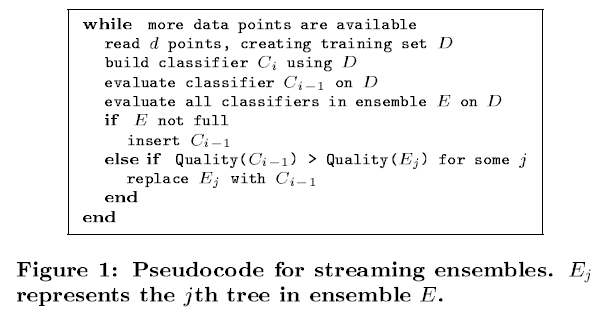

## Reacting to Different Types of Concept Drift:The Accuracy Updated Ensemble Algorithm (AUE2)

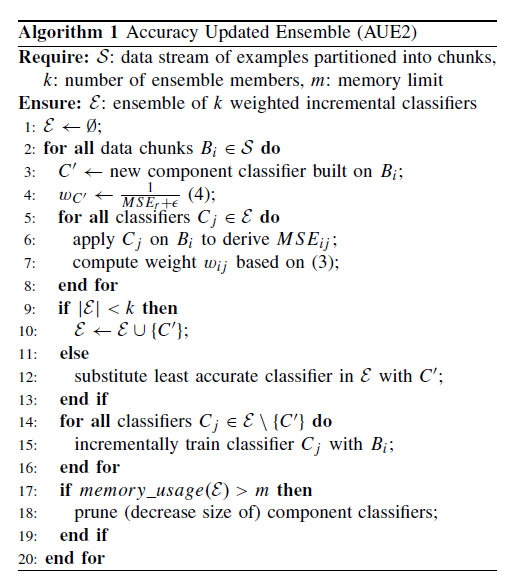

## Concept Drift Adaptation by Exploiting HistoricalKnowledge (DTEL)

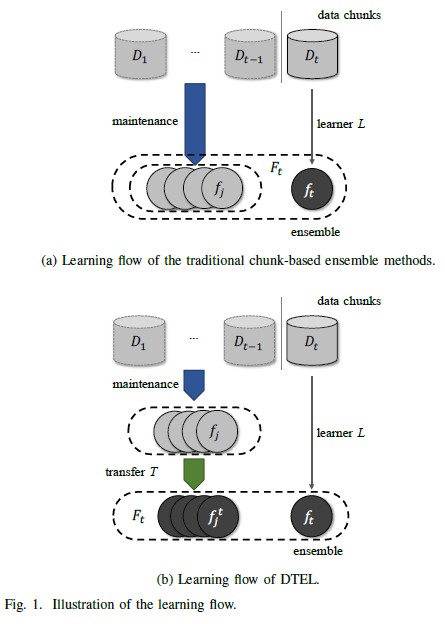

## Generative-CDTL

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G
\tag{23}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [24]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [25]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [26]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


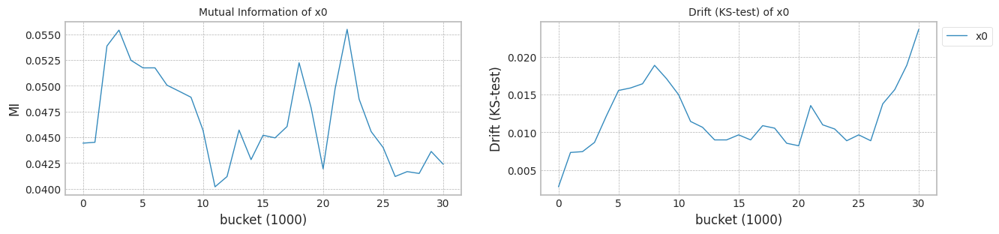

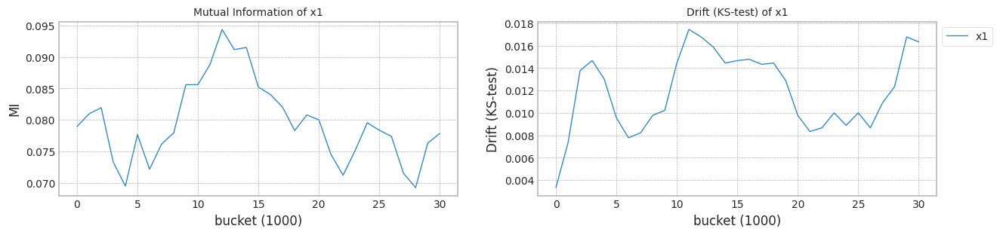

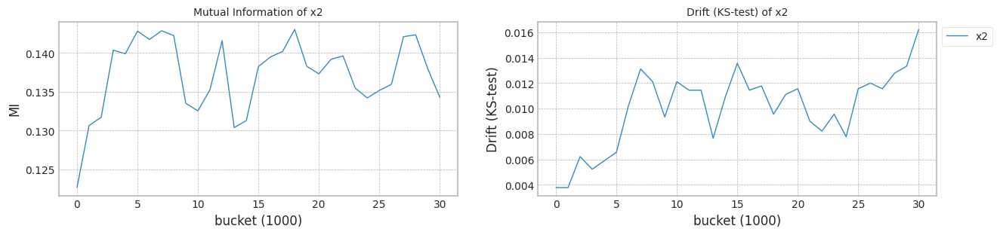

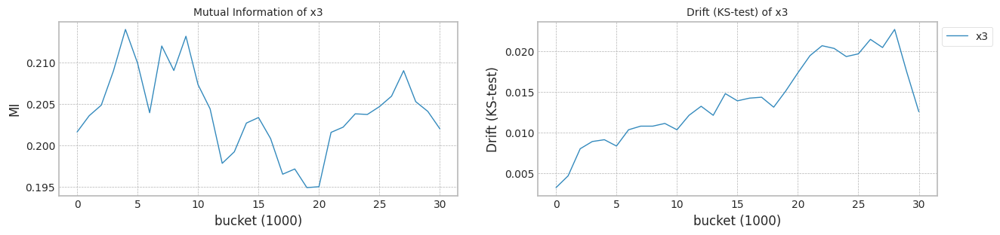

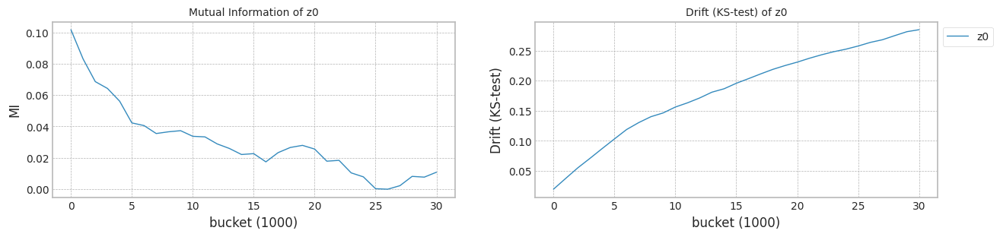

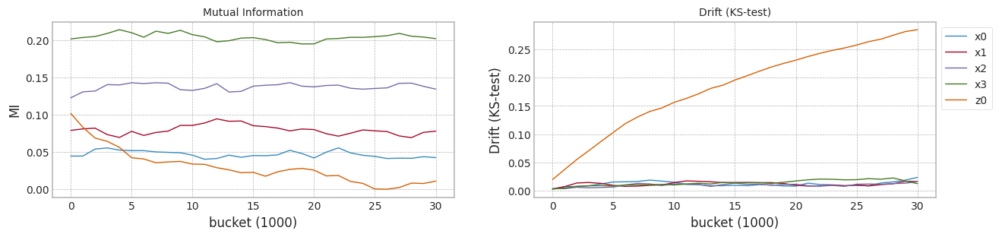

In [27]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [28]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


In [ ]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=alpha,trial_count=20,weight_init=True,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 20
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:09<00:00, 433.13it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.93it/s]


Test f1 score: 0.8774407060121345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.013122
x1    0.010459
x2    0.014502
x3    0.020566
z0    0.241283
dtype: float64
Mean F1 for all data: 0.7754599205682241
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7754599205682241
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.57it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.81it/s]


Test f1 score: 0.877339792997137
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.012871
x1    0.016498
x2    0.014004
x3    0.025251
z0    0.224254
dtype: float64
Mean F1 for all data: 0.778459358052211
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7769596393102176
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.14it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.04it/s]


Test f1 score: 0.8773127753303964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.012301
x1    0.014842
x2    0.013061
x3    0.019229
z0    0.196444
dtype: float64
Mean F1 for all data: 0.7879546705386712
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.778459358052211
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.23it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.76it/s]


Test f1 score: 0.8762534435261707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.018441
x1    0.011147
x2    0.011616
x3    0.019297
z0    0.238602
dtype: float64
Mean F1 for all data: 0.774486481343023
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7769596393102176
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.98it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.23it/s]


Test f1 score: 0.8774991715453441
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.013814
x1    0.011373
x2    0.014584
x3    0.023054
z0    0.178713
dtype: float64
Mean F1 for all data: 0.7935180502595645
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.778459358052211
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.84it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.29it/s]


Test f1 score: 0.8773283368235425
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011695
x1    0.010122
x2    0.009968
x3    0.018717
z0    0.230183
dtype: float64
Mean F1 for all data: 0.7801632377218007
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7793112978870058
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.31it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.64it/s]


Test f1 score: 0.877769205334509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011749
x1    0.012552
x2    0.017581
x3    0.020394
z0    0.187183
dtype: float64
Mean F1 for all data: 0.8060951765903037
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7801632377218007
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.46it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.37it/s]


Test f1 score: 0.8788713766119255
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011939
x1    0.011699
x2    0.016401
x3    0.020480
z0    0.100599
dtype: float64
Mean F1 for all data: 0.8180862813567664
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.784058954130236
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.37it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.36it/s]


Test f1 score: 0.8766461808604039
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.012258
x1    0.011312
x2    0.014376
x3    0.015466
z0    0.206498
dtype: float64
Mean F1 for all data: 0.7860287318001452
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7860287318001452
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.66it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.90it/s]


Test f1 score: 0.8789346246973366
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.012233
x1    0.011918
x2    0.013065
x3    0.023713
z0    0.179025
dtype: float64
Mean F1 for all data: 0.7939680794121028
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7869917011694082
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.77it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.46it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.012269
x1    0.011226
x2    0.020423
x3    0.022068
z0    0.169577
dtype: float64
Mean F1 for all data: 0.7949702504899187
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7879546705386712
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.75it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.83it/s]


Test f1 score: 0.8777802246201277
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.013448
x1    0.014068
x2    0.011487
x3    0.015545
z0    0.255849
dtype: float64
Mean F1 for all data: 0.7701810873315457
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7869917011694082
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.46it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.57it/s]


Test f1 score: 0.877876885805528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.017384
x1    0.016663
x2    0.014409
x3    0.016720
z0    0.226082
dtype: float64
Mean F1 for all data: 0.7793500950758774
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7860287318001452
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.63it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.59it/s]


Test f1 score: 0.877876885805528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.019914
x1    0.011280
x2    0.014649
x3    0.020810
z0    0.218545
dtype: float64
Mean F1 for all data: 0.7815928080842276
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7838107699421863
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.24it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.06it/s]


Test f1 score: 0.8778340303764032
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011878
x1    0.010796
x2    0.012039
x3    0.017441
z0    0.239168
dtype: float64
Mean F1 for all data: 0.7757947767536065
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7815928080842276
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.62it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.31it/s]


Test f1 score: 0.8785808726311151
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.012509
x1    0.013140
x2    0.012577
x3    0.025179
z0    0.211753
dtype: float64
Mean F1 for all data: 0.7860844540191252
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7838107699421863
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.48it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.62it/s]


Test f1 score: 0.8771466314398942
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011892
x1    0.011287
x2    0.012659
x3    0.022452
z0    0.215125
dtype: float64
Mean F1 for all data: 0.7851021867797833
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7851021867797833
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.97it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.94it/s]


Test f1 score: 0.8765486725663717
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.012262
x1    0.011548
x2    0.021394
x3    0.032552
z0    0.190563
dtype: float64
Mean F1 for all data: 0.7993665483387301
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7855654592899642
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.52it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.36it/s]


Test f1 score: 0.8775600088086324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.018143
x1    0.015136
x2    0.017455
x3    0.026143
z0    0.191548
dtype: float64
Mean F1 for all data: 0.801036990593119
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7860287318001452
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.52it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.35it/s]


Test f1 score: 0.8780380512482129
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.016319
x1    0.010821
x2    0.017455
x3    0.018348
z0    0.191631
dtype: float64
Mean F1 for all data: 0.8007239940648386
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7860565929096353


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.598732
1,1,0.877387,0.875055,0.794639,0.728317,5.648923
2,2,0.877495,0.875277,0.795524,0.728160,5.590234
3,3,0.877062,0.875083,0.790934,0.722198,5.598584
4,4,0.877533,0.875290,0.798808,0.734326,5.727732
5,5,0.877657,0.875042,0.797866,0.732107,5.527426
6,6,0.877065,0.874751,0.798957,0.734662,5.564094
7,7,0.878097,0.875857,0.800117,0.738893,5.889929
8,8,0.876011,0.873678,0.798367,0.734024,5.546337
9,9,0.877915,0.875925,0.799375,0.734754,5.608224


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877441,0.875139,0.775460,0.676372,5.593243
1,1,0.877340,0.875083,0.778459,0.686221,5.610035
2,2,0.877313,0.875318,0.787955,0.704522,5.717346
3,3,0.876253,0.874612,0.774486,0.674956,5.686276
4,4,0.877499,0.875555,0.793518,0.718252,5.631763
5,5,0.877328,0.875471,0.780163,0.683716,5.705025
6,6,0.877769,0.875678,0.806095,0.748026,5.631893
7,7,0.878871,0.877531,0.818086,0.766056,5.621093
8,8,0.876646,0.874848,0.786029,0.700083,5.639599
9,9,0.878935,0.877391,0.793968,0.712646,5.603466


trial_count: 20
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.49it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.8791983261755314
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.014133
x1    0.013774
x2    0.017229
x3    0.021326
z0    0.288570
dtype: float64
Mean F1 for all data: 0.7627363792927513
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7627363792927513
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.70it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.34it/s]


Test f1 score: 0.8782589482987185
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.017710
x1    0.013434
x2    0.010932
x3    0.034032
z0    0.300168
dtype: float64
Mean F1 for all data: 0.7484850883447237
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7556107338187374
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.22it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.47it/s]


Test f1 score: 0.8781563568199361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.012057
x1    0.014685
x2    0.013982
x3    0.022297
z0    0.276061
dtype: float64
Mean F1 for all data: 0.7593084395547708
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7593084395547708
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.42it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.84it/s]


Test f1 score: 0.8782369146005509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.021308
x1    0.013032
x2    0.014000
x3    0.018889
z0    0.279674
dtype: float64
Mean F1 for all data: 0.7570167405205953
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.758162590037683
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.82it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.22it/s]


Test f1 score: 0.8772626931567328
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.017502
x1    0.014050
x2    0.019337
x3    0.030842
z0    0.232957
dtype: float64
Mean F1 for all data: 0.7725192285892768
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7593084395547708
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.36it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.43it/s]


Test f1 score: 0.8788782157447279
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.012176
x1    0.011756
x2    0.010921
x3    0.017000
z0    0.235609
dtype: float64
Mean F1 for all data: 0.7918972089154978
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.761022409423761
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.60it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.53it/s]


Test f1 score: 0.8796296296296295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.013100
x1    0.012606
x2    0.038996
x3    0.040480
z0    0.111935
dtype: float64
Mean F1 for all data: 0.814130484299725
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7627363792927513
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.70it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.80it/s]


Test f1 score: 0.879215340533392
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011835
x1    0.011857
x2    0.018746
x3    0.022710
z0    0.068667
dtype: float64
Mean F1 for all data: 0.8296881337535511
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.767627803941014
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.13it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.52it/s]


Test f1 score: 0.8783977110157368
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.012781
x1    0.025957
x2    0.025244
x3    0.028093
z0    0.160133
dtype: float64
Mean F1 for all data: 0.799625598472102
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7725192285892768
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.71it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.14it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.012921
x1    0.013534
x2    0.012441
x3    0.024287
z0    0.156778
dtype: float64
Mean F1 for all data: 0.8010533228999477
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7822082187523873
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.51it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.25it/s]


Test f1 score: 0.8798415492957747
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.013814
x1    0.031416
x2    0.024265
x3    0.043125
z0    0.115437
dtype: float64
Mean F1 for all data: 0.8104099806759145
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7918972089154978
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 687.03it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.21it/s]


Test f1 score: 0.8780864197530864
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.014434
x1    0.015097
x2    0.011147
x3    0.015305
z0    0.312111
dtype: float64
Mean F1 for all data: 0.7449955253447099
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7822082187523873
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.14it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.58it/s]


Test f1 score: 0.8792515134837644
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.017480
x1    0.012509
x2    0.013215
x3    0.017674
z0    0.245538
dtype: float64
Mean F1 for all data: 0.7780367605164646
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7780367605164646
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.27it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.57it/s]


Test f1 score: 0.8783664459161148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.025495
x1    0.017351
x2    0.020462
x3    0.028452
z0    0.250301
dtype: float64
Mean F1 for all data: 0.7616986038231816
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7752779945528707
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.19it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.38it/s]


Test f1 score: 0.8777533039647578
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011889
x1    0.013265
x2    0.010925
x3    0.014373
z0    0.270391
dtype: float64
Mean F1 for all data: 0.7657451550209765
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7725192285892768
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 628.34it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.45it/s]


Test f1 score: 0.8784737538597266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.013491
x1    0.013004
x2    0.015484
x3    0.026939
z0    0.310746
dtype: float64
Mean F1 for all data: 0.7547298635929395
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7691321918051266
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.81it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.42it/s]


Test f1 score: 0.8788713766119255
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011857
x1    0.010452
x2    0.013014
x3    0.022796
z0    0.221663
dtype: float64
Mean F1 for all data: 0.790684968131757
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7725192285892768
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.72it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.94it/s]


Test f1 score: 0.8778110114102139
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.013932
x1    0.012491
x2    0.022652
x3    0.032642
z0    0.265839
dtype: float64
Mean F1 for all data: 0.7571682612372458
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7691321918051266
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.87it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.15it/s]


Test f1 score: 0.8781832212545474
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.021211
x1    0.011885
x2    0.032004
x3    0.027835
z0    0.248441
dtype: float64
Mean F1 for all data: 0.7622055737163198
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7657451550209765
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.14it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.49it/s]


Test f1 score: 0.8782157447278348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.024502
x1    0.055301
x2    0.022344
x3    0.027957
z0    0.119100
dtype: float64
Mean F1 for all data: 0.8192205233310764
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7691321918051266


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.626626
1,1,0.877387,0.875055,0.794639,0.728317,5.637985
2,2,0.877495,0.875277,0.795524,0.728160,5.632742
3,3,0.877062,0.875083,0.790934,0.722198,5.661247
4,4,0.877533,0.875290,0.798808,0.734326,5.579388
5,5,0.877657,0.875042,0.797866,0.732107,5.664518
6,6,0.877065,0.874751,0.798957,0.734662,5.637054
7,7,0.878097,0.875857,0.800117,0.738893,5.577403
8,8,0.876011,0.873678,0.798367,0.734024,5.607601
9,9,0.877915,0.875925,0.799375,0.734754,5.638274


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879198,0.876649,0.762736,0.625278,5.652648
1,1,0.878259,0.875667,0.748485,0.610193,5.624985
2,2,0.878156,0.875943,0.759308,0.630185,5.574056
3,3,0.878237,0.876053,0.757017,0.625510,5.659359
4,4,0.877263,0.875624,0.772519,0.660270,5.615964
5,5,0.878878,0.877540,0.791897,0.694000,5.629185
6,6,0.879630,0.877768,0.814130,0.750305,5.637788
7,7,0.879215,0.878691,0.829688,0.789151,5.615514
8,8,0.878398,0.876258,0.799626,0.722880,5.828935
9,9,0.879312,0.877768,0.801053,0.722845,5.642027


trial_count: 20
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.81it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.18it/s]


Test f1 score: 0.8790118010367265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.013756
x1    0.013720
x2    0.010871
x3    0.027882
z0    0.406631
dtype: float64
Mean F1 for all data: 0.7587002532442385
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7587002532442385
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.47it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.35it/s]


Test f1 score: 0.8791524114336166
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.018900
x1    0.013835
x2    0.016108
x3    0.027097
z0    0.386373
dtype: float64
Mean F1 for all data: 0.7433735407541715
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.751036896999205
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.98it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.73it/s]


Test f1 score: 0.878710959055292
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.012276
x1    0.016240
x2    0.015043
x3    0.021577
z0    0.313358
dtype: float64
Mean F1 for all data: 0.7450868717336752
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7450868717336752
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.14it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.52it/s]


Test f1 score: 0.8783559827643355
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.019086
x1    0.014065
x2    0.011860
x3    0.017910
z0    0.344487
dtype: float64
Mean F1 for all data: 0.7265972157223566
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7442302062439233
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.55it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.54it/s]


Test f1 score: 0.8787944966149814
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.013796
x1    0.014280
x2    0.014387
x3    0.024667
z0    0.469151
dtype: float64
Mean F1 for all data: 0.8048381670475839
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7450868717336752
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.78it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.8791427308882015
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.012649
x1    0.018430
x2    0.015814
x3    0.027075
z0    0.416323
dtype: float64
Mean F1 for all data: 0.7997118678755314
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7518935624889569
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.08it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.23it/s]


Test f1 score: 0.8792419568091671
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.017828
x1    0.024810
x2    0.046584
x3    0.049609
z0    0.167491
dtype: float64
Mean F1 for all data: 0.7995403367469617
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7587002532442385
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.79it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.87it/s]


Test f1 score: 0.879903040987219
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.012043
x1    0.020011
x2    0.025369
x3    0.020330
z0    0.084115
dtype: float64
Mean F1 for all data: 0.8401856266662262
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7791202949956001
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.90it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.12it/s]


Test f1 score: 0.8790651526843788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.014330
x1    0.021613
x2    0.016835
x3    0.021434
z0    0.241086
dtype: float64
Mean F1 for all data: 0.7907359503985417
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7907359503985417
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.65it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.21it/s]


Test f1 score: 0.8802382002646669
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.012319
x1    0.013703
x2    0.015229
x3    0.028208
z0    0.236746
dtype: float64
Mean F1 for all data: 0.8131447686731874
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7951381435727517
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.77it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.05it/s]


Test f1 score: 0.8802296059167678
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.016634
x1    0.012946
x2    0.033376
x3    0.064505
z0    0.091663
dtype: float64
Mean F1 for all data: 0.8236561192084256
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7995403367469617
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.90it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.26it/s]


Test f1 score: 0.8787711349320367
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.015903
x1    0.018842
x2    0.010330
x3    0.015706
z0    0.355943
dtype: float64
Mean F1 for all data: 0.7208784723829986
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7951381435727517
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.42it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.45it/s]


Test f1 score: 0.879452961288188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.016882
x1    0.013452
x2    0.014419
x3    0.018552
z0    0.262885
dtype: float64
Mean F1 for all data: 0.7930476743134416
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7930476743134416
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.18it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.62it/s]


Test f1 score: 0.878430508100959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.032394
x1    0.017516
x2    0.028817
x3    0.037401
z0    0.262961
dtype: float64
Mean F1 for all data: 0.746612949641024
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7918918123559917
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.33it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.75it/s]


Test f1 score: 0.8792590142242805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.012183
x1    0.013341
x2    0.011269
x3    0.014613
z0    0.377337
dtype: float64
Mean F1 for all data: 0.755820391263992
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7907359503985417
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.63it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.60it/s]


Test f1 score: 0.8794169611307421
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.013391
x1    0.012652
x2    0.012534
x3    0.024602
z0    0.409756
dtype: float64
Mean F1 for all data: 0.7696483623835602
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.780192156391051
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.21it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.24it/s]


Test f1 score: 0.8797356828193833
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.013903
x1    0.017237
x2    0.012681
x3    0.020559
z0    0.236290
dtype: float64
Mean F1 for all data: 0.8058852482855154
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7907359503985417
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.39it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.70it/s]


Test f1 score: 0.8780487804878049
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.020269
x1    0.016194
x2    0.023208
x3    0.049154
z0    0.289953
dtype: float64
Mean F1 for all data: 0.7416538125099353
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.780192156391051
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.90it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.03it/s]


Test f1 score: 0.8788881535407015
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.023656
x1    0.012000
x2    0.035437
x3    0.041265
z0    0.269824
dtype: float64
Mean F1 for all data: 0.7472185272792908
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7696483623835602
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.56it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.17it/s]


Test f1 score: 0.8793903247183565
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.047165
x1    0.048022
x2    0.050699
x3    0.052781
z0    0.168885
dtype: float64
Mean F1 for all data: 0.8356707453912321
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.780192156391051


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.626664
1,1,0.877387,0.875055,0.794639,0.728317,5.546419
2,2,0.877495,0.875277,0.795524,0.728160,5.631811
3,3,0.877062,0.875083,0.790934,0.722198,5.850708
4,4,0.877533,0.875290,0.798808,0.734326,5.659861
5,5,0.877657,0.875042,0.797866,0.732107,5.557198
6,6,0.877065,0.874751,0.798957,0.734662,5.597234
7,7,0.878097,0.875857,0.800117,0.738893,5.582003
8,8,0.876011,0.873678,0.798367,0.734024,5.624478
9,9,0.877915,0.875925,0.799375,0.734754,5.593038


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879012,0.877578,0.758700,0.577910,5.681676
1,1,0.879152,0.877691,0.743374,0.552939,5.652623
2,2,0.878711,0.875431,0.745087,0.586975,5.753617
3,3,0.878356,0.875264,0.726597,0.548344,5.686823
4,4,0.878794,0.877293,0.804838,0.730284,5.604837
5,5,0.879143,0.878411,0.799712,0.690959,5.662016
6,6,0.879242,0.878308,0.799540,0.703674,5.664720
7,7,0.879903,0.879063,0.840186,0.811745,5.588256
8,8,0.879065,0.878076,0.790736,0.683443,5.643268
9,9,0.880238,0.879929,0.813145,0.729867,5.622448


trial_count: 20
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.72it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.64it/s]


Test f1 score: 0.8790118010367265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.020337
x1    0.020237
x2    0.022348
x3    0.014964
z0    0.526882
dtype: float64
Mean F1 for all data: 0.7321497368117181
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7321497368117181
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.84it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.05it/s]


Test f1 score: 0.8794544654641442
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.016921
x1    0.015280
x2    0.024928
x3    0.023527
z0    0.406781
dtype: float64
Mean F1 for all data: 0.8058782558725567
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7690139963421374
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.96it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.06it/s]


Test f1 score: 0.8792227864870832
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.018416
x1    0.015602
x2    0.015832
x3    0.021057
z0    0.381276
dtype: float64
Mean F1 for all data: 0.7457553588743144
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7457553588743144
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.49it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.57it/s]


Test f1 score: 0.8788958147818343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.021835
x1    0.393996
x2    0.011470
x3    0.018315
z0    0.357767
dtype: float64
Mean F1 for all data: 0.7198027267406301
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7389525478430163
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.75it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.57it/s]


Test f1 score: 0.8779627383970895
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.013509
x1    0.020265
x2    0.013681
x3    0.028111
z0    0.464470
dtype: float64
Mean F1 for all data: 0.8077200813362934
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7457553588743144
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.93it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.01it/s]


Test f1 score: 0.8797258456776476
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.012789
x1    0.010674
x2    0.011039
x3    0.025470
z0    0.558814
dtype: float64
Mean F1 for all data: 0.7113480639416024
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7389525478430163
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.14it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.42it/s]


Test f1 score: 0.8796378091872791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.018746
x1    0.027505
x2    0.050480
x3    0.034989
z0    0.403771
dtype: float64
Mean F1 for all data: 0.7967392517122591
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7457553588743144
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.03it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.25it/s]


Test f1 score: 0.8809813239031937
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011882
x1    0.024935
x2    0.024903
x3    0.040272
z0    0.248495
dtype: float64
Mean F1 for all data: 0.8501139379322271
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7712473052932868
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.60it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.83it/s]


Test f1 score: 0.880035316190266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.412272
x1    0.027925
x2    0.016419
x3    0.012154
z0    0.321240
dtype: float64
Mean F1 for all data: 0.7821635775045921
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7821635775045921
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.36it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.23it/s]


Test f1 score: 0.880697494757753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.012878
x1    0.018624
x2    0.018090
x3    0.026975
z0    0.370896
dtype: float64
Mean F1 for all data: 0.8034394391527353
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7894514146084256
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.88it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.98it/s]


Test f1 score: 0.8801939821448254
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.016670
x1    0.011165
x2    0.043624
x3    0.066706
z0    0.102391
dtype: float64
Mean F1 for all data: 0.8237033718171322
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7967392517122591
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.15it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.10it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.014283
x1    0.018957
x2    0.014649
x3    0.013839
z0    0.425502
dtype: float64
Mean F1 for all data: 0.6789131782961839
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7894514146084256
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.45it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.75it/s]


Test f1 score: 0.8792057363485934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.016165
x1    0.014627
x2    0.013548
x3    0.023011
z0    0.349341
dtype: float64
Mean F1 for all data: 0.7925857495237482
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7925857495237482
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.46it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.00it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.034057
x1    0.013140
x2    0.042634
x3    0.049527
z0    0.273315
dtype: float64
Mean F1 for all data: 0.734878593191952
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7873746635141701
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.41it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.61it/s]


Test f1 score: 0.8791184573002754
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.012731
x1    0.011828
x2    0.011713
x3    0.012427
z0    0.439029
dtype: float64
Mean F1 for all data: 0.7742894560769152
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7821635775045921
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.45it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.92it/s]


Test f1 score: 0.8794451172520092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.013918
x1    0.018513
x2    0.013495
x3    0.022871
z0    0.406785
dtype: float64
Mean F1 for all data: 0.7919746001036069
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7870690888040994
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.99it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.26it/s]


Test f1 score: 0.8791160220994475
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.012351
x1    0.013082
x2    0.017609
x3    0.016821
z0    0.480581
dtype: float64
Mean F1 for all data: 0.7782562478690666
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7821635775045921
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.37it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.02it/s]


Test f1 score: 0.8780217343091594
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.015706
x1    0.026079
x2    0.021935
x3    0.021491
z0    0.331563
dtype: float64
Mean F1 for all data: 0.7248227956976558
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7802099126868294
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.63it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.59it/s]


Test f1 score: 0.8782263401720715
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.027570
x1    0.011846
x2    0.020667
x3    0.030835
z0    0.362018
dtype: float64
Mean F1 for all data: 0.7048692618908303
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7782562478690666
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.73it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.90it/s]


Test f1 score: 0.8800703528635814
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.012706
x1    0.013595
x2    0.012136
x3    0.022154
z0    0.411179
dtype: float64
Mean F1 for all data: 0.8208826619709323
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7802099126868294


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.705688
1,1,0.877387,0.875055,0.794639,0.728317,5.597778
2,2,0.877495,0.875277,0.795524,0.728160,5.628706
3,3,0.877062,0.875083,0.790934,0.722198,5.761435
4,4,0.877533,0.875290,0.798808,0.734326,5.685268
5,5,0.877657,0.875042,0.797866,0.732107,5.671456
6,6,0.877065,0.874751,0.798957,0.734662,5.639193
7,7,0.878097,0.875857,0.800117,0.738893,5.649153
8,8,0.876011,0.873678,0.798367,0.734024,5.563108
9,9,0.877915,0.875925,0.799375,0.734754,5.547853


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879012,0.877827,0.732150,0.482420,5.613435
1,1,0.879454,0.878738,0.805878,0.719254,5.645204
2,2,0.879223,0.877957,0.745755,0.564692,5.673878
3,3,0.878896,0.875603,0.719803,0.542949,5.749674
4,4,0.877963,0.877785,0.807720,0.728964,5.651510
5,5,0.879726,0.879067,0.711348,0.394135,5.739922
6,6,0.879638,0.879104,0.796739,0.671156,5.673557
7,7,0.880981,0.880000,0.850114,0.837156,5.681359
8,8,0.880035,0.879743,0.782164,0.645171,5.623314
9,9,0.880697,0.880195,0.803439,0.682441,5.677346


trial_count: 20
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.12it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.57it/s]


Test f1 score: 0.8801858612678394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.023588
x1    0.040946
x2    0.045097
x3    0.028946
z0    0.560971
dtype: float64
Mean F1 for all data: 0.7395481306690984
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7395481306690984
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.74it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.42it/s]


Test f1 score: 0.8789992250636555
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.019996
x1    0.022344
x2    0.035151
x3    0.028670
z0    0.397968
dtype: float64
Mean F1 for all data: 0.8020342747330835
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.770791202701091
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.03it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.77it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.024391
x1    0.021437
x2    0.013151
x3    0.017337
z0    0.510140
dtype: float64
Mean F1 for all data: 0.744198641482554
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.744198641482554
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.60it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.05it/s]


Test f1 score: 0.8775060586032166
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.035061
x1    0.455204
x2    0.039645
x3    0.042294
z0    0.431538
dtype: float64
Mean F1 for all data: 0.7308981369123512
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7418733860758262
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.88it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.09it/s]


Test f1 score: 0.878434820839745
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.018183
x1    0.018075
x2    0.019233
x3    0.032760
z0    0.439484
dtype: float64
Mean F1 for all data: 0.8149545268763468
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.744198641482554
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.70it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.68it/s]


Test f1 score: 0.8804491413474239
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.014670
x1    0.040864
x2    0.017842
x3    0.058473
z0    0.488882
dtype: float64
Mean F1 for all data: 0.7653278392963528
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7547632403894534
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.83it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.92it/s]


Test f1 score: 0.8813596733252401
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.032211
x1    0.011186
x2    0.085545
x3    0.077968
z0    0.391487
dtype: float64
Mean F1 for all data: 0.7792458773456044
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7653278392963528
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.60it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.57it/s]


Test f1 score: 0.879903040987219
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.013391
x1    0.028204
x2    0.040355
x3    0.045007
z0    0.260796
dtype: float64
Mean F1 for all data: 0.8505391322360738
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7722868583209785
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.05it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.880406001765225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.397720
x1    0.018968
x2    0.018946
x3    0.017530
z0    0.481792
dtype: float64
Mean F1 for all data: 0.7695683809555379
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7695683809555379
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.42it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.45it/s]


Test f1 score: 0.8811466372657112
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.013832
x1    0.017043
x2    0.025384
x3    0.031516
z0    0.479122
dtype: float64
Mean F1 for all data: 0.737600867627313
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7674481101259454
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.44it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.75it/s]


Test f1 score: 0.880361671628625
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.015570
x1    0.017638
x2    0.060312
x3    0.091620
z0    0.202376
dtype: float64
Mean F1 for all data: 0.8411392976551725
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7695683809555379
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.00it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.76it/s]


Test f1 score: 0.8773751657092356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.022495
x1    0.029323
x2    0.396348
x3    0.026749
z0    0.397896
dtype: float64
Mean F1 for all data: 0.6806655611080576
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7674481101259454
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.89it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.30it/s]


Test f1 score: 0.8811837455830389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.030896
x1    0.021978
x2    0.036849
x3    0.086667
z0    0.444806
dtype: float64
Mean F1 for all data: 0.7627919965908749
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7653278392963528
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.91it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.66it/s]


Test f1 score: 0.8790893015030947
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.032659
x1    0.024341
x2    0.063530
x3    0.067935
z0    0.511735
dtype: float64
Mean F1 for all data: 0.643302397581305
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7640599179436138
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.05it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.84it/s]


Test f1 score: 0.880052869258729
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.012265
x1    0.028283
x2    0.022480
x3    0.011588
z0    0.482735
dtype: float64
Mean F1 for all data: 0.7933260065296044
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7653278392963528
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.85it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.24it/s]


Test f1 score: 0.8794169611307421
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.018384
x1    0.016151
x2    0.015007
x3    0.018477
z0    0.442613
dtype: float64
Mean F1 for all data: 0.805819380882493
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7674481101259454
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.23it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.8795765328628143
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.012470
x1    0.013534
x2    0.013907
x3    0.022129
z0    0.457996
dtype: float64
Mean F1 for all data: 0.7744163756317678
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7695683809555379
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.09it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.10it/s]


Test f1 score: 0.8788819875776397
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.040308
x1    0.039677
x2    0.067072
x3    0.018620
z0    0.498351
dtype: float64
Mean F1 for all data: 0.8021514697019378
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7719923782936529
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.12it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.01it/s]


Test f1 score: 0.8780918727915193
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.030889
x1    0.010832
x2    0.024792
x3    0.028473
z0    0.388305
dtype: float64
Mean F1 for all data: 0.686703567617837
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7695683809555379
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.76it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.79it/s]


Test f1 score: 0.8805460750853242
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.013806
x1    0.014502
x2    0.011079
x3    0.028599
z0    0.415627
dtype: float64
Mean F1 for all data: 0.8209233476010376
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7719923782936529


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.632274
1,1,0.877387,0.875055,0.794639,0.728317,5.630081
2,2,0.877495,0.875277,0.795524,0.728160,5.671186
3,3,0.877062,0.875083,0.790934,0.722198,5.760724
4,4,0.877533,0.875290,0.798808,0.734326,5.653706
5,5,0.877657,0.875042,0.797866,0.732107,5.656080
6,6,0.877065,0.874751,0.798957,0.734662,5.691352
7,7,0.878097,0.875857,0.800117,0.738893,5.653088
8,8,0.876011,0.873678,0.798367,0.734024,5.591477
9,9,0.877915,0.875925,0.799375,0.734754,5.777027


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880186,0.878933,0.739548,0.510082,5.665607
1,1,0.878999,0.878195,0.802034,0.716625,5.659193
2,2,0.879312,0.878368,0.744199,0.518957,5.566643
3,3,0.877506,0.874736,0.730898,0.546346,5.658496
4,4,0.878435,0.877791,0.814955,0.748855,5.671957
5,5,0.880449,0.879080,0.765328,0.559369,5.631025
6,6,0.881360,0.880559,0.779246,0.611078,5.639048
7,7,0.879903,0.879046,0.850539,0.839090,5.709586
8,8,0.880406,0.879396,0.769568,0.577607,5.589789
9,9,0.881147,0.880744,0.737601,0.463512,5.739877


trial_count: 20
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.13it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.07it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.27it/s]


Test f1 score: 0.8816966751353144
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.020276
x1    0.039720
x2    0.015448
x3    0.019226
z0    0.493111
dtype: float64
Mean F1 for all data: 0.7732483284401731
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7732483284401731
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.99it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.55it/s]


Test f1 score: 0.8797364085667218
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.021581
x1    0.033810
x2    0.025767
x3    0.030756
z0    0.336828
dtype: float64
Mean F1 for all data: 0.8092455697103674
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7912469490752703
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.19it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.36it/s]


Test f1 score: 0.8791208791208791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.035724
x1    0.025939
x2    0.109004
x3    0.039068
z0    0.409634
dtype: float64
Mean F1 for all data: 0.8207595395717002
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8092455697103674
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.06it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.48it/s]


Test f1 score: 0.8804754567466432
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.016659
x1    0.383437
x2    0.022477
x3    0.017720
z0    0.535541
dtype: float64
Mean F1 for all data: 0.703140764304706
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7912469490752703
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.48it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.8793689054453818
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.020369
x1    0.035276
x2    0.030799
x3    0.036810
z0    0.444627
dtype: float64
Mean F1 for all data: 0.807516260287218
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.807516260287218
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.76it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.07it/s]


Test f1 score: 0.8802646085997794
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.028373
x1    0.015993
x2    0.037699
x3    0.024695
z0    0.554136
dtype: float64
Mean F1 for all data: 0.6440563308557532
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7903822943636956
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.11it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.8809286898839136
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.046380
x1    0.057462
x2    0.092896
x3    0.115140
z0    0.353835
dtype: float64
Mean F1 for all data: 0.7642525240319777
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7732483284401731
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.31it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.87it/s]


Test f1 score: 0.8805392861089624
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.018136
x1    0.012115
x2    0.067036
x3    0.078591
z0    0.271502
dtype: float64
Mean F1 for all data: 0.8522578103930477
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7903822943636956
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.31it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.59it/s]


Test f1 score: 0.8806730130617666
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.384989
x1    0.025412
x2    0.107075
x3    0.028849
z0    0.501348
dtype: float64
Mean F1 for all data: 0.6799945997339429
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7732483284401731
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.03it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.13it/s]


Test f1 score: 0.8815688002644045
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.015505
x1    0.013670
x2    0.017323
x3    0.028423
z0    0.436240
dtype: float64
Mean F1 for all data: 0.8152060433781761
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7903822943636956
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.85it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.03it/s]


Test f1 score: 0.8799912000879992
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.380437
x1    0.020710
x2    0.069280
x3    0.025652
z0    0.416018
dtype: float64
Mean F1 for all data: 0.8025724224995743
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8025724224995743
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.70it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.49it/s]


Test f1 score: 0.8780703695507855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.026014
x1    0.038179
x2    0.373376
x3    0.030957
z0    0.465803
dtype: float64
Mean F1 for all data: 0.6306540191533964
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7879103754698737
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.30it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.89it/s]


Test f1 score: 0.880406001765225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.034308
x1    0.041473
x2    0.022670
x3    0.078627
z0    0.453724
dtype: float64
Mean F1 for all data: 0.7616702749531811
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7732483284401731
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.03it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.67it/s]


Test f1 score: 0.8802474591250552
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.041168
x1    0.026695
x2    0.321441
x3    0.114108
z0    0.449918
dtype: float64
Mean F1 for all data: 0.8338733916620091
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7879103754698737
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.59it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.82it/s]


Test f1 score: 0.8793465062368915
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.017201
x1    0.069219
x2    0.016634
x3    0.021667
z0    0.448444
dtype: float64
Mean F1 for all data: 0.7716258671351889
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7732483284401731
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.87it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.13it/s]


Test f1 score: 0.8802553378824566
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.039280
x1    0.030681
x2    0.016556
x3    0.022957
z0    0.429297
dtype: float64
Mean F1 for all data: 0.8340851158461982
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7879103754698737
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.82it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.00it/s]


Test f1 score: 0.8803532008830021
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.015129
x1    0.014724
x2    0.013079
x3    0.018029
z0    0.355742
dtype: float64
Mean F1 for all data: 0.8086313038830413
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8025724224995743
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.30it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.00it/s]


Test f1 score: 0.8795113825652416
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.038738
x1    0.049090
x2    0.097530
x3    0.197591
z0    0.349656
dtype: float64
Mean F1 for all data: 0.8440378433278813
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8050443413933961
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.72it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.18it/s]


Test f1 score: 0.8779031187790312
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.016889
x1    0.360075
x2    0.021763
x3    0.021527
z0    0.412434
dtype: float64
Mean F1 for all data: 0.6497004144690611
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.8025724224995743
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.44it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.06it/s]


Test f1 score: 0.8809314586994728
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.026201
x1    0.043376
x2    0.019427
x3    0.026014
z0    0.430115
dtype: float64
Mean F1 for all data: 0.8191024519014934
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8050443413933961


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,6.136960
1,1,0.877387,0.875055,0.794639,0.728317,5.677460
2,2,0.877495,0.875277,0.795524,0.728160,5.676466
3,3,0.877062,0.875083,0.790934,0.722198,5.771360
4,4,0.877533,0.875290,0.798808,0.734326,5.639517
5,5,0.877657,0.875042,0.797866,0.732107,5.604394
6,6,0.877065,0.874751,0.798957,0.734662,5.685271
7,7,0.878097,0.875857,0.800117,0.738893,5.688683
8,8,0.876011,0.873678,0.798367,0.734024,5.715597
9,9,0.877915,0.875925,0.799375,0.734754,5.698715


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.881697,0.881047,0.773248,0.592671,5.859644
1,1,0.879736,0.879507,0.809246,0.727200,5.725262
2,2,0.879121,0.878390,0.820760,0.749119,5.731866
3,3,0.880475,0.879991,0.703141,0.375486,5.681086
4,4,0.879369,0.878632,0.807516,0.732670,5.663157
5,5,0.880265,0.879184,0.644056,0.238251,5.751203
6,6,0.880929,0.880302,0.764253,0.570682,5.611738
7,7,0.880539,0.879752,0.852258,0.841710,5.662584
8,8,0.880673,0.879857,0.679995,0.322498,5.678548
9,9,0.881569,0.881273,0.815206,0.704086,5.690863


trial_count: 20
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.88it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.59it/s]


Test f1 score: 0.8799646954986761
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.017724
x1    0.027910
x2    0.334358
x3    0.020749
z0    0.563104
dtype: float64
Mean F1 for all data: 0.5974745860374161
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.5974745860374161
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.20it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.14it/s]


Test f1 score: 0.8799119427627959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.048219
x1    0.052466
x2    0.016341
x3    0.046416
z0    0.404262
dtype: float64
Mean F1 for all data: 0.8142344013299518
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7058544936836839
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.03it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.05it/s]


Test f1 score: 0.8809419014084506
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.018125
x1    0.029254
x2    0.206717
x3    0.041563
z0    0.446405
dtype: float64
Mean F1 for all data: 0.8340569803070579
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8142344013299518
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.54it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.76it/s]


Test f1 score: 0.8800265869059487
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.041373
x1    0.380541
x2    0.014118
x3    0.016699
z0    0.532254
dtype: float64
Mean F1 for all data: 0.7198177080140042
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.767026054671978
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.69it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.75it/s]


Test f1 score: 0.8781456953642384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.032269
x1    0.042670
x2    0.047552
x3    0.040663
z0    0.428176
dtype: float64
Mean F1 for all data: 0.8136414916002439
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8136414916002439
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.03it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.81it/s]


Test f1 score: 0.8804684047724259
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.534993
x1    0.079269
x2    0.077584
x3    0.075208
z0    0.657108
dtype: float64
Mean F1 for all data: 0.8468657015950817
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.8139379464650979
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.86it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.96it/s]


Test f1 score: 0.8807785888077859
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.037247
x1    0.050882
x2    0.095086
x3    0.103147
z0    0.369875
dtype: float64
Mean F1 for all data: 0.7460991776189184
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.8136414916002439
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.55it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.14it/s]


Test f1 score: 0.8802646085997794
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.013878
x1    0.031276
x2    0.233591
x3    0.085853
z0    0.292455
dtype: float64
Mean F1 for all data: 0.8317816617357879
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.8139379464650979
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.77it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.81it/s]


Test f1 score: 0.8819643250385378
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.390068
x1    0.031122
x2    0.024262
x3    0.029742
z0    0.595240
dtype: float64
Mean F1 for all data: 0.6221482120480776
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8136414916002439
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.01it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.20it/s]


Test f1 score: 0.8814643290329695
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.017290
x1    0.344599
x2    0.012215
x3    0.049226
z0    0.447297
dtype: float64
Mean F1 for all data: 0.7328847043066141
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7798703346095812
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.26it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.65it/s]


Test f1 score: 0.8807137349928406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.385695
x1    0.033305
x2    0.109534
x3    0.057857
z0    0.365459
dtype: float64
Mean F1 for all data: 0.7229640421009429
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7460991776189184
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.06it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.02it/s]


Test f1 score: 0.8782800441014333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.023616
x1    0.033799
x2    0.355093
x3    0.021172
z0    0.515523
dtype: float64
Mean F1 for all data: 0.5709941215333062
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7394919409627663
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.57it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.54it/s]


Test f1 score: 0.8802382002646669
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.021323
x1    0.042545
x2    0.012867
x3    0.027763
z0    0.555749
dtype: float64
Mean F1 for all data: 0.7213618209833269
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7328847043066141
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.13it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.10it/s]


Test f1 score: 0.8795684720387495
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.081667
x1    0.040996
x2    0.073269
x3    0.107140
z0    0.379860
dtype: float64
Mean F1 for all data: 0.8487305095939056
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7394919409627663
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.55it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.60it/s]


Test f1 score: 0.8796019900497513
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.022789
x1    0.020147
x2    0.179563
x3    0.037756
z0    0.519000
dtype: float64
Mean F1 for all data: 0.7575983594722845
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7460991776189184
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.05it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.42it/s]


Test f1 score: 0.8800441014332966
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.019634
x1    0.040305
x2    0.031717
x3    0.036588
z0    0.363731
dtype: float64
Mean F1 for all data: 0.8003642341945344
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7518487685456015
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.14it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.00it/s]


Test f1 score: 0.8797621669235852
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.051140
x1    0.018004
x2    0.053251
x3    0.068541
z0    0.386652
dtype: float64
Mean F1 for all data: 0.822773744898255
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7575983594722845
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.88it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.01it/s]


Test f1 score: 0.8778870593435738
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.034652
x1    0.497111
x2    0.251133
x3    0.145695
z0    0.267211
dtype: float64
Mean F1 for all data: 0.8141552718085755
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7789812968334094
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.10it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.72it/s]


Test f1 score: 0.8779347947034606
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.043516
x1    0.437720
x2    0.040878
x3    0.070362
z0    0.284251
dtype: float64
Mean F1 for all data: 0.8052380654112397
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.8003642341945344
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.38it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.83it/s]


Test f1 score: 0.8796204347346352
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.037498
x1    0.061366
x2    0.029398
x3    0.035832
z0    0.437882
dtype: float64
Mean F1 for all data: 0.824357471379364
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8028011498028871


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.775081
1,1,0.877387,0.875055,0.794639,0.728317,5.928009
2,2,0.877495,0.875277,0.795524,0.728160,5.668172
3,3,0.877062,0.875083,0.790934,0.722198,5.634598
4,4,0.877533,0.875290,0.798808,0.734326,5.694840
5,5,0.877657,0.875042,0.797866,0.732107,5.610455
6,6,0.877065,0.874751,0.798957,0.734662,5.596730
7,7,0.878097,0.875857,0.800117,0.738893,5.590041
8,8,0.876011,0.873678,0.798367,0.734024,5.700032
9,9,0.877915,0.875925,0.799375,0.734754,5.652108


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879965,0.878287,0.597475,0.139724,5.771761
1,1,0.879912,0.879419,0.814234,0.753318,5.681373
2,2,0.880942,0.879974,0.834057,0.778733,5.672537
3,3,0.880027,0.878977,0.719818,0.416767,5.694500
4,4,0.878146,0.878383,0.813641,0.744198,5.666225
5,5,0.880468,0.880027,0.846866,0.834422,5.654199
6,6,0.880779,0.879876,0.746099,0.533837,5.607884
7,7,0.880265,0.879408,0.831782,0.768877,5.759219
8,8,0.881964,0.880549,0.622148,0.206883,5.722945
9,9,0.881464,0.880973,0.732885,0.464683,5.660531


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.77it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.10it/s]


Test f1 score: 0.8806566104702751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.028677
x1    0.027634
x2    0.306480
x3    0.220735
z0    0.414986
dtype: float64
Mean F1 for all data: 0.8333170229479834
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8333170229479834
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.59it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.09it/s]


Test f1 score: 0.8781456953642384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.030319
x1    0.057853
x2    0.018387
x3    0.042344
z0    0.353832
dtype: float64
Mean F1 for all data: 0.82786025216104
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.8305886375545117
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.40it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.93it/s]


Test f1 score: 0.879317980513729
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.051204
x1    0.038964
x2    0.063875
x3    0.044867
z0    0.414821
dtype: float64
Mean F1 for all data: 0.8455170882009524
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8333170229479834
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.01it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.83it/s]


Test f1 score: 0.880167566971668
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.035323
x1    0.366237
x2    0.016093
x3    0.116072
z0    0.568534
dtype: float64
Mean F1 for all data: 0.7300677762479517
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.8305886375545117
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.63it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.94it/s]


Test f1 score: 0.8779082650121871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.128366
x1    0.037713
x2    0.085369
x3    0.033892
z0    0.354620
dtype: float64
Mean F1 for all data: 0.8335173327484269
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8333170229479834
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.44it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.67it/s]


Test f1 score: 0.8798586572438164
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.063068
x1    0.502559
x2    0.051075
x3    0.135122
z0    0.700201
dtype: float64
Mean F1 for all data: 0.7844773916475559
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.8305886375545117
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.67it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.45it/s]


Test f1 score: 0.8797705713655416
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.017713
x1    0.035939
x2    0.024943
x3    0.060631
z0    0.396129
dtype: float64
Mean F1 for all data: 0.831226525396203
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.831226525396203
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.80it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.67it/s]


Test f1 score: 0.8802296059167678
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.046785
x1    0.047989
x2    0.387839
x3    0.080122
z0    0.517384
dtype: float64
Mean F1 for all data: 0.838847042865005
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.8322717741720932
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.27it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.50it/s]


Test f1 score: 0.8804934464148034
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.392136
x1    0.042039
x2    0.027914
x3    0.019792
z0    0.437430
dtype: float64
Mean F1 for all data: 0.8230095736680654
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.831226525396203
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.68it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.47it/s]


Test f1 score: 0.8803003533568905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.017330
x1    0.344423
x2    0.112821
x3    0.036645
z0    0.488111
dtype: float64
Mean F1 for all data: 0.7589352580851128
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.8295433887786214
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.26it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.45it/s]


Test f1 score: 0.8796378091872791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.364692
x1    0.051667
x2    0.048032
x3    0.063627
z0    0.370742
dtype: float64
Mean F1 for all data: 0.6960774682235861
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.82786025216104
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.74it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.63it/s]


Test f1 score: 0.8798855003853353
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.026742
x1    0.029358
x2    0.331710
x3    0.035025
z0    0.516283
dtype: float64
Mean F1 for all data: 0.7094436193193994
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.8254349129145526
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.03it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.01it/s]


Test f1 score: 0.8807582102711042
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.015649
x1    0.038129
x2    0.330244
x3    0.032115
z0    0.537849
dtype: float64
Mean F1 for all data: 0.6571480704482225
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.8230095736680654
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.40it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.91it/s]


Test f1 score: 0.8799116997792495
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.212258
x1    0.069065
x2    0.240778
x3    0.256197
z0    0.545921
dtype: float64
Mean F1 for all data: 0.7979826874459155
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.8104961305569904
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.25it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.18it/s]


Test f1 score: 0.8806693086745926
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.030011
x1    0.037437
x2    0.182061
x3    0.056057
z0    0.459824
dtype: float64
Mean F1 for all data: 0.769771586503029
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7979826874459155
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.49it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.21it/s]


Test f1 score: 0.8810757191667585
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.026143
x1    0.079405
x2    0.038552
x3    0.052606
z0    0.347323
dtype: float64
Mean F1 for all data: 0.8145692981147242
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.8062759927803198
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.36it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.26it/s]


Test f1 score: 0.880043980208906
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.035204
x1    0.042692
x2    0.042047
x3    0.025878
z0    0.397552
dtype: float64
Mean F1 for all data: 0.8059105114777502
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8059105114777502
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.23it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.88it/s]


Test f1 score: 0.8786343612334802
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.013498
x1    0.436427
x2    0.206323
x3    0.092333
z0    0.262391
dtype: float64
Mean F1 for all data: 0.8292467356001019
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8102399047962372
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.97it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.69it/s]


Test f1 score: 0.8793351800554017
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.049168
x1    0.356982
x2    0.283025
x3    0.412871
z0    0.543452
dtype: float64
Mean F1 for all data: 0.7927293132063793
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.8059105114777502
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.30it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.19it/s]


Test f1 score: 0.8796193848196504
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.553939
x1    0.036491
x2    0.037588
x3    0.069731
z0    0.501168
dtype: float64
Mean F1 for all data: 0.8307713459182844
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8102399047962372


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.746161
1,1,0.877387,0.875055,0.794639,0.728317,5.842481
2,2,0.877495,0.875277,0.795524,0.728160,5.773123
3,3,0.877062,0.875083,0.790934,0.722198,5.749334
4,4,0.877533,0.875290,0.798808,0.734326,5.708781
5,5,0.877657,0.875042,0.797866,0.732107,5.638325
6,6,0.877065,0.874751,0.798957,0.734662,5.631519
7,7,0.878097,0.875857,0.800117,0.738893,5.636677
8,8,0.876011,0.873678,0.798367,0.734024,5.636589
9,9,0.877915,0.875925,0.799375,0.734754,5.600245


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880657,0.879456,0.833317,0.807644,5.756178
1,1,0.878146,0.876991,0.827860,0.753417,5.662300
2,2,0.879318,0.878368,0.845517,0.821632,5.856950
3,3,0.880168,0.879194,0.730068,0.478375,5.677113
4,4,0.877908,0.878411,0.833517,0.802464,5.741688
5,5,0.879859,0.879530,0.784477,0.755981,5.832097
6,6,0.879771,0.878975,0.831227,0.781349,5.678845
7,7,0.880230,0.880018,0.838847,0.794730,5.664542
8,8,0.880493,0.879664,0.823010,0.722430,5.664074
9,9,0.880300,0.879433,0.758935,0.563504,5.717513


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.65it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.81it/s]


Test f1 score: 0.8802910052910053
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.333939
x1    0.108211
x2    0.331505
x3    0.233627
z0    0.572301
dtype: float64
Mean F1 for all data: 0.8448128931224981
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8448128931224981
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.84it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.16it/s]


Test f1 score: 0.8802910052910053
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.096366
x1    0.156104
x2    0.087627
x3    0.100455
z0    0.365925
dtype: float64
Mean F1 for all data: 0.8441202402375252
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.8444665666800116
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.13it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.97it/s]


Test f1 score: 0.878603777753231
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.767595
x1    0.114645
x2    0.056875
x3    0.204545
z0    0.442118
dtype: float64
Mean F1 for all data: 0.8317170199686731
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8441202402375252
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.09it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.56it/s]


Test f1 score: 0.8804600243282097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.041609
x1    0.428982
x2    0.129975
x3    0.135108
z0    0.710398
dtype: float64
Mean F1 for all data: 0.6434096743632028
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.8379186301030992
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.44it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.92it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.031839
x1    0.036301
x2    0.127294
x3    0.074548
z0    0.274140
dtype: float64
Mean F1 for all data: 0.8355709982614694
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8355709982614694
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.96it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.56it/s]


Test f1 score: 0.8781894830264033
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.209498
x1    0.375814
x2    0.340986
x3    0.332606
z0    0.395717
dtype: float64
Mean F1 for all data: 0.7542490403112049
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.8336440091150712
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.54it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.80it/s]


Test f1 score: 0.8779095300834432
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.038430
x1    0.070305
x2    0.092832
x3    0.047215
z0    0.226857
dtype: float64
Mean F1 for all data: 0.834411462727759
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.834411462727759
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.08it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.80it/s]


Test f1 score: 0.8787411971830985
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.120079
x1    0.029197
x2    0.386581
x3    0.086857
z0    0.493645
dtype: float64
Mean F1 for all data: 0.8525686412358147
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.8349912304946142
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.80it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.73it/s]


Test f1 score: 0.8806184428492545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.479599
x1    0.045090
x2    0.032642
x3    0.044796
z0    0.511233
dtype: float64
Mean F1 for all data: 0.8355757955278887
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8355709982614694
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.06it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.73it/s]


Test f1 score: 0.8802731578367662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.295419
x1    0.338552
x2    0.207057
x3    0.149774
z0    0.390394
dtype: float64
Mean F1 for all data: 0.8523383026551392
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.835573396894679
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.93it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.76it/s]


Test f1 score: 0.8786445153482232
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.353688
x1    0.025125
x2    0.058444
x3    0.116480
z0    0.379810
dtype: float64
Mean F1 for all data: 0.8446431097017039
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8355757955278887
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.63it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.73it/s]


Test f1 score: 0.8815092674315975
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.078072
x1    0.083222
x2    0.307724
x3    0.076054
z0    0.458659
dtype: float64
Mean F1 for all data: 0.8139705140866219
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.835573396894679
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.20it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.51it/s]


Test f1 score: 0.8797615104339186
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.022315
x1    0.035552
x2    0.263319
x3    0.038842
z0    0.512649
dtype: float64
Mean F1 for all data: 0.6230932013677632
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.8355709982614694
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.28it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.36it/s]


Test f1 score: 0.8803964757709251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.211810
x1    0.071577
x2    0.183867
x3    0.280014
z0    0.513810
dtype: float64
Mean F1 for all data: 0.8134520752683507
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.8349912304946142
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.65it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.04it/s]


Test f1 score: 0.880351262349067
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.205108
x1    0.273695
x2    0.278043
x3    0.294315
z0    0.652857
dtype: float64
Mean F1 for all data: 0.8429894879768193
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.8355709982614694
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.26it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.00it/s]


Test f1 score: 0.8801059836608524
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.018444
x1    0.162670
x2    0.037233
x3    0.075982
z0    0.298502
dtype: float64
Mean F1 for all data: 0.7970976380364254
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.8349912304946142
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.19it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.27it/s]


Test f1 score: 0.8804251550044286
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.147161
x1    0.057505
x2    0.078753
x3    0.275133
z0    0.318717
dtype: float64
Mean F1 for all data: 0.8290003905343406
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.834411462727759
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.72it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.32it/s]


Test f1 score: 0.8792665414779631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.267961
x1    0.383581
x2    0.461925
x3    0.422892
z0    0.646771
dtype: float64
Mean F1 for all data: 0.6391825043076068
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8330642413482161
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.71it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.78it/s]


Test f1 score: 0.8783619258439402
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.179839
x1    0.436172
x2    0.173731
x3    0.184878
z0    0.541824
dtype: float64
Mean F1 for all data: 0.8497861338535297
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.834411462727759
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.60it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.62it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.124932
x1    0.066735
x2    0.092659
x3    0.066129
z0    0.208516
dtype: float64
Mean F1 for all data: 0.8277300053481543
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8330642413482161


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.741888
1,1,0.877387,0.875055,0.794639,0.728317,5.677665
2,2,0.877495,0.875277,0.795524,0.728160,5.662564
3,3,0.877062,0.875083,0.790934,0.722198,5.687683
4,4,0.877533,0.875290,0.798808,0.734326,5.732913
5,5,0.877657,0.875042,0.797866,0.732107,5.615373
6,6,0.877065,0.874751,0.798957,0.734662,5.609884
7,7,0.878097,0.875857,0.800117,0.738893,5.669604
8,8,0.876011,0.873678,0.798367,0.734024,5.662792
9,9,0.877915,0.875925,0.799375,0.734754,5.630199


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880291,0.879841,0.844813,0.824851,5.748976
1,1,0.880291,0.878965,0.844120,0.811287,5.697789
2,2,0.878604,0.878335,0.831717,0.794165,5.664351
3,3,0.880460,0.879502,0.643410,0.254980,5.651120
4,4,0.877774,0.878081,0.835571,0.809367,5.652915
5,5,0.878189,0.877810,0.754249,0.533038,5.596271
6,6,0.877910,0.878564,0.834411,0.803714,5.725412
7,7,0.878741,0.878043,0.852569,0.835875,5.699220
8,8,0.880618,0.879610,0.835576,0.784738,5.648916
9,9,0.880273,0.879558,0.852338,0.821080,5.682876


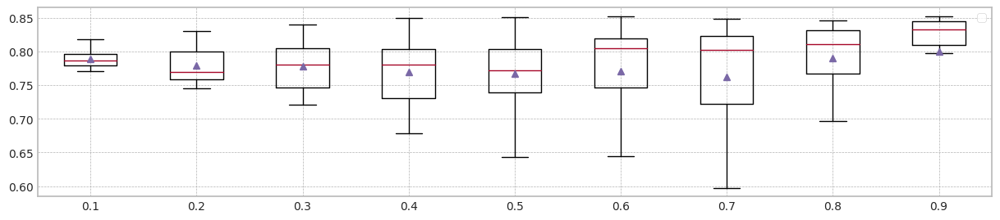

In [ ]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()


In [ ]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 50,lambda_f2=alpha,trial_count=20,weight_init=True,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 20
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.38it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.22it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.027065
x1    0.028176
x2    0.109014
x3    0.084839
z0    0.190484
dtype: float64
Mean F1 for all data: 0.7847296156029623
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7847296156029623
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.56it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.11it/s]


Test f1 score: 0.8777471010491441
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.060122
x1    0.069659
x2    0.038032
x3    0.173842
z0    0.188943
dtype: float64
Mean F1 for all data: 0.7533102029677848
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7690199092853736
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.07it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.40it/s]


Test f1 score: 0.8772045855379188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.052222
x1    0.053194
x2    0.024362
x3    0.082269
z0    0.253409
dtype: float64
Mean F1 for all data: 0.7429933292966631
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7533102029677848
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.13it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.84it/s]


Test f1 score: 0.8776231499889551
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.035846
x1    0.045688
x2    0.012498
x3    0.035778
z0    0.297968
dtype: float64
Mean F1 for all data: 0.7476691969630842
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7504896999654345
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.52it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.28it/s]


Test f1 score: 0.8773553719008265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.058172
x1    0.067566
x2    0.061473
x3    0.130423
z0    0.245616
dtype: float64
Mean F1 for all data: 0.725130772075043
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7476691969630842
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.51it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.8775600088086324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.028530
x1    0.039789
x2    0.052982
x3    0.096430
z0    0.137437
dtype: float64
Mean F1 for all data: 0.7917776601189734
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7504896999654345
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.59it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.55it/s]


Test f1 score: 0.8795154185022026
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.018516
x1    0.030652
x2    0.075165
x3    0.131176
z0    0.139484
dtype: float64
Mean F1 for all data: 0.7828372577515723
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7533102029677848
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.62it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.41it/s]


Test f1 score: 0.878603777753231
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.049803
x1    0.071964
x2    0.051229
x3    0.105097
z0    0.163957
dtype: float64
Mean F1 for all data: 0.8263273731462396
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7680737303596785
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.37it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.43it/s]


Test f1 score: 0.878891211087889
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.028903
x1    0.081548
x2    0.070315
x3    0.020545
z0    0.178753
dtype: float64
Mean F1 for all data: 0.790926448385082
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7828372577515723
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.20it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.35it/s]


Test f1 score: 0.8790482485128884
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.029000
x1    0.042556
x2    0.010907
x3    0.082935
z0    0.154211
dtype: float64
Mean F1 for all data: 0.7872086534726536
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7837834366772674
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.61it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.28it/s]


Test f1 score: 0.8790918108674088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.071982
x1    0.068599
x2    0.021821
x3    0.107563
z0    0.172552
dtype: float64
Mean F1 for all data: 0.7677943498873947
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7828372577515723
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.07it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.90it/s]


Test f1 score: 0.8785273368606702
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.150548
x1    0.039050
x2    0.029620
x3    0.138699
z0    0.132978
dtype: float64
Mean F1 for all data: 0.7865349548360235
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7837834366772674
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.70it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.03it/s]


Test f1 score: 0.8785541106458012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.051147
x1    0.054928
x2    0.097710
x3    0.038907
z0    0.173215
dtype: float64
Mean F1 for all data: 0.7745263963695552
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7828372577515723
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.44it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.03it/s]


Test f1 score: 0.8775915306572563
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.096513
x1    0.047871
x2    0.019824
x3    0.015380
z0    0.210201
dtype: float64
Mean F1 for all data: 0.7795451170967518
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.781191187424162
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.56it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.07it/s]


Test f1 score: 0.8775600088086324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.051832
x1    0.042857
x2    0.018799
x3    0.051857
z0    0.190351
dtype: float64
Mean F1 for all data: 0.7776609261008789
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7795451170967518
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.27it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.09it/s]


Test f1 score: 0.8780273007485689
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.050165
x1    0.028276
x2    0.056670
x3    0.075373
z0    0.244516
dtype: float64
Mean F1 for all data: 0.7505134654062274
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7786030215988153
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 692.62it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.10it/s]


Test f1 score: 0.8785603886067564
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.021233
x1    0.056957
x2    0.044724
x3    0.116943
z0    0.144889
dtype: float64
Mean F1 for all data: 0.7813930540098474
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7795451170967518
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 686.08it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.95it/s]


Test f1 score: 0.87662121715996
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.023455
x1    0.031409
x2    0.063208
x3    0.020559
z0    0.135280
dtype: float64
Mean F1 for all data: 0.8030723890509832
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7804690855532996
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.09it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.10it/s]


Test f1 score: 0.8780165289256198
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.094914
x1    0.058172
x2    0.032842
x3    0.110832
z0    0.208828
dtype: float64
Mean F1 for all data: 0.7521468986006146
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7795451170967518
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.36it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.05it/s]


Test f1 score: 0.8776343374158666
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.052251
x1    0.070409
x2    0.087523
x3    0.049459
z0    0.186921
dtype: float64
Mean F1 for all data: 0.7934165302006676
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7804690855532996


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.571484
1,1,0.877387,0.875055,0.794639,0.728317,5.611683
2,2,0.877495,0.875277,0.795524,0.728160,5.632079
3,3,0.877062,0.875083,0.790934,0.722198,5.596306
4,4,0.877533,0.875290,0.798808,0.734326,5.667720
5,5,0.877657,0.875042,0.797866,0.732107,5.652786
6,6,0.877065,0.874751,0.798957,0.734662,5.736763
7,7,0.878097,0.875857,0.800117,0.738893,5.700637
8,8,0.876011,0.873678,0.798367,0.734024,5.567916
9,9,0.877915,0.875925,0.799375,0.734754,5.626381


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877463,0.875539,0.784730,0.706884,5.879997
1,1,0.877747,0.875042,0.753310,0.623991,5.679121
2,2,0.877205,0.875263,0.742993,0.600529,5.680603
3,3,0.877623,0.875680,0.747669,0.619008,5.744168
4,4,0.877355,0.875194,0.725131,0.553837,5.692888
5,5,0.877560,0.875733,0.791778,0.708125,5.679737
6,6,0.879515,0.876925,0.782837,0.684112,5.675710
7,7,0.878604,0.876499,0.826327,0.773049,5.601365
8,8,0.878891,0.877391,0.790926,0.730735,5.627870
9,9,0.879048,0.877076,0.787209,0.714713,5.653172


trial_count: 20
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.18it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.05it/s]


Test f1 score: 0.8786407766990292
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.034337
x1    0.032158
x2    0.078004
x3    0.095796
z0    0.255534
dtype: float64
Mean F1 for all data: 0.7502270431125369
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7502270431125369
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.56it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.36it/s]


Test f1 score: 0.8783068783068783
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.105710
x1    0.014290
x2    0.037308
x3    0.203086
z0    0.261839
dtype: float64
Mean F1 for all data: 0.6929127691521577
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7215699061323473
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.08it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.18it/s]


Test f1 score: 0.8775915306572563
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.139918
x1    0.051301
x2    0.028061
x3    0.066806
z0    0.310419
dtype: float64
Mean F1 for all data: 0.7039404731712203
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7039404731712203
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.52it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.73it/s]


Test f1 score: 0.8775577922796151
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.065047
x1    0.044086
x2    0.017136
x3    0.030799
z0    0.347434
dtype: float64
Mean F1 for all data: 0.7322968442080048
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7181186586896126
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.02it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.19it/s]


Test f1 score: 0.8785564042953614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.087007
x1    0.070100
x2    0.083903
x3    0.180068
z0    0.284552
dtype: float64
Mean F1 for all data: 0.6445305377573157
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7039404731712203
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.33it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.60it/s]


Test f1 score: 0.8782157447278348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.027265
x1    0.046767
x2    0.100154
x3    0.100900
z0    0.127996
dtype: float64
Mean F1 for all data: 0.77583631752172
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7181186586896126
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.71it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.77it/s]


Test f1 score: 0.879145091990746
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.017591
x1    0.046470
x2    0.084312
x3    0.038082
z0    0.119061
dtype: float64
Mean F1 for all data: 0.7964119300836463
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7322968442080048
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.15it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.69it/s]


Test f1 score: 0.8793370165745855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.058806
x1    0.100039
x2    0.058699
x3    0.283720
z0    0.165824
dtype: float64
Mean F1 for all data: 0.8060014161703413
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7412619436602708
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.56it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.94it/s]


Test f1 score: 0.8795419511120899
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.035806
x1    0.113756
x2    0.143215
x3    0.150746
z0    0.117971
dtype: float64
Mean F1 for all data: 0.8094466478532258
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7502270431125369
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.85it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.68it/s]


Test f1 score: 0.8795061183992945
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.034387
x1    0.074670
x2    0.014785
x3    0.150423
z0    0.130867
dtype: float64
Mean F1 for all data: 0.7695404692390855
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7598837561758112
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.03it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.28it/s]


Test f1 score: 0.880052869258729
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.080097
x1    0.088161
x2    0.021821
x3    0.118634
z0    0.196792
dtype: float64
Mean F1 for all data: 0.7422099025741999
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7502270431125369
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.24it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.10it/s]


Test f1 score: 0.8790118010367265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.336867
x1    0.013004
x2    0.034290
x3    0.193452
z0    0.117240
dtype: float64
Mean F1 for all data: 0.7646280941275025
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7574275686200197
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.16it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.93it/s]


Test f1 score: 0.8787411971830985
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.054190
x1    0.071699
x2    0.152767
x3    0.035412
z0    0.233785
dtype: float64
Mean F1 for all data: 0.7269916838705138
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7502270431125369
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.72it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.30it/s]


Test f1 score: 0.878985107556536
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.151136
x1    0.041695
x2    0.026244
x3    0.055792
z0    0.115824
dtype: float64
Mean F1 for all data: 0.7958848707816908
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7574275686200197
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.51it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.13it/s]


Test f1 score: 0.8793027360988526
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.167789
x1    0.051792
x2    0.039756
x3    0.127118
z0    0.174133
dtype: float64
Mean F1 for all data: 0.7357429332216837
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7502270431125369
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.67it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.08it/s]


Test f1 score: 0.8780380026513477
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.050104
x1    0.034581
x2    0.084738
x3    0.091771
z0    0.387878
dtype: float64
Mean F1 for all data: 0.647095233745564
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7462184728433684
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.94it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.02it/s]


Test f1 score: 0.8794341916233839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.020007
x1    0.061276
x2    0.096090
x3    0.153470
z0    0.156950
dtype: float64
Mean F1 for all data: 0.7353438895241841
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7422099025741999
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.38it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.8781680746998667
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.035312
x1    0.068301
x2    0.098072
x3    0.024652
z0    0.100520
dtype: float64
Mean F1 for all data: 0.823836363031215
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7462184728433684
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.39it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.08it/s]


Test f1 score: 0.8784261715296198
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.106778
x1    0.063649
x2    0.067595
x3    0.115269
z0    0.266961
dtype: float64
Mean F1 for all data: 0.7162890013196906
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7422099025741999
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.06it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.59it/s]


Test f1 score: 0.8784097183876312
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.131129
x1    0.073706
x2    0.137505
x3    0.064864
z0    0.130032
dtype: float64
Mean F1 for all data: 0.7635793178233728
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7462184728433684


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.746759
1,1,0.877387,0.875055,0.794639,0.728317,5.703972
2,2,0.877495,0.875277,0.795524,0.728160,5.577810
3,3,0.877062,0.875083,0.790934,0.722198,5.559146
4,4,0.877533,0.875290,0.798808,0.734326,5.545832
5,5,0.877657,0.875042,0.797866,0.732107,5.635917
6,6,0.877065,0.874751,0.798957,0.734662,5.629779
7,7,0.878097,0.875857,0.800117,0.738893,5.744965
8,8,0.876011,0.873678,0.798367,0.734024,5.660073
9,9,0.877915,0.875925,0.799375,0.734754,5.708784


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878641,0.876469,0.750227,0.592722,5.619378
1,1,0.878307,0.874847,0.692913,0.477076,5.640312
2,2,0.877592,0.874722,0.703940,0.502031,5.663251
3,3,0.877558,0.874833,0.732297,0.579087,5.648534
4,4,0.878556,0.875056,0.644531,0.314673,5.616708
5,5,0.878216,0.875985,0.775836,0.668839,5.688246
6,6,0.879145,0.877185,0.796412,0.714091,5.670463
7,7,0.879337,0.877762,0.806001,0.712177,5.645082
8,8,0.879542,0.877379,0.809447,0.772627,5.671668
9,9,0.879506,0.877438,0.769540,0.668686,5.665186


trial_count: 20
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.81it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.66it/s]


Test f1 score: 0.8795567867036012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.033491
x1    0.035125
x2    0.133312
x3    0.182337
z0    0.207832
dtype: float64
Mean F1 for all data: 0.7458503713466825
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7458503713466825
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.96it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.45it/s]


Test f1 score: 0.8774834437086093
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.183925
x1    0.049774
x2    0.037724
x3    0.152068
z0    0.463129
dtype: float64
Mean F1 for all data: 0.5471216328464276
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.646486002096555
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.20it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.54it/s]


Test f1 score: 0.8783185840707965
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.243412
x1    0.083265
x2    0.029918
x3    0.052247
z0    0.549075
dtype: float64
Mean F1 for all data: 0.538855710432506
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.5471216328464276
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.87it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.8777949966792119
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.053717
x1    0.036057
x2    0.013100
x3    0.023530
z0    0.453699
dtype: float64
Mean F1 for all data: 0.6620317892426695
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.6045767110445486
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.97it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.67it/s]


Test f1 score: 0.8782927642547516
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.156914
x1    0.151821
x2    0.283573
x3    0.456516
z0    0.611534
dtype: float64
Mean F1 for all data: 0.8518347625675973
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.6620317892426695
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.66it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.94it/s]


Test f1 score: 0.879213172726268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.026348
x1    0.043803
x2    0.123523
x3    0.115710
z0    0.091785
dtype: float64
Mean F1 for all data: 0.7825609640468018
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.703941080294676
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.20it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.18it/s]


Test f1 score: 0.8795419511120899
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.020014
x1    0.052122
x2    0.131939
x3    0.023362
z0    0.174774
dtype: float64
Mean F1 for all data: 0.7724119154722172
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7458503713466825
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.39it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.98it/s]


Test f1 score: 0.8796992481203008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.083717
x1    0.148513
x2    0.062889
x3    0.330566
z0    0.154738
dtype: float64
Mean F1 for all data: 0.7893523213063175
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7591311434094499
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.00it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.74it/s]


Test f1 score: 0.87988518436741
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.042179
x1    0.258821
x2    0.148749
x3    0.413362
z0    0.107720
dtype: float64
Mean F1 for all data: 0.7838731440921692
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7724119154722172
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.62it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.16it/s]


Test f1 score: 0.8791864706532553
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.036591
x1    0.032928
x2    0.018194
x3    0.133276
z0    0.158086
dtype: float64
Mean F1 for all data: 0.7713418043042153
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7718768598882162
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.20it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.54it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.103222
x1    0.073011
x2    0.045154
x3    0.153125
z0    0.277251
dtype: float64
Mean F1 for all data: 0.672479506655058
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7713418043042153
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.85it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.86it/s]


Test f1 score: 0.8803088803088804
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.448398
x1    0.052136
x2    0.052971
x3    0.194896
z0    0.295910
dtype: float64
Mean F1 for all data: 0.721506279130391
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.758596087825449
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.32it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.34it/s]


Test f1 score: 0.8794781070322866
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.054728
x1    0.095068
x2    0.226480
x3    0.036333
z0    0.316710
dtype: float64
Mean F1 for all data: 0.6563186597816048
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7458503713466825
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.69it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.13it/s]


Test f1 score: 0.8798941215396492
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.281609
x1    0.362814
x2    0.052075
x3    0.235452
z0    0.120412
dtype: float64
Mean F1 for all data: 0.7824812463146551
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.758596087825449
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.57it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.91it/s]


Test f1 score: 0.8791330310737587
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.386842
x1    0.060606
x2    0.062573
x3    0.155842
z0    0.169821
dtype: float64
Mean F1 for all data: 0.6591877897047402
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7458503713466825
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.97it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.93it/s]


Test f1 score: 0.8783992925049745
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.060652
x1    0.039039
x2    0.091667
x3    0.055720
z0    0.514430
dtype: float64
Mean F1 for all data: 0.5589950337781586
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7336783252385368
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.67it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.26it/s]


Test f1 score: 0.8792760979916134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.019832
x1    0.063061
x2    0.136871
x3    0.186032
z0    0.186452
dtype: float64
Mean F1 for all data: 0.6863650347698594
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.721506279130391
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.85it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.8784278894193406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.024767
x1    0.067276
x2    0.099785
x3    0.090423
z0    0.211921
dtype: float64
Mean F1 for all data: 0.8512844816910451
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7336783252385368
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.76it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.04it/s]


Test f1 score: 0.8783992925049745
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.096724
x1    0.073839
x2    0.106663
x3    0.042369
z0    0.369520
dtype: float64
Mean F1 for all data: 0.6343074599293945
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.721506279130391
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.47it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.13it/s]


Test f1 score: 0.8797440423654016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.132570
x1    0.069387
x2    0.172946
x3    0.072050
z0    0.119226
dtype: float64
Mean F1 for all data: 0.7544079101793296
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7336783252385368


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.646478
1,1,0.877387,0.875055,0.794639,0.728317,5.688507
2,2,0.877495,0.875277,0.795524,0.728160,5.712586
3,3,0.877062,0.875083,0.790934,0.722198,5.715285
4,4,0.877533,0.875290,0.798808,0.734326,5.639473
5,5,0.877657,0.875042,0.797866,0.732107,5.572913
6,6,0.877065,0.874751,0.798957,0.734662,5.588635
7,7,0.878097,0.875857,0.800117,0.738893,5.556370
8,8,0.876011,0.873678,0.798367,0.734024,5.609340
9,9,0.877915,0.875925,0.799375,0.734754,5.599792


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879557,0.877647,0.745850,0.598048,5.836208
1,1,0.877483,0.874402,0.547122,0.157430,5.676094
2,2,0.878319,0.874930,0.538856,0.148597,5.669910
3,3,0.877795,0.874735,0.662032,0.404134,5.642458
4,4,0.878293,0.878882,0.851835,0.813247,5.653341
5,5,0.879213,0.877458,0.782561,0.676463,5.645761
6,6,0.879542,0.877919,0.772412,0.634766,5.655780
7,7,0.879699,0.877973,0.789352,0.689790,5.714438
8,8,0.879885,0.877735,0.783873,0.687617,5.562522
9,9,0.879186,0.877029,0.771342,0.673026,5.639364


trial_count: 20
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.43it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.03it/s]


Test f1 score: 0.8795313881520778
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.027695
x1    0.032061
x2    0.076746
x3    0.188907
z0    0.224269
dtype: float64
Mean F1 for all data: 0.71624704600726
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.71624704600726
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.24it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.23it/s]


Test f1 score: 0.8794608330571207
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.428168
x1    0.283871
x2    0.260043
x3    0.595817
z0    0.675613
dtype: float64
Mean F1 for all data: 0.8411562427261436
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7787016443667019
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.06it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.98it/s]


Test f1 score: 0.8786776859504132
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.290348
x1    0.187287
x2    0.037373
x3    0.064323
z0    0.462401
dtype: float64
Mean F1 for all data: 0.6181287226638941
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.71624704600726
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.20it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.96it/s]


Test f1 score: 0.8791038154392191
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.272118
x1    0.525760
x2    0.028036
x3    0.028498
z0    0.546219
dtype: float64
Mean F1 for all data: 0.7594770444620763
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7378620452346681
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.30it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.52it/s]


Test f1 score: 0.8808187520633872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.110828
x1    0.120964
x2    0.162330
x3    0.292387
z0    0.568168
dtype: float64
Mean F1 for all data: 0.857233231658189
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7594770444620763
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.30it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.34it/s]


Test f1 score: 0.880697494757753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.026527
x1    0.041627
x2    0.227380
x3    0.205545
z0    0.415341
dtype: float64
Mean F1 for all data: 0.843322642209025
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.80031664359411
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.68it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.87it/s]


Test f1 score: 0.8795220710255559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.023265
x1    0.060305
x2    0.149602
x3    0.028746
z0    0.324319
dtype: float64
Mean F1 for all data: 0.7292828338756436
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7594770444620763
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.30it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.31it/s]


Test f1 score: 0.8796818031156779
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.153437
x1    0.182892
x2    0.088312
x3    0.073369
z0    0.083430
dtype: float64
Mean F1 for all data: 0.8327025225303395
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.796089783496208
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.90it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.10it/s]


Test f1 score: 0.8780057357158614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.507538
x1    0.533846
x2    0.107810
x3    0.543746
z0    0.383652
dtype: float64
Mean F1 for all data: 0.7535302171795378
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7594770444620763
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.01it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.43it/s]


Test f1 score: 0.8799382034870888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.050971
x1    0.062455
x2    0.025513
x3    0.021183
z0    0.206588
dtype: float64
Mean F1 for all data: 0.797152673188722
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7783148588253992
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.27it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.19it/s]


Test f1 score: 0.8789456196699524
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.095466
x1    0.074384
x2    0.089839
x3    0.141824
z0    0.122577
dtype: float64
Mean F1 for all data: 0.7582682826586987
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7594770444620763
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.30it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.23it/s]


Test f1 score: 0.879317980513729
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.419541
x1    0.048688
x2    0.438534
x3    0.261602
z0    0.354731
dtype: float64
Mean F1 for all data: 0.8013644791849123
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7783148588253992
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.11it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.84it/s]


Test f1 score: 0.8785541106458012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.049247
x1    0.064487
x2    0.164634
x3    0.032029
z0    0.262104
dtype: float64
Mean F1 for all data: 0.71071126224852
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7594770444620763
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.61it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.82it/s]


Test f1 score: 0.8811466372657112
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.324244
x1    0.023269
x2    0.013165
x3    0.288789
z0    0.106581
dtype: float64
Mean F1 for all data: 0.7088505478275177
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7588726635603875
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.46it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.89it/s]


Test f1 score: 0.8790774299835256
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.538290
x1    0.064333
x2    0.069534
x3    0.166269
z0    0.157183
dtype: float64
Mean F1 for all data: 0.5793187454436789
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7582682826586987
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.63it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.79it/s]


Test f1 score: 0.8784798939460893
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.344337
x1    0.063484
x2    0.079283
x3    0.044290
z0    0.617495
dtype: float64
Mean F1 for all data: 0.4451076039965906
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7558992499191183
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.81it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.28it/s]


Test f1 score: 0.8804239814508116
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.019806
x1    0.060319
x2    0.171806
x3    0.185996
z0    0.240935
dtype: float64
Mean F1 for all data: 0.6440540669923864
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7535302171795378
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.64it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.63it/s]


Test f1 score: 0.8782271468144045
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.063448
x1    0.017771
x2    0.097900
x3    0.247172
z0    0.454875
dtype: float64
Mean F1 for all data: 0.7942832040138915
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7558992499191183
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.99it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.11it/s]


Test f1 score: 0.8786805401815364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.093634
x1    0.089935
x2    0.199774
x3    0.084953
z0    0.452047
dtype: float64
Mean F1 for all data: 0.6494121763667792
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7535302171795378
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.71it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.51it/s]


Test f1 score: 0.8795406867616208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.177534
x1    0.088846
x2    0.202581
x3    0.124315
z0    0.529760
dtype: float64
Mean F1 for all data: 0.784873093491244
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7558992499191183


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.660976
1,1,0.877387,0.875055,0.794639,0.728317,5.570915
2,2,0.877495,0.875277,0.795524,0.728160,5.604583
3,3,0.877062,0.875083,0.790934,0.722198,5.622756
4,4,0.877533,0.875290,0.798808,0.734326,5.607417
5,5,0.877657,0.875042,0.797866,0.732107,5.656512
6,6,0.877065,0.874751,0.798957,0.734662,5.683608
7,7,0.878097,0.875857,0.800117,0.738893,5.664868
8,8,0.876011,0.873678,0.798367,0.734024,5.670535
9,9,0.877915,0.875925,0.799375,0.734754,5.568572


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879531,0.877919,0.716247,0.510258,5.673508
1,1,0.879461,0.878929,0.841156,0.799350,5.636299
2,2,0.878678,0.875791,0.618129,0.278131,5.673114
3,3,0.879104,0.876605,0.759477,0.682625,5.700177
4,4,0.880819,0.880572,0.857233,0.845884,5.623461
5,5,0.880697,0.880230,0.843323,0.817468,5.655909
6,6,0.879522,0.878629,0.729283,0.484620,5.819769
7,7,0.879682,0.878108,0.832703,0.817104,5.660847
8,8,0.878006,0.875818,0.753530,0.674228,5.569390
9,9,0.879938,0.878660,0.797153,0.731488,5.580224


trial_count: 20
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.92it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.30it/s]


Test f1 score: 0.8791257313169225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.404068
x1    0.030685
x2    0.098075
x3    0.178079
z0    0.422115
dtype: float64
Mean F1 for all data: 0.6201103610748702
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.6201103610748702
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.28it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.93it/s]


Test f1 score: 0.8806102144594297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.501032
x1    0.499910
x2    0.400215
x3    0.546047
z0    0.695824
dtype: float64
Mean F1 for all data: 0.8348454792424813
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7274779201586757
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.33it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.07it/s]


Test f1 score: 0.8773793714032757
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.344129
x1    0.277194
x2    0.045190
x3    0.066556
z0    0.530978
dtype: float64
Mean F1 for all data: 0.566328208001113
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.6201103610748702
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.98it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.70it/s]


Test f1 score: 0.87988518436741
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.269556
x1    0.633240
x2    0.042039
x3    0.026896
z0    0.675867
dtype: float64
Mean F1 for all data: 0.7943411467866336
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7072257539307518
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.68it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.44it/s]


Test f1 score: 0.8803701255783212
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.325276
x1    0.328832
x2    0.504763
x3    0.071663
z0    0.614072
dtype: float64
Mean F1 for all data: 0.8189663089228841
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7943411467866336
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.95it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.42it/s]


Test f1 score: 0.8803447132913489
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.025778
x1    0.072523
x2    0.132631
x3    0.233186
z0    0.462584
dtype: float64
Mean F1 for all data: 0.8504236117639375
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.8066537278547589
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.88it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.08it/s]


Test f1 score: 0.8798496739250581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.031857
x1    0.170552
x2    0.160581
x3    0.016742
z0    0.401828
dtype: float64
Mean F1 for all data: 0.7415804878022918
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7943411467866336
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.17it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.70it/s]


Test f1 score: 0.8777234326367274
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.055498
x1    0.147914
x2    0.398477
x3    0.191118
z0    0.353172
dtype: float64
Mean F1 for all data: 0.8187416865358239
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.8065414166612288
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.54it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.54it/s]


Test f1 score: 0.8789794786467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.453670
x1    0.582427
x2    0.209953
x3    0.586254
z0    0.140487
dtype: float64
Mean F1 for all data: 0.7418983625946606
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7943411467866336
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.19it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.12it/s]


Test f1 score: 0.8794357504959224
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.054649
x1    0.016545
x2    0.030792
x3    0.020387
z0    0.321523
dtype: float64
Mean F1 for all data: 0.7107055691742111
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7681197546906471
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.89it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.00it/s]


Test f1 score: 0.8788346943279629
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.422907
x1    0.088151
x2    0.124129
x3    0.238470
z0    0.503401
dtype: float64
Mean F1 for all data: 0.8513787216165328
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7943411467866336
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.97it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.43it/s]


Test f1 score: 0.8799382034870888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.535050
x1    0.048147
x2    0.411821
x3    0.252616
z0    0.524122
dtype: float64
Mean F1 for all data: 0.7989491506225845
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7966451487046091
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.48it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.15it/s]


Test f1 score: 0.8789049563969533
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.043946
x1    0.060871
x2    0.300315
x3    0.033136
z0    0.203251
dtype: float64
Mean F1 for all data: 0.7108720907563659
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7943411467866336
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.44it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.57it/s]


Test f1 score: 0.8808473080317739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.382272
x1    0.019832
x2    0.012771
x3    0.350928
z0    0.107907
dtype: float64
Mean F1 for all data: 0.6487895833525023
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7681197546906471
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.80it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.39it/s]


Test f1 score: 0.8795140806184427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.627419
x1    0.085014
x2    0.087609
x3    0.173373
z0    0.140703
dtype: float64
Mean F1 for all data: 0.46473967984477654
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7418983625946606
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.35it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.04it/s]


Test f1 score: 0.8784383318544808
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.423796
x1    0.068538
x2    0.097523
x3    0.113401
z0    0.651484
dtype: float64
Mean F1 for all data: 0.4226233955234879
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7417394251984761
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.37it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.91it/s]


Test f1 score: 0.8792494481236203
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.028004
x1    0.066151
x2    0.160559
x3    0.228731
z0    0.256817
dtype: float64
Mean F1 for all data: 0.6235121362553816
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7415804878022918
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.32it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.51it/s]


Test f1 score: 0.8777249087086422
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.212423
x1    0.082240
x2    0.097624
x3    0.336695
z0    0.509502
dtype: float64
Mean F1 for all data: 0.8115702241506159
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7417394251984761
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.69it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.56it/s]


Test f1 score: 0.878232044198895
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.022308
x1    0.077720
x2    0.106133
x3    0.084581
z0    0.506384
dtype: float64
Mean F1 for all data: 0.6167417837095006
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7415804878022918
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.09it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.35it/s]


Test f1 score: 0.8796030871003306
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.078649
x1    0.136147
x2    0.206269
x3    0.189645
z0    0.598470
dtype: float64
Mean F1 for all data: 0.7443015188385981
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7417394251984761


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.797278
1,1,0.877387,0.875055,0.794639,0.728317,5.663055
2,2,0.877495,0.875277,0.795524,0.728160,5.687706
3,3,0.877062,0.875083,0.790934,0.722198,5.661479
4,4,0.877533,0.875290,0.798808,0.734326,5.610778
5,5,0.877657,0.875042,0.797866,0.732107,5.600244
6,6,0.877065,0.874751,0.798957,0.734662,5.614621
7,7,0.878097,0.875857,0.800117,0.738893,5.584187
8,8,0.876011,0.873678,0.798367,0.734024,5.606340
9,9,0.877915,0.875925,0.799375,0.734754,5.662325


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879126,0.877111,0.620110,0.297205,5.672318
1,1,0.880610,0.880470,0.834845,0.797279,5.614791
2,2,0.877379,0.874163,0.566328,0.177592,5.652333
3,3,0.879885,0.877973,0.794341,0.783679,5.633067
4,4,0.880370,0.879965,0.818966,0.721413,5.768351
5,5,0.880345,0.880000,0.850424,0.835323,5.652397
6,6,0.879850,0.878970,0.741580,0.511269,5.653295
7,7,0.877723,0.876244,0.818742,0.801165,5.693215
8,8,0.878979,0.877424,0.741898,0.674228,5.658564
9,9,0.879436,0.877411,0.710706,0.506986,5.727993


trial_count: 20
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.74it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.48it/s]


Test f1 score: 0.8787811879001987
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.401129
x1    0.028043
x2    0.141871
x3    0.177674
z0    0.481541
dtype: float64
Mean F1 for all data: 0.5866800927624064
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.5866800927624064
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.02it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.8810466138962182
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.458989
x1    0.342434
x2    0.051319
x3    0.223247
z0    0.520226
dtype: float64
Mean F1 for all data: 0.7525244287986417
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.6696022607805241
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.96it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.8797175016552636
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.584509
x1    0.382194
x2    0.528197
x3    0.089735
z0    0.732369
dtype: float64
Mean F1 for all data: 0.7666034041978703
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7525244287986417
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.75it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.29it/s]


Test f1 score: 0.8780922665478048
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.216330
x1    0.596394
x2    0.053720
x3    0.020530
z0    0.706491
dtype: float64
Mean F1 for all data: 0.6500957189242185
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7013100738614301
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.24it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.92it/s]


Test f1 score: 0.8801589053189142
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.386918
x1    0.404118
x2    0.578516
x3    0.044681
z0    0.658681
dtype: float64
Mean F1 for all data: 0.7987644083597133
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7525244287986417
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.64it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.76it/s]


Test f1 score: 0.8809261300992282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.025423
x1    0.100219
x2    0.248502
x3    0.253706
z0    0.656391
dtype: float64
Mean F1 for all data: 0.8493440812242897
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7595639164982559
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.59it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.89it/s]


Test f1 score: 0.8796101450880497
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.021014
x1    0.469599
x2    0.145262
x3    0.072867
z0    0.257900
dtype: float64
Mean F1 for all data: 0.839536639208399
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7666034041978703
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.79it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.60it/s]


Test f1 score: 0.8785357737104825
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.332333
x1    0.236344
x2    0.422065
x3    0.127047
z0    0.210183
dtype: float64
Mean F1 for all data: 0.831402596847297
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7826839062787918
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.70it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.24it/s]


Test f1 score: 0.8786165613568341
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.520746
x1    0.428771
x2    0.076724
x3    0.617057
z0    0.499789
dtype: float64
Mean F1 for all data: 0.744694166725077
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7666034041978703
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.79it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.90it/s]


Test f1 score: 0.8788546255506607
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.052344
x1    0.493828
x2    0.087480
x3    0.023011
z0    0.316448
dtype: float64
Mean F1 for all data: 0.7447441620962626
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7595639164982559
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.52it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.57it/s]


Test f1 score: 0.8798145900011036
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.430961
x1    0.053896
x2    0.131652
x3    0.151401
z0    0.182996
dtype: float64
Mean F1 for all data: 0.7498950483043249
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7525244287986417
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.61it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.50it/s]


Test f1 score: 0.8799822852081487
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.589896
x1    0.022319
x2    0.435434
x3    0.325609
z0    0.336867
dtype: float64
Mean F1 for all data: 0.6019469086733069
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7512097385514833
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.05it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.28it/s]


Test f1 score: 0.8794169611307421
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.033165
x1    0.059910
x2    0.331258
x3    0.041789
z0    0.354986
dtype: float64
Mean F1 for all data: 0.6323509408384332
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7498950483043249
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 685.69it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.84it/s]


Test f1 score: 0.8792645104120514
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.401989
x1    0.026011
x2    0.014165
x3    0.118305
z0    0.143466
dtype: float64
Mean F1 for all data: 0.7042329629568798
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7473196052002937
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.92it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.08it/s]


Test f1 score: 0.8806711557567061
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.662011
x1    0.065430
x2    0.153792
x3    0.194624
z0    0.225760
dtype: float64
Mean F1 for all data: 0.39747495196983185
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7447441620962626
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.04it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.97it/s]


Test f1 score: 0.8783664459161148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.631645
x1    0.085520
x2    0.198427
x3    0.078244
z0    0.665509
dtype: float64
Mean F1 for all data: 0.6536092643625097
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7447191644106699
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.12it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.12it/s]


Test f1 score: 0.8795660836838609
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.023781
x1    0.067914
x2    0.197968
x3    0.208373
z0    0.298910
dtype: float64
Mean F1 for all data: 0.6089173948037456
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.744694166725077
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.04it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.64it/s]


Test f1 score: 0.8787073926516158
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.277753
x1    0.046222
x2    0.045746
x3    0.334072
z0    0.553473
dtype: float64
Mean F1 for all data: 0.7564664652181785
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7447191644106699
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.37it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.66it/s]


Test f1 score: 0.8778651312147049
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.146061
x1    0.695165
x2    0.178308
x3    0.142197
z0    0.647950
dtype: float64
Mean F1 for all data: 0.754765320707857
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7447441620962626
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.73it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.11it/s]


Test f1 score: 0.880907788917043
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.124534
x1    0.250581
x2    0.312685
x3    0.139516
z0    0.640391
dtype: float64
Mean F1 for all data: 0.7516047166582774
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7473196052002937


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.601068
1,1,0.877387,0.875055,0.794639,0.728317,5.668116
2,2,0.877495,0.875277,0.795524,0.728160,5.692134
3,3,0.877062,0.875083,0.790934,0.722198,5.729912
4,4,0.877533,0.875290,0.798808,0.734326,5.693971
5,5,0.877657,0.875042,0.797866,0.732107,5.811889
6,6,0.877065,0.874751,0.798957,0.734662,5.612557
7,7,0.878097,0.875857,0.800117,0.738893,5.677395
8,8,0.876011,0.873678,0.798367,0.734024,5.592173
9,9,0.877915,0.875925,0.799375,0.734754,5.565008


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878781,0.877458,0.586680,0.235227,5.723870
1,1,0.881047,0.881015,0.752524,0.645443,5.638963
2,2,0.879718,0.879162,0.766603,0.674377,5.605917
3,3,0.878092,0.875450,0.650096,0.494309,5.593041
4,4,0.880159,0.879788,0.798764,0.687877,5.628007
5,5,0.880926,0.880363,0.849344,0.816259,5.582942
6,6,0.879610,0.878906,0.839537,0.811056,5.657193
7,7,0.878536,0.877478,0.831403,0.765729,5.668538
8,8,0.878617,0.877935,0.744694,0.674228,5.617066
9,9,0.878855,0.877352,0.744744,0.626344,5.658959


trial_count: 20
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.20it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.57it/s]


Test f1 score: 0.8785398230088497
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.364369
x1    0.081315
x2    0.232333
x3    0.176900
z0    0.533168
dtype: float64
Mean F1 for all data: 0.49824491704220436
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.49824491704220436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.84it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.75it/s]


Test f1 score: 0.8809023554130266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.539308
x1    0.383720
x2    0.243448
x3    0.241262
z0    0.475810
dtype: float64
Mean F1 for all data: 0.7119489710169893
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.6050969440295968
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.94it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.56it/s]


Test f1 score: 0.8803626713843433
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.643118
x1    0.330254
x2    0.606738
x3    0.080724
z0    0.737806
dtype: float64
Mean F1 for all data: 0.8096880796545023
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7119489710169893
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.46it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.14it/s]


Test f1 score: 0.8811312417145382
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.156065
x1    0.614935
x2    0.019832
x3    0.034125
z0    0.576423
dtype: float64
Mean F1 for all data: 0.7482086388384759
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7300788049277326
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.07it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.58it/s]


Test f1 score: 0.8800355121518145
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.169495
x1    0.220297
x2    0.174018
x3    0.230022
z0    0.518498
dtype: float64
Mean F1 for all data: 0.7794609460076745
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7482086388384759
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.95it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.31it/s]


Test f1 score: 0.8801147016653799
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.397968
x1    0.123183
x2    0.176358
x3    0.094498
z0    0.222989
dtype: float64
Mean F1 for all data: 0.8342820415798154
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7638347924230752
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.47it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.62it/s]


Test f1 score: 0.8796112215595318
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.357986
x1    0.518018
x2    0.119165
x3    0.151588
z0    0.481502
dtype: float64
Mean F1 for all data: 0.8449084570142489
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7794609460076745
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.94it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.72it/s]


Test f1 score: 0.8785603886067564
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.497735
x1    0.098631
x2    0.400642
x3    0.034272
z0    0.186548
dtype: float64
Mean F1 for all data: 0.8244087457636124
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7945745128310884
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.61it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.63it/s]


Test f1 score: 0.8815499779832673
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.441427
x1    0.477978
x2    0.155978
x3    0.641337
z0    0.530287
dtype: float64
Mean F1 for all data: 0.7710830472798382
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7794609460076745
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.56it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.38it/s]


Test f1 score: 0.8787311377905055
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.251032
x1    0.474179
x2    0.036616
x3    0.647871
z0    0.415935
dtype: float64
Mean F1 for all data: 0.7800656350615499
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7797632905346121
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.32it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.26it/s]


Test f1 score: 0.8790918108674088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.403097
x1    0.059681
x2    0.105315
x3    0.152366
z0    0.163405
dtype: float64
Mean F1 for all data: 0.738590701297504
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7794609460076745
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.81it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.46it/s]


Test f1 score: 0.8817961699317631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.673839
x1    0.087667
x2    0.398774
x3    0.233681
z0    0.230172
dtype: float64
Mean F1 for all data: 0.457070796120108
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7752719966437563
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.32it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.98it/s]


Test f1 score: 0.8794874627195405
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.020971
x1    0.090717
x2    0.328097
x3    0.130918
z0    0.388093
dtype: float64
Mean F1 for all data: 0.5385945716029547
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7710830472798382
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.67it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.28it/s]


Test f1 score: 0.8788246989948083
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.567498
x1    0.641950
x2    0.022971
x3    0.083179
z0    0.306835
dtype: float64
Mean F1 for all data: 0.8075217446624982
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7752719966437563
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.12it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.09it/s]


Test f1 score: 0.8792665414779631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.324254
x1    0.038900
x2    0.019427
x3    0.210939
z0    0.081186
dtype: float64
Mean F1 for all data: 0.7214487102791272
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7710830472798382
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.67it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.8795580110497239
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.593921
x1    0.036050
x2    0.110118
x3    0.183172
z0    0.715036
dtype: float64
Mean F1 for all data: 0.6116580649140742
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.759645843059157
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.67it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.54it/s]


Test f1 score: 0.8797258456776476
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.021358
x1    0.087541
x2    0.201326
x3    0.181172
z0    0.553498
dtype: float64
Mean F1 for all data: 0.46573659816151225
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7482086388384759
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.90it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.97it/s]


Test f1 score: 0.8802474591250552
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.448470
x1    0.068122
x2    0.112466
x3    0.127237
z0    0.554591
dtype: float64
Mean F1 for all data: 0.5660987176473836
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7433996700679899
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.35it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.38it/s]


Test f1 score: 0.87763245400133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.111520
x1    0.691484
x2    0.478276
x3    0.033380
z0    0.651681
dtype: float64
Mean F1 for all data: 0.7470260452524388
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7470260452524388
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.24it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.46it/s]


Test f1 score: 0.8804920913884008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.254595
x1    0.168778
x2    0.306061
x3    0.138104
z0    0.700025
dtype: float64
Mean F1 for all data: 0.7309516703007499
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7428083732749714


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.572485
1,1,0.877387,0.875055,0.794639,0.728317,5.662931
2,2,0.877495,0.875277,0.795524,0.728160,5.591803
3,3,0.877062,0.875083,0.790934,0.722198,5.593621
4,4,0.877533,0.875290,0.798808,0.734326,5.639896
5,5,0.877657,0.875042,0.797866,0.732107,5.685811
6,6,0.877065,0.874751,0.798957,0.734662,5.910662
7,7,0.878097,0.875857,0.800117,0.738893,5.744891
8,8,0.876011,0.873678,0.798367,0.734024,5.639560
9,9,0.877915,0.875925,0.799375,0.734754,5.668216


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878540,0.876685,0.498245,0.094098,5.639972
1,1,0.880902,0.880542,0.711949,0.570103,5.651467
2,2,0.880363,0.880000,0.809688,0.692799,5.613622
3,3,0.881131,0.879849,0.748209,0.674827,5.610174
4,4,0.880036,0.879099,0.779461,0.701378,5.683395
5,5,0.880115,0.879583,0.834282,0.805036,5.607649
6,6,0.879611,0.879131,0.844908,0.816948,5.634307
7,7,0.878560,0.877411,0.824409,0.760681,5.624530
8,8,0.881550,0.879070,0.771083,0.674974,5.593167
9,9,0.878731,0.878194,0.780066,0.709006,5.682147


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.21it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.62it/s]


Test f1 score: 0.88034566807002
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.329165
x1    0.051204
x2    0.326333
x3    0.288068
z0    0.509437
dtype: float64
Mean F1 for all data: 0.5063505227194826
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.5063505227194826
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.41it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.04it/s]


Test f1 score: 0.8807705081368316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.350968
x1    0.241753
x2    0.228280
x3    0.192860
z0    0.498358
dtype: float64
Mean F1 for all data: 0.75900192476106
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.6326762237402712
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.56it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.06it/s]


Test f1 score: 0.8807785888077859
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.526986
x1    0.560803
x2    0.171444
x3    0.202728
z0    0.679953
dtype: float64
Mean F1 for all data: 0.7339319860578993
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7339319860578993
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.64it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.84it/s]


Test f1 score: 0.8798935344349562
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.253369
x1    0.615186
x2    0.118695
x3    0.148595
z0    0.383570
dtype: float64
Mean F1 for all data: 0.8113459765094003
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.7464669554094796
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.39it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.63it/s]


Test f1 score: 0.8803088803088804
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.279520
x1    0.285645
x2    0.319584
x3    0.147792
z0    0.572172
dtype: float64
Mean F1 for all data: 0.7772201623265524
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.75900192476106
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.59it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.55it/s]


Test f1 score: 0.8788819875776397
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.091792
x1    0.418251
x2    0.307667
x3    0.163484
z0    0.490380
dtype: float64
Mean F1 for all data: 0.8464415655561537
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7681110435438062
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.60it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.08it/s]


Test f1 score: 0.8794075384105229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.335065
x1    0.545466
x2    0.138556
x3    0.188982
z0    0.541842
dtype: float64
Mean F1 for all data: 0.8479282345241329
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7772201623265524
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.99it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.90it/s]


Test f1 score: 0.8798500881834217
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.187201
x1    0.236358
x2    0.337513
x3    0.725996
z0    0.545258
dtype: float64
Mean F1 for all data: 0.7194790369010879
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7681110435438062
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.49it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.13it/s]


Test f1 score: 0.8802382002646669
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.434871
x1    0.515699
x2    0.170366
x3    0.606713
z0    0.615434
dtype: float64
Mean F1 for all data: 0.7480235393057143
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.75900192476106
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.18it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.60it/s]


Test f1 score: 0.8796214788732393
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.450914
x1    0.542810
x2    0.049208
x3    0.660545
z0    0.195262
dtype: float64
Mean F1 for all data: 0.7393140536017702
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7535127320333872
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.82it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.34it/s]


Test f1 score: 0.8792515134837644
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.400484
x1    0.073806
x2    0.484516
x3    0.162125
z0    0.142047
dtype: float64
Mean F1 for all data: 0.8236239748076494
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.75900192476106
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.22it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.86it/s]


Test f1 score: 0.880210618692409
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.358910
x1    0.233573
x2    0.401043
x3    0.066728
z0    0.330588
dtype: float64
Mean F1 for all data: 0.8365036850955107
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7681110435438062
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.53it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.36it/s]


Test f1 score: 0.8794701986754967
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.049272
x1    0.029749
x2    0.225616
x3    0.146616
z0    0.460237
dtype: float64
Mean F1 for all data: 0.5890024942960894
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.75900192476106
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.07it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.30it/s]


Test f1 score: 0.8791038154392191
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.652104
x1    0.620778
x2    0.067039
x3    0.200656
z0    0.087602
dtype: float64
Mean F1 for all data: 0.6988330924797284
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7535127320333872
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.25it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.20it/s]


Test f1 score: 0.8803003533568905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.144685
x1    0.106168
x2    0.299742
x3    0.227362
z0    0.150133
dtype: float64
Mean F1 for all data: 0.7989209858987105
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.75900192476106
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.06it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.01it/s]


Test f1 score: 0.8800354138999557
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.617570
x1    0.171258
x2    0.162194
x3    0.326487
z0    0.476154
dtype: float64
Mean F1 for all data: 0.4328980997124051
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7535127320333872
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.96it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.75it/s]


Test f1 score: 0.8792645104120514
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.024907
x1    0.500140
x2    0.171534
x3    0.236599
z0    0.142140
dtype: float64
Mean F1 for all data: 0.7849730060189437
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.75900192476106
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.13it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.45it/s]


Test f1 score: 0.8797334813992227
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.395341
x1    0.401391
x2    0.323297
x3    0.456685
z0    0.488007
dtype: float64
Mean F1 for all data: 0.8413775036297734
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7681110435438062
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.21it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.31it/s]


Test f1 score: 0.8793465062368915
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.131692
x1    0.582168
x2    0.274681
x3    0.268441
z0    0.253953
dtype: float64
Mean F1 for all data: 0.7784701341810505
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7772201623265524
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.56it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.85it/s]


Test f1 score: 0.880167566971668
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.422910
x1    0.606333
x2    0.508487
x3    0.350710
z0    0.750176
dtype: float64
Mean F1 for all data: 0.8489916889132086
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7778451482538015


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.629400
1,1,0.877387,0.875055,0.794639,0.728317,5.663795
2,2,0.877495,0.875277,0.795524,0.728160,5.599921
3,3,0.877062,0.875083,0.790934,0.722198,5.597955
4,4,0.877533,0.875290,0.798808,0.734326,5.599432
5,5,0.877657,0.875042,0.797866,0.732107,5.585079
6,6,0.877065,0.874751,0.798957,0.734662,5.670917
7,7,0.878097,0.875857,0.800117,0.738893,5.654063
8,8,0.876011,0.873678,0.798367,0.734024,5.641182
9,9,0.877915,0.875925,0.799375,0.734754,5.694355


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880346,0.877526,0.506351,0.112804,5.646765
1,1,0.880771,0.880071,0.759002,0.672209,5.654698
2,2,0.880779,0.879389,0.733932,0.674290,5.667361
3,3,0.879894,0.878832,0.811346,0.806854,5.590858
4,4,0.880309,0.879450,0.777220,0.708286,5.628386
5,5,0.878882,0.878038,0.846442,0.834969,5.621141
6,6,0.879408,0.878774,0.847928,0.829242,5.619990
7,7,0.879850,0.878874,0.719479,0.674228,5.642776
8,8,0.880238,0.878092,0.748024,0.674228,5.645431
9,9,0.879621,0.878638,0.739314,0.674228,5.659585


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.64it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.17it/s]


Test f1 score: 0.8790625690913111
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.336717
x1    0.068401
x2    0.169670
x3    0.703394
z0    0.691566
dtype: float64
Mean F1 for all data: 0.7709320129398184
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.7709320129398184
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.84it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.88it/s]


Test f1 score: 0.880035316190266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.498530
x1    0.312763
x2    0.265828
x3    0.093498
z0    0.363989
dtype: float64
Mean F1 for all data: 0.6949793248217152
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.7329556688807668
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.85it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.41it/s]


Test f1 score: 0.8791643760307861
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.704602
x1    0.552308
x2    0.226007
x3    0.653918
z0    0.605290
dtype: float64
Mean F1 for all data: 0.7328561078545011
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7328561078545011
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.28it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.57it/s]


Test f1 score: 0.8795061183992945
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.272842
x1    0.557928
x2    0.066190
x3    0.038391
z0    0.380867
dtype: float64
Mean F1 for all data: 0.7417687815674749
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.737312444710988
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.88it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.17it/s]


Test f1 score: 0.8809182209469154
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.373315
x1    0.436943
x2    0.358215
x3    0.250258
z0    0.666312
dtype: float64
Mean F1 for all data: 0.7816659784494616
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.7417687815674749
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.90it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.40it/s]


Test f1 score: 0.8809523809523809
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.037151
x1    0.370792
x2    0.415315
x3    0.429190
z0    0.636351
dtype: float64
Mean F1 for all data: 0.7695805578673427
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.7556746697174088
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.68it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.17it/s]


Test f1 score: 0.8786841814769842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.313140
x1    0.162341
x2    0.150168
x3    0.653792
z0    0.291799
dtype: float64
Mean F1 for all data: 0.7693224578990936
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.7693224578990936
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.46it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.25it/s]


Test f1 score: 0.8796662274923145
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.415882
x1    0.374882
x2    0.432376
x3    0.667219
z0    0.435448
dtype: float64
Mean F1 for all data: 0.7685647920594454
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.7689436249792695
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.90it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.86it/s]


Test f1 score: 0.8795300897705862
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.354996
x1    0.299875
x2    0.335326
x3    0.626125
z0    0.202771
dtype: float64
Mean F1 for all data: 0.7345441076512207
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7685647920594454
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.95it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.68it/s]


Test f1 score: 0.8803680981595092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.593849
x1    0.608183
x2    0.048624
x3    0.667244
z0    0.122688
dtype: float64
Mean F1 for all data: 0.7352392198621538
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7551667868134602
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.84it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.24it/s]


Test f1 score: 0.8792452830188678
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.388849
x1    0.042631
x2    0.590294
x3    0.465986
z0    0.445796
dtype: float64
Mean F1 for all data: 0.8428100645380613
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7685647920594454
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.25it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.50it/s]


Test f1 score: 0.8795033809998892
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.516244
x1    0.056075
x2    0.423039
x3    0.132143
z0    0.715125
dtype: float64
Mean F1 for all data: 0.38681119550026233
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.7551667868134602
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.36it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.49it/s]


Test f1 score: 0.8789316852444543
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.091505
x1    0.270233
x2    0.638810
x3    0.674806
z0    0.604376
dtype: float64
Mean F1 for all data: 0.7267374615895617
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7417687815674749
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.87it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.13it/s]


Test f1 score: 0.8797692990239574
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.635509
x1    0.084738
x2    0.029075
x3    0.609190
z0    0.426975
dtype: float64
Mean F1 for all data: 0.7440533343296103
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.7429110579485426
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.85it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.86it/s]


Test f1 score: 0.8814307794215058
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.246290
x1    0.264204
x2    0.739312
x3    0.589129
z0    0.175918
dtype: float64
Mean F1 for all data: 0.7234572204380357
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.7417687815674749
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.18it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.12it/s]


Test f1 score: 0.8792780895785188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.454599
x1    0.080910
x2    0.163760
x3    0.574964
z0    0.329792
dtype: float64
Mean F1 for all data: 0.7863147514364178
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.7429110579485426
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.92it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.39it/s]


Test f1 score: 0.878885079084172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.057086
x1    0.555839
x2    0.196455
x3    0.032849
z0    0.487552
dtype: float64
Mean F1 for all data: 0.7595126291846368
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.7440533343296103
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.36it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.90it/s]


Test f1 score: 0.8788446698269209
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.068663
x1    0.660419
x2    0.161398
x3    0.161168
z0    0.212297
dtype: float64
Mean F1 for all data: 0.7439234687975353
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7439884015635728
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.25it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.50it/s]


Test f1 score: 0.8790047341186833
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.048839
x1    0.594892
x2    0.363810
x3    0.089448
z0    0.164423
dtype: float64
Mean F1 for all data: 0.7707621207614869
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.7440533343296103
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.85it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.38it/s]


Test f1 score: 0.8801771871539313
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.439333
x1    0.418308
x2    0.272688
x3    0.661573
z0    0.342301
dtype: float64
Mean F1 for all data: 0.7535838546992204
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.7488185945144153


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.639738
1,1,0.877387,0.875055,0.794639,0.728317,5.648791
2,2,0.877495,0.875277,0.795524,0.728160,5.670494
3,3,0.877062,0.875083,0.790934,0.722198,5.640611
4,4,0.877533,0.875290,0.798808,0.734326,5.658250
5,5,0.877657,0.875042,0.797866,0.732107,5.632042
6,6,0.877065,0.874751,0.798957,0.734662,5.754025
7,7,0.878097,0.875857,0.800117,0.738893,5.733167
8,8,0.876011,0.873678,0.798367,0.734024,5.657793
9,9,0.877915,0.875925,0.799375,0.734754,5.830835


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879063,0.877387,0.770932,0.684297,5.609620
1,1,0.880035,0.878704,0.694979,0.618786,5.629405
2,2,0.879164,0.878289,0.732856,0.674228,5.544961
3,3,0.879506,0.878492,0.741769,0.674235,5.599564
4,4,0.880918,0.880142,0.781666,0.655837,5.683900
5,5,0.880952,0.880396,0.769581,0.678328,5.705886
6,6,0.878684,0.877920,0.769322,0.684743,5.780639
7,7,0.879666,0.878509,0.768565,0.686693,5.750601
8,8,0.879530,0.877064,0.734544,0.674228,5.732971
9,9,0.880368,0.879860,0.735239,0.674228,5.905270


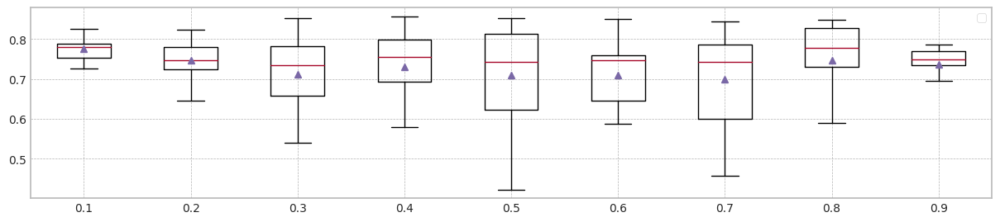

In [ ]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()

In [ ]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=alpha,trial_count=20,weight_init=False,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 20
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.09it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.89it/s]


Test f1 score: 0.8786241869694632
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.013728
x1    0.016781
x2    0.025423
x3    0.045717
z0    0.089140
dtype: float64
Mean F1 for all data: 0.8276572903733274
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8276572903733274
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.47it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.42it/s]


Test f1 score: 0.8786407766990292
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.014082
x1    0.024652
x2    0.026011
x3    0.027211
z0    0.211638
dtype: float64
Mean F1 for all data: 0.795770410238719
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8117138503060232
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.67it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.877442273534636
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.030573
x1    0.017229
x2    0.020280
x3    0.023369
z0    0.142677
dtype: float64
Mean F1 for all data: 0.8249274782079165
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8249274782079165
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.56it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.74it/s]


Test f1 score: 0.8773127753303964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.014720
x1    0.011054
x2    0.036208
x3    0.034588
z0    0.164624
dtype: float64
Mean F1 for all data: 0.8055114479020347
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8152194630549756
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.89it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.73it/s]


Test f1 score: 0.877092511013216
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.015889
x1    0.020140
x2    0.016057
x3    0.022756
z0    0.196896
dtype: float64
Mean F1 for all data: 0.8060217774573708
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8060217774573708
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.86it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.72it/s]


Test f1 score: 0.8774250440917107
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.014591
x1    0.018724
x2    0.089824
x3    0.018882
z0    0.171771
dtype: float64
Mean F1 for all data: 0.8034843374584861
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.8057666126797027
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.41it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.76it/s]


Test f1 score: 0.8769027134348114
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.018384
x1    0.010004
x2    0.010939
x3    0.048695
z0    0.234477
dtype: float64
Mean F1 for all data: 0.7812185347314633
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8055114479020347
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.55it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.07it/s]


Test f1 score: 0.8783813503408842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.012014
x1    0.010889
x2    0.012817
x3    0.020151
z0    0.134380
dtype: float64
Mean F1 for all data: 0.8146634283925512
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8057666126797027
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.84it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.87it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.014000
x1    0.011448
x2    0.014290
x3    0.019308
z0    0.090007
dtype: float64
Mean F1 for all data: 0.8217128559758461
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.8060217774573708
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.00it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.45it/s]


Test f1 score: 0.8790145182578091
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.021789
x1    0.034889
x2    0.017115
x3    0.034376
z0    0.131376
dtype: float64
Mean F1 for all data: 0.8191514972184087
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.810342602924961
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.19it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.89it/s]


Test f1 score: 0.8784676354029063
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.012545
x1    0.018151
x2    0.016885
x3    0.028341
z0    0.110613
dtype: float64
Mean F1 for all data: 0.8176093315508978
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8146634283925512
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.49it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.09it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.016760
x1    0.019774
x2    0.018204
x3    0.028412
z0    0.128466
dtype: float64
Mean F1 for all data: 0.8141836900599897
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8144235592262705
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.97it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.20it/s]


Test f1 score: 0.878626799557032
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.031419
x1    0.018115
x2    0.034491
x3    0.045434
z0    0.180903
dtype: float64
Mean F1 for all data: 0.8229801952863759
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8146634283925512
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.19it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.10it/s]


Test f1 score: 0.8782742681047766
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.013950
x1    0.014000
x2    0.022631
x3    0.050165
z0    0.167921
dtype: float64
Mean F1 for all data: 0.8165318760336975
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8155976522131243
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.70it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.33it/s]


Test f1 score: 0.8793046539773353
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.012763
x1    0.035760
x2    0.080387
x3    0.013950
z0    0.185176
dtype: float64
Mean F1 for all data: 0.8200082226637203
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8165318760336975
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.67it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.02it/s]


Test f1 score: 0.8790918108674088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.020703
x1    0.017405
x2    0.011703
x3    0.046681
z0    0.097631
dtype: float64
Mean F1 for all data: 0.8294144396320599
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8170706037922977
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.40it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.68it/s]


Test f1 score: 0.8765676567656765
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.012226
x1    0.011767
x2    0.024430
x3    0.032172
z0    0.155935
dtype: float64
Mean F1 for all data: 0.8025669389778727
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8165318760336975
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.34it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.22it/s]


Test f1 score: 0.879287598944591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.012409
x1    0.033025
x2    0.015409
x3    0.019043
z0    0.107362
dtype: float64
Mean F1 for all data: 0.8275919243698611
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8170706037922977
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.39it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.55it/s]


Test f1 score: 0.8771736737838433
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.012452
x1    0.012068
x2    0.012520
x3    0.018054
z0    0.110774
dtype: float64
Mean F1 for all data: 0.8163819413644497
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8165318760336975
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.74it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.98it/s]


Test f1 score: 0.8769520434156607
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.016136
x1    0.016896
x2    0.015986
x3    0.034964
z0    0.222104
dtype: float64
Mean F1 for all data: 0.7783505845125027
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8164569086990736


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.627135
1,1,0.876501,0.874641,0.793018,0.724074,5.609408
2,2,0.876679,0.874336,0.797632,0.732836,5.612578
3,3,0.876869,0.874972,0.802574,0.744999,5.731539
4,4,0.877232,0.874862,0.798525,0.735297,5.734182
5,5,0.878334,0.876258,0.793416,0.724032,5.679661
6,6,0.877652,0.875345,0.803037,0.745630,5.545421
7,7,0.876915,0.874225,0.798902,0.733693,5.740472
8,8,0.877324,0.874917,0.806893,0.746142,5.591073
9,9,0.877232,0.875014,0.798355,0.734180,5.556069


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878624,0.877407,0.827657,0.789314,5.687416
1,1,0.878641,0.876609,0.795770,0.722795,5.656884
2,2,0.877442,0.876142,0.824927,0.787347,5.612080
3,3,0.877313,0.875387,0.805511,0.744099,5.577072
4,4,0.877093,0.875097,0.806022,0.749243,5.648794
5,5,0.877425,0.875277,0.803484,0.740393,5.548909
6,6,0.876903,0.874654,0.781219,0.691321,5.570923
7,7,0.878381,0.877112,0.814663,0.755607,5.652588
8,8,0.877861,0.876988,0.821713,0.775870,5.752935
9,9,0.879015,0.877790,0.819151,0.764774,5.670284


trial_count: 20
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.85it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.33it/s]


Test f1 score: 0.8802731578367662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.012659
x1    0.021344
x2    0.016344
x3    0.036638
z0    0.071538
dtype: float64
Mean F1 for all data: 0.8388037540192813
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8388037540192813
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.43it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.69it/s]


Test f1 score: 0.8787878787878788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.034968
x1    0.033613
x2    0.036036
x3    0.054753
z0    0.118158
dtype: float64
Mean F1 for all data: 0.8358310181910237
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8373173861051525
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.03it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.63it/s]


Test f1 score: 0.8788719884534251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.017297
x1    0.021147
x2    0.021573
x3    0.024229
z0    0.247591
dtype: float64
Mean F1 for all data: 0.830716228300907
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8358310181910237
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.23it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.08it/s]


Test f1 score: 0.8794169611307421
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.014108
x1    0.011409
x2    0.056118
x3    0.059767
z0    0.255061
dtype: float64
Mean F1 for all data: 0.8066734152453817
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8332736232459653
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.22it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.73it/s]


Test f1 score: 0.8780434064118101
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.023731
x1    0.020186
x2    0.036294
x3    0.045986
z0    0.095337
dtype: float64
Mean F1 for all data: 0.8223892822570812
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.830716228300907
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.76it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.30it/s]


Test f1 score: 0.880907788917043
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.020140
x1    0.017330
x2    0.129258
x3    0.027889
z0    0.084047
dtype: float64
Mean F1 for all data: 0.8313803109576402
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.8310482696292736
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.72it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.76it/s]


Test f1 score: 0.8782214356818936
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.015792
x1    0.009466
x2    0.011423
x3    0.125656
z0    0.319065
dtype: float64
Mean F1 for all data: 0.7125406997774838
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.830716228300907
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.67it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.67it/s]


Test f1 score: 0.8802910052910053
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.012667
x1    0.012771
x2    0.012867
x3    0.022176
z0    0.257473
dtype: float64
Mean F1 for all data: 0.8297262063477562
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8302212173243315
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.00it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.16it/s]


Test f1 score: 0.880361671628625
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.017369
x1    0.014613
x2    0.015667
x3    0.021416
z0    0.180527
dtype: float64
Mean F1 for all data: 0.8401801323248239
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.830716228300907
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.27it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.06it/s]


Test f1 score: 0.8799470841142101
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.056384
x1    0.056882
x2    0.039538
x3    0.048211
z0    0.080272
dtype: float64
Mean F1 for all data: 0.8334927617558843
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8310482696292736
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.67it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.66it/s]


Test f1 score: 0.8783664459161148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.015498
x1    0.026470
x2    0.025405
x3    0.054362
z0    0.111204
dtype: float64
Mean F1 for all data: 0.821402409167032
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.830716228300907
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.30it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.69it/s]


Test f1 score: 0.8788179512625427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.016556
x1    0.018760
x2    0.029975
x3    0.060781
z0    0.258832
dtype: float64
Mean F1 for all data: 0.8135824433023814
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8302212173243315
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.80it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.12it/s]


Test f1 score: 0.8787443351387202
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.042566
x1    0.022480
x2    0.059204
x3    0.044670
z0    0.136921
dtype: float64
Mean F1 for all data: 0.8284093951003767
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8297262063477562
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.20it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.63it/s]


Test f1 score: 0.8805986574226918
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.026280
x1    0.013283
x2    0.118953
x3    0.062792
z0    0.097312
dtype: float64
Mean F1 for all data: 0.8135549210891541
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8290678007240664
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.47it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.82it/s]


Test f1 score: 0.8808735936465917
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.013276
x1    0.058376
x2    0.185269
x3    0.035659
z0    0.175204
dtype: float64
Mean F1 for all data: 0.830698052219457
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8297262063477562
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.59it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.65it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.20it/s]


Test f1 score: 0.8797182788599098
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.014054
x1    0.016448
x2    0.020548
x3    0.067663
z0    0.166681
dtype: float64
Mean F1 for all data: 0.8366669587040739
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8302121292836067
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.99it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.71it/s]


Test f1 score: 0.8785974197816738
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.017143
x1    0.023484
x2    0.030337
x3    0.050785
z0    0.135423
dtype: float64
Mean F1 for all data: 0.8089469446832094
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8297262063477562
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.37it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.89it/s]


Test f1 score: 0.8802375453645662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.013000
x1    0.038208
x2    0.019491
x3    0.022502
z0    0.221369
dtype: float64
Mean F1 for all data: 0.8323815709389553
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8302121292836067
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.88it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.38it/s]


Test f1 score: 0.8789049563969533
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.016380
x1    0.016699
x2    0.015728
x3    0.019007
z0    0.093688
dtype: float64
Mean F1 for all data: 0.8399744039345505
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.830698052219457
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.64it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.64it/s]


Test f1 score: 0.8788988788988789
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.016645
x1    0.073602
x2    0.018946
x3    0.036423
z0    0.285240
dtype: float64
Mean F1 for all data: 0.7653018990096733
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8302121292836067


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.669491
1,1,0.876501,0.874641,0.793018,0.724074,5.694370
2,2,0.876679,0.874336,0.797632,0.732836,5.599133
3,3,0.876869,0.874972,0.802574,0.744999,5.558813
4,4,0.877232,0.874862,0.798525,0.735297,5.550522
5,5,0.878334,0.876258,0.793416,0.724032,5.547091
6,6,0.877652,0.875345,0.803037,0.745630,5.563323
7,7,0.876915,0.874225,0.798902,0.733693,5.615971
8,8,0.877324,0.874917,0.806893,0.746142,5.563867
9,9,0.877232,0.875014,0.798355,0.734180,5.691821


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880273,0.879699,0.838804,0.808704,5.665448
1,1,0.878788,0.877193,0.835831,0.808703,5.696278
2,2,0.878872,0.877690,0.830716,0.785408,5.632773
3,3,0.879417,0.877913,0.806673,0.722960,5.694619
4,4,0.878043,0.876176,0.822389,0.773704,5.627645
5,5,0.880908,0.880018,0.831380,0.783894,5.662390
6,6,0.878221,0.875821,0.712541,0.514099,5.641525
7,7,0.880291,0.879469,0.829726,0.783038,5.607555
8,8,0.880362,0.879814,0.840180,0.814260,5.608680
9,9,0.879947,0.878405,0.833493,0.801157,5.655051


trial_count: 20
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.93it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.71it/s]


Test f1 score: 0.8800705467372134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.013477
x1    0.009638
x2    0.016595
x3    0.059645
z0    0.186427
dtype: float64
Mean F1 for all data: 0.847137029654781
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.847137029654781
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.54it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.99it/s]


Test f1 score: 0.8805114638447972
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.197520
x1    0.025043
x2    0.057867
x3    0.023505
z0    0.283351
dtype: float64
Mean F1 for all data: 0.8263955445902273
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8367662871225041
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.95it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.15it/s]


Test f1 score: 0.8793869391381608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.018832
x1    0.026491
x2    0.024706
x3    0.024194
z0    0.323588
dtype: float64
Mean F1 for all data: 0.8142705547622533
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8263955445902273
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.38it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.95it/s]


Test f1 score: 0.8816848605138383
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.015581
x1    0.023434
x2    0.067419
x3    0.098749
z0    0.269412
dtype: float64
Mean F1 for all data: 0.8268491207215078
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8266223326558676
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.24it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.29it/s]


Test f1 score: 0.8800619606107546
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.014659
x1    0.025254
x2    0.012878
x3    0.022229
z0    0.350681
dtype: float64
Mean F1 for all data: 0.7873862965785262
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8263955445902273
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.63it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.05it/s]


Test f1 score: 0.8805212014134275
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.025082
x1    0.014294
x2    0.172176
x3    0.033043
z0    0.255656
dtype: float64
Mean F1 for all data: 0.8147790821474898
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.8205873133688586
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.74it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.80it/s]


Test f1 score: 0.8813223140495868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.017953
x1    0.012061
x2    0.022029
x3    0.069548
z0    0.456961
dtype: float64
Mean F1 for all data: 0.7660340933738717
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8147790821474898
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.45it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.22it/s]


Test f1 score: 0.8798672566371682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.013717
x1    0.011667
x2    0.014061
x3    0.034065
z0    0.308688
dtype: float64
Mean F1 for all data: 0.8342505383192993
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8205873133688586
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.81it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.49it/s]


Test f1 score: 0.880406001765225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.017738
x1    0.016513
x2    0.050165
x3    0.025950
z0    0.245154
dtype: float64
Mean F1 for all data: 0.8434234480380024
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.8263955445902273
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.55it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.36it/s]


Test f1 score: 0.8816353445433563
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.060670
x1    0.061172
x2    0.050638
x3    0.059287
z0    0.155978
dtype: float64
Mean F1 for all data: 0.8428936339377522
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8266223326558676
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.74it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.89it/s]


Test f1 score: 0.88059043842256
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.023351
x1    0.017290
x2    0.037427
x3    0.071462
z0    0.238566
dtype: float64
Mean F1 for all data: 0.8374207249665627
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8268491207215078
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 692.80it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.68it/s]


Test f1 score: 0.8796378091872791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.016556
x1    0.022681
x2    0.016638
x3    0.065961
z0    0.323763
dtype: float64
Mean F1 for all data: 0.8243984554301522
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8266223326558676
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 689.13it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.92it/s]


Test f1 score: 0.8793103448275863
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.046247
x1    0.061097
x2    0.033545
x3    0.065570
z0    0.259409
dtype: float64
Mean F1 for all data: 0.8426206442005834
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8268491207215078
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.32it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.99it/s]


Test f1 score: 0.8815717264844695
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.021513
x1    0.015631
x2    0.044140
x3    0.035333
z0    0.422194
dtype: float64
Mean F1 for all data: 0.7185884729098728
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8266223326558676
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.53it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.38it/s]


Test f1 score: 0.8805723720418273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.026731
x1    0.070416
x2    0.227713
x3    0.060258
z0    0.207290
dtype: float64
Mean F1 for all data: 0.8324098913168307
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8268491207215078
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 684.84it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.30it/s]


Test f1 score: 0.8796753317977405
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.016935
x1    0.035358
x2    0.013491
x3    0.063380
z0    0.190444
dtype: float64
Mean F1 for all data: 0.8456727530887512
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8296295060191693
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.75it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.71it/s]


Test f1 score: 0.8797796143250688
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.013656
x1    0.014996
x2    0.032219
x3    0.050591
z0    0.243570
dtype: float64
Mean F1 for all data: 0.8037020322278753
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8268491207215078
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.15it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.42it/s]


Test f1 score: 0.8799294998898435
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.012437
x1    0.038566
x2    0.022183
x3    0.023652
z0    0.243470
dtype: float64
Mean F1 for all data: 0.8358659557789089
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8296295060191693
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.30it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.51it/s]


Test f1 score: 0.8802296059167678
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.052229
x1    0.020785
x2    0.024136
x3    0.025538
z0    0.365308
dtype: float64
Mean F1 for all data: 0.8198279500418165
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8268491207215078
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.32it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.41it/s]


Test f1 score: 0.8782483689041247
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.070864
x1    0.132201
x2    0.015703
x3    0.023978
z0    0.345480
dtype: float64
Mean F1 for all data: 0.7890915440355973
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8266223326558676


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.598708
1,1,0.876501,0.874641,0.793018,0.724074,5.565099
2,2,0.876679,0.874336,0.797632,0.732836,5.673416
3,3,0.876869,0.874972,0.802574,0.744999,5.738177
4,4,0.877232,0.874862,0.798525,0.735297,5.684607
5,5,0.878334,0.876258,0.793416,0.724032,5.573779
6,6,0.877652,0.875345,0.803037,0.745630,5.531988
7,7,0.876915,0.874225,0.798902,0.733693,5.543859
8,8,0.877324,0.874917,0.806893,0.746142,5.723990
9,9,0.877232,0.875014,0.798355,0.734180,5.557798


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880071,0.879522,0.847137,0.832077,5.632561
1,1,0.880511,0.880576,0.826396,0.752896,5.660076
2,2,0.879387,0.879099,0.814271,0.731163,5.606500
3,3,0.881685,0.880647,0.826849,0.767448,5.698408
4,4,0.880062,0.878092,0.787386,0.692769,5.575841
5,5,0.880521,0.880044,0.814779,0.719044,5.659801
6,6,0.881322,0.880301,0.766034,0.568440,5.612691
7,7,0.879867,0.879831,0.834251,0.789486,5.645666
8,8,0.880406,0.880549,0.843423,0.811594,5.611058
9,9,0.881635,0.880503,0.842894,0.819214,5.531661


trial_count: 20
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.98it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.42it/s]


Test f1 score: 0.878747795414462
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.015416
x1    0.023007
x2    0.380731
x3    0.091932
z0    0.170910
dtype: float64
Mean F1 for all data: 0.8451181225194104
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8451181225194104
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.57it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.31it/s]


Test f1 score: 0.8808998676665196
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.252487
x1    0.031760
x2    0.100097
x3    0.018240
z0    0.365925
dtype: float64
Mean F1 for all data: 0.8144852121276014
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8298016673235059
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.59it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.39it/s]


Test f1 score: 0.8790671848972792
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.021914
x1    0.026434
x2    0.029140
x3    0.052591
z0    0.382817
dtype: float64
Mean F1 for all data: 0.7963006384160956
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8144852121276014
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.18it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.24it/s]


Test f1 score: 0.8816802287222344
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.019961
x1    0.022380
x2    0.066620
x3    0.117864
z0    0.255319
dtype: float64
Mean F1 for all data: 0.8204492224048239
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8174672172662126
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 687.78it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.37it/s]


Test f1 score: 0.8802560423794282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.017215
x1    0.027197
x2    0.019398
x3    0.020699
z0    0.367896
dtype: float64
Mean F1 for all data: 0.7555923097672776
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8144852121276014
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.81it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.06it/s]


Test f1 score: 0.8803191489361702
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.030348
x1    0.018136
x2    0.036495
x3    0.017498
z0    0.425405
dtype: float64
Mean F1 for all data: 0.7748825801139814
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.8053929252718485
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.34it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.69it/s]


Test f1 score: 0.880768381541179
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.019996
x1    0.011971
x2    0.084258
x3    0.140025
z0    0.491717
dtype: float64
Mean F1 for all data: 0.8119527265721194
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8119527265721194
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.13it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.49it/s]


Test f1 score: 0.8800972483147308
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.016290
x1    0.019168
x2    0.013168
x3    0.029986
z0    0.318860
dtype: float64
Mean F1 for all data: 0.8310387445491704
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8132189693498604
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.79it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.30it/s]


Test f1 score: 0.8797266012567523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.016903
x1    0.018409
x2    0.078398
x3    0.030688
z0    0.220477
dtype: float64
Mean F1 for all data: 0.8458193586928723
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.8144852121276014
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.33it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.04it/s]


Test f1 score: 0.8807400066072019
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.085305
x1    0.038265
x2    0.062939
x3    0.094502
z0    0.263283
dtype: float64
Mean F1 for all data: 0.8404569016369825
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8174672172662126
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 684.38it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.44it/s]


Test f1 score: 0.8803711476858501
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.029405
x1    0.031000
x2    0.043244
x3    0.106222
z0    0.293964
dtype: float64
Mean F1 for all data: 0.8214505920229779
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8204492224048239
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.64it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.8820884062739937
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.400229
x1    0.015297
x2    0.051968
x3    0.083867
z0    0.209821
dtype: float64
Mean F1 for all data: 0.831557475586195
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8209499072139008
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.90it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.99it/s]


Test f1 score: 0.8802746705061468
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.062441
x1    0.067104
x2    0.055004
x3    0.057423
z0    0.245563
dtype: float64
Mean F1 for all data: 0.8502929243097354
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8214505920229779
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.52it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.84it/s]


Test f1 score: 0.8806430301695661
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.023147
x1    0.013434
x2    0.109337
x3    0.038581
z0    0.436079
dtype: float64
Mean F1 for all data: 0.6844886049007964
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8209499072139008
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.29it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.61it/s]


Test f1 score: 0.8801143862736472
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.072613
x1    0.015534
x2    0.218853
x3    0.082032
z0    0.228763
dtype: float64
Mean F1 for all data: 0.8085491065102366
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8204492224048239
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.43it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.25it/s]


Test f1 score: 0.8810388467040827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.014176
x1    0.041455
x2    0.015588
x3    0.034151
z0    0.248978
dtype: float64
Mean F1 for all data: 0.8508335539840061
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8209499072139008
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.29it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.85it/s]


Test f1 score: 0.8803003533568905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.033470
x1    0.039563
x2    0.017100
x3    0.034943
z0    0.361860
dtype: float64
Mean F1 for all data: 0.7966030682323032
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8204492224048239
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.95it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.74it/s]


Test f1 score: 0.880403774412991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.013057
x1    0.023778
x2    0.020509
x3    0.028989
z0    0.293366
dtype: float64
Mean F1 for all data: 0.8348459930906952
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8209499072139008
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.99it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.26it/s]


Test f1 score: 0.8808552849112753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.023161
x1    0.028910
x2    0.020366
x3    0.037839
z0    0.285828
dtype: float64
Mean F1 for all data: 0.8165942497973262
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8204492224048239
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.09it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.95it/s]


Test f1 score: 0.8783139212423737
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.073100
x1    0.098914
x2    0.030978
x3    0.018444
z0    0.416867
dtype: float64
Mean F1 for all data: 0.78032630954738
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.818521736101075


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.571962
1,1,0.876501,0.874641,0.793018,0.724074,5.628572
2,2,0.876679,0.874336,0.797632,0.732836,5.607729
3,3,0.876869,0.874972,0.802574,0.744999,5.625648
4,4,0.877232,0.874862,0.798525,0.735297,5.608783
5,5,0.878334,0.876258,0.793416,0.724032,5.522136
6,6,0.877652,0.875345,0.803037,0.745630,5.561953
7,7,0.876915,0.874225,0.798902,0.733693,5.561169
8,8,0.877324,0.874917,0.806893,0.746142,5.624889
9,9,0.877232,0.875014,0.798355,0.734180,5.583736


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878748,0.877779,0.845118,0.826310,5.669208
1,1,0.880900,0.880868,0.814485,0.711304,5.603896
2,2,0.879067,0.878751,0.796301,0.676131,5.623380
3,3,0.881680,0.880566,0.820449,0.741994,5.595633
4,4,0.880256,0.879230,0.755592,0.619770,5.554290
5,5,0.880319,0.880454,0.774883,0.611414,5.604878
6,6,0.880768,0.880284,0.811953,0.749968,5.572854
7,7,0.880097,0.880036,0.831039,0.791392,5.603100
8,8,0.879727,0.879602,0.845819,0.817136,5.632663
9,9,0.880740,0.879575,0.840457,0.811437,5.568944


trial_count: 20
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.18it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.14it/s]


Test f1 score: 0.8795339635084635
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.015774
x1    0.022018
x2    0.375570
x3    0.119796
z0    0.230484
dtype: float64
Mean F1 for all data: 0.8532192239434135
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8532192239434135
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.68it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.34it/s]


Test f1 score: 0.8815499779832673
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.027011
x1    0.053143
x2    0.097305
x3    0.027566
z0    0.423480
dtype: float64
Mean F1 for all data: 0.8338080100062277
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8435136169748206
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.36it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.94it/s]


Test f1 score: 0.8801502264442725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.020229
x1    0.027767
x2    0.030276
x3    0.053111
z0    0.349835
dtype: float64
Mean F1 for all data: 0.7960316413446835
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8338080100062277
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.37it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.04it/s]


Test f1 score: 0.8810260946483855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.020143
x1    0.012688
x2    0.101763
x3    0.113624
z0    0.258168
dtype: float64
Mean F1 for all data: 0.7755050065163228
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8149198256754556
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.37it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.65it/s]


Test f1 score: 0.8789893617021277
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.029355
x1    0.032319
x2    0.017563
x3    0.031416
z0    0.329176
dtype: float64
Mean F1 for all data: 0.769074638795478
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7960316413446835
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.97it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.37it/s]


Test f1 score: 0.8810941981028017
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.025391
x1    0.035939
x2    0.174842
x3    0.016677
z0    0.370889
dtype: float64
Mean F1 for all data: 0.7141556658094079
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.7857683239305031
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.19it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.68it/s]


Test f1 score: 0.8799382034870888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.028982
x1    0.015398
x2    0.065563
x3    0.164720
z0    0.468935
dtype: float64
Mean F1 for all data: 0.8309382691757675
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7960316413446835
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.69it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.30it/s]


Test f1 score: 0.879308434001995
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.024104
x1    0.017534
x2    0.015810
x3    0.035932
z0    0.267143
dtype: float64
Mean F1 for all data: 0.8442166198568187
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8134849552602255
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.73it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.94it/s]


Test f1 score: 0.8801684957321806
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.016211
x1    0.027373
x2    0.055627
x3    0.365656
z0    0.296022
dtype: float64
Mean F1 for all data: 0.8343419745226365
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.8309382691757675
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.02it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.12it/s]


Test f1 score: 0.8805806025951176
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.394491
x1    0.027731
x2    0.182570
x3    0.054935
z0    0.243749
dtype: float64
Mean F1 for all data: 0.8095166865313727
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8202274778535701
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.05it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.22it/s]


Test f1 score: 0.8806331061771817
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.014068
x1    0.026240
x2    0.073685
x3    0.024814
z0    0.362391
dtype: float64
Mean F1 for all data: 0.8362925449982629
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8309382691757675
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.63it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.75it/s]


Test f1 score: 0.880750137892995
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.367097
x1    0.016061
x2    0.060251
x3    0.126681
z0    0.214197
dtype: float64
Mean F1 for all data: 0.8451550063110537
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8323731395909977
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.80it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.25it/s]


Test f1 score: 0.8801150188011502
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.060344
x1    0.095269
x2    0.086437
x3    0.076176
z0    0.312208
dtype: float64
Mean F1 for all data: 0.8521216619437885
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8338080100062277
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 686.48it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.87it/s]


Test f1 score: 0.8810282324508405
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.038269
x1    0.020609
x2    0.131068
x3    0.033097
z0    0.427215
dtype: float64
Mean F1 for all data: 0.6915155279853609
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.8323731395909977
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.87it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.59it/s]


Test f1 score: 0.8791983261755314
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.043670
x1    0.072043
x2    0.216197
x3    0.020932
z0    0.319362
dtype: float64
Mean F1 for all data: 0.8069917438061599
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8309382691757675
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.24it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.23it/s]


Test f1 score: 0.8812664907651715
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.013717
x1    0.038233
x2    0.013645
x3    0.058581
z0    0.233036
dtype: float64
Mean F1 for all data: 0.8513106507448917
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8323731395909977
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.10it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.84it/s]


Test f1 score: 0.8816593886462883
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.027588
x1    0.058487
x2    0.014219
x3    0.034541
z0    0.394513
dtype: float64
Mean F1 for all data: 0.7677174256906055
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8309382691757675
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.70it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.80it/s]


Test f1 score: 0.8808449774452636
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.013444
x1    0.049348
x2    0.023498
x3    0.034330
z0    0.270186
dtype: float64
Mean F1 for all data: 0.8276639675637378
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8293011183697527
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.03it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.87it/s]


Test f1 score: 0.8806184428492545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.024720
x1    0.024509
x2    0.047151
x3    0.041523
z0    0.240943
dtype: float64
Mean F1 for all data: 0.7880403365887253
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8276639675637378
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.12it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.53it/s]


Test f1 score: 0.8795033809998892
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.028344
x1    0.115409
x2    0.033434
x3    0.023810
z0    0.500480
dtype: float64
Mean F1 for all data: 0.7698260017452283
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8185903270475552


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.551590
1,1,0.876501,0.874641,0.793018,0.724074,5.616458
2,2,0.876679,0.874336,0.797632,0.732836,5.669436
3,3,0.876869,0.874972,0.802574,0.744999,5.616601
4,4,0.877232,0.874862,0.798525,0.735297,5.601076
5,5,0.878334,0.876258,0.793416,0.724032,5.587302
6,6,0.877652,0.875345,0.803037,0.745630,5.579780
7,7,0.876915,0.874225,0.798902,0.733693,5.536259
8,8,0.877324,0.874917,0.806893,0.746142,5.556499
9,9,0.877232,0.875014,0.798355,0.734180,5.536991


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879534,0.878905,0.853219,0.846563,5.643929
1,1,0.881550,0.881273,0.833808,0.784065,5.651641
2,2,0.880150,0.880115,0.796032,0.673509,5.625809
3,3,0.881026,0.880027,0.775505,0.615835,5.626050
4,4,0.878989,0.877762,0.769075,0.652871,5.570093
5,5,0.881094,0.879549,0.714156,0.426895,5.640526
6,6,0.879938,0.879459,0.830938,0.793465,5.787141
7,7,0.879308,0.878933,0.844217,0.818151,5.572865
8,8,0.880168,0.879511,0.834342,0.784439,5.607236
9,9,0.880581,0.879567,0.809517,0.699722,5.572906


trial_count: 20
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.56it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.31it/s]


Test f1 score: 0.8807844865579549
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.021523
x1    0.011950
x2    0.352810
x3    0.141860
z0    0.281695
dtype: float64
Mean F1 for all data: 0.8542288964857999
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8542288964857999
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.71it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.51it/s]


Test f1 score: 0.8811235209554351
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.023613
x1    0.060792
x2    0.119566
x3    0.028233
z0    0.405373
dtype: float64
Mean F1 for all data: 0.8317835052837621
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.843006200884781
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.72it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.14it/s]


Test f1 score: 0.880717687451545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.022746
x1    0.026749
x2    0.018391
x3    0.044036
z0    0.348057
dtype: float64
Mean F1 for all data: 0.7818838657604262
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8317835052837621
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.70it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.22it/s]


Test f1 score: 0.8808552849112753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.017190
x1    0.037265
x2    0.109620
x3    0.094935
z0    0.222387
dtype: float64
Mean F1 for all data: 0.7761152732916723
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8068336855220941
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.09it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.82it/s]


Test f1 score: 0.8805280528052806
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.024792
x1    0.039047
x2    0.026434
x3    0.023412
z0    0.360552
dtype: float64
Mean F1 for all data: 0.7596758109054192
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7818838657604262
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.07it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.67it/s]


Test f1 score: 0.8809864582186502
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.027595
x1    0.018054
x2    0.063724
x3    0.036785
z0    0.313369
dtype: float64
Mean F1 for all data: 0.7740827671962737
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.7789995695260492
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.22it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.75it/s]


Test f1 score: 0.8804407713498624
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.038502
x1    0.013090
x2    0.032201
x3    0.177677
z0    0.472190
dtype: float64
Mean F1 for all data: 0.7474285012933227
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7761152732916723
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.28it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.70it/s]


Test f1 score: 0.8816093217544246
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.021093
x1    0.021204
x2    0.079914
x3    0.044538
z0    0.257645
dtype: float64
Mean F1 for all data: 0.8449210933302483
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7789995695260492
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.85it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.12it/s]


Test f1 score: 0.880697494757753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.014351
x1    0.028229
x2    0.047509
x3    0.353140
z0    0.287240
dtype: float64
Mean F1 for all data: 0.8157630779408162
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.7818838657604262
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.23it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.38it/s]


Test f1 score: 0.8811913954771098
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.363265
x1    0.037394
x2    0.178814
x3    0.051444
z0    0.405344
dtype: float64
Mean F1 for all data: 0.6065030961318444
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7789995695260492
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.54it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.88it/s]


Test f1 score: 0.8805100582609653
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.014903
x1    0.029100
x2    0.045918
x3    0.027871
z0    0.368631
dtype: float64
Mean F1 for all data: 0.8287222063712711
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7818838657604262
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.52it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.99it/s]


Test f1 score: 0.8797524314765695
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.381541
x1    0.024910
x2    0.081341
x3    0.149573
z0    0.233591
dtype: float64
Mean F1 for all data: 0.8018367866478265
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7918603262041264
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.95it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.48it/s]


Test f1 score: 0.8797419067749471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.063269
x1    0.042778
x2    0.090731
x3    0.258104
z0    0.422427
dtype: float64
Mean F1 for all data: 0.8393403941577667
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8018367866478265
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.15it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.14it/s]


Test f1 score: 0.8808085246621992
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.049921
x1    0.019914
x2    0.160294
x3    0.067194
z0    0.380154
dtype: float64
Mean F1 for all data: 0.6223524250742247
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7918603262041264
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.49it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 260.57it/s]


Test f1 score: 0.8800616197183098
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.433670
x1    0.020398
x2    0.297269
x3    0.049043
z0    0.382333
dtype: float64
Mean F1 for all data: 0.8195908159307359
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8018367866478265
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.36it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.65it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.84it/s]


Test f1 score: 0.8810989010989011
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.015466
x1    0.043287
x2    0.074158
x3    0.220022
z0    0.314505
dtype: float64
Mean F1 for all data: 0.8348426492403637
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.8087999322943213
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.20it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.61it/s]


Test f1 score: 0.8807137349928406
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.028720
x1    0.114448
x2    0.017731
x3    0.032366
z0    0.386817
dtype: float64
Mean F1 for all data: 0.777098084552029
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8018367866478265
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.33it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.06it/s]


Test f1 score: 0.8817820908689898
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.015767
x1    0.062993
x2    0.022065
x3    0.047297
z0    0.267405
dtype: float64
Mean F1 for all data: 0.821190510749138
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.8087999322943213
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.07it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.66it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.99it/s]


Test f1 score: 0.8817489234845975
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.426796
x1    0.042814
x2    0.090480
x3    0.034480
z0    0.368251
dtype: float64
Mean F1 for all data: 0.7582101865652783
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8018367866478265
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.71it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.30it/s]


Test f1 score: 0.8783948564460703
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.074222
x1    0.270093
x2    0.054265
x3    0.149416
z0    0.244297
dtype: float64
Mean F1 for all data: 0.7802099376622528
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7918603262041264


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.813523
1,1,0.876501,0.874641,0.793018,0.724074,5.634133
2,2,0.876679,0.874336,0.797632,0.732836,5.555211
3,3,0.876869,0.874972,0.802574,0.744999,5.647831
4,4,0.877232,0.874862,0.798525,0.735297,5.550472
5,5,0.878334,0.876258,0.793416,0.724032,5.500645
6,6,0.877652,0.875345,0.803037,0.745630,5.575125
7,7,0.876915,0.874225,0.798902,0.733693,5.527354
8,8,0.877324,0.874917,0.806893,0.746142,5.563359
9,9,0.877232,0.875014,0.798355,0.734180,5.635184


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880784,0.880336,0.854229,0.844776,5.686785
1,1,0.881124,0.880479,0.831784,0.783302,5.606662
2,2,0.880718,0.879590,0.781884,0.653415,5.581574
3,3,0.880855,0.879345,0.776115,0.639888,5.591810
4,4,0.880528,0.879417,0.759676,0.616088,5.732226
5,5,0.880986,0.880282,0.774083,0.661771,5.566530
6,6,0.880441,0.878751,0.747429,0.589329,5.619530
7,7,0.881609,0.880627,0.844921,0.823995,5.599900
8,8,0.880697,0.880142,0.815763,0.734053,5.558118
9,9,0.881191,0.879245,0.606503,0.241926,5.598317


trial_count: 20
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.72it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.39it/s]


Test f1 score: 0.8798500881834217
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.018491
x1    0.028595
x2    0.334760
x3    0.185022
z0    0.316391
dtype: float64
Mean F1 for all data: 0.8346105097568925
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8346105097568925
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.38it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.96it/s]


Test f1 score: 0.8811619718309859
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.044717
x1    0.070004
x2    0.123333
x3    0.033362
z0    0.350541
dtype: float64
Mean F1 for all data: 0.8363355556642532
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8354730327105728
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.66it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.45it/s]


Test f1 score: 0.8808943989373477
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.343789
x1    0.064971
x2    0.088857
x3    0.050247
z0    0.357724
dtype: float64
Mean F1 for all data: 0.8010764465563104
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8346105097568925
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.76it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.95it/s]


Test f1 score: 0.8799294998898435
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.036642
x1    0.336570
x2    0.112903
x3    0.034957
z0    0.323624
dtype: float64
Mean F1 for all data: 0.7941480522846461
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.8178434781566015
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.59it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.10it/s]


Test f1 score: 0.8825271470878578
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.051054
x1    0.075900
x2    0.025007
x3    0.026014
z0    0.334183
dtype: float64
Mean F1 for all data: 0.7563838585430261
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8010764465563104
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.34it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.17it/s]


Test f1 score: 0.8803447132913489
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.044054
x1    0.047427
x2    0.212190
x3    0.049728
z0    0.291333
dtype: float64
Mean F1 for all data: 0.6913877929724822
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.7976122494204783
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.59it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.85it/s]


Test f1 score: 0.8795406867616208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.078233
x1    0.038875
x2    0.347280
x3    0.040731
z0    0.517039
dtype: float64
Mean F1 for all data: 0.6213867970992794
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7941480522846461
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.99it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.39it/s]


Test f1 score: 0.8798505001648894
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.044434
x1    0.035462
x2    0.091287
x3    0.086502
z0    0.266735
dtype: float64
Mean F1 for all data: 0.846653099343241
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7976122494204783
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.40it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.74it/s]


Test f1 score: 0.8800176444640494
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.014097
x1    0.027950
x2    0.072885
x3    0.326742
z0    0.209050
dtype: float64
Mean F1 for all data: 0.7925489894262945
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.7941480522846461
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.26it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.43it/s]


Test f1 score: 0.8808656287954068
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.362014
x1    0.154158
x2    0.170251
x3    0.068627
z0    0.266108
dtype: float64
Mean F1 for all data: 0.7919057937908589
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7933485208554703
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.47it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.33it/s]


Test f1 score: 0.8800795053003534
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.065566
x1    0.045681
x2    0.056556
x3    0.228183
z0    0.318814
dtype: float64
Mean F1 for all data: 0.8248468035411741
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7941480522846461
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.88it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.76it/s]


Test f1 score: 0.8804600243282097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.378846
x1    0.041538
x2    0.088147
x3    0.147541
z0    0.236627
dtype: float64
Mean F1 for all data: 0.8310815537817207
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7976122494204783
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.24it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.27it/s]


Test f1 score: 0.8799033073288649
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.042613
x1    0.047853
x2    0.062771
x3    0.050545
z0    0.257014
dtype: float64
Mean F1 for all data: 0.8401297261557537
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8010764465563104
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.30it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.61it/s]


Test f1 score: 0.8800265134776845
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.066713
x1    0.027642
x2    0.099803
x3    0.086498
z0    0.266756
dtype: float64
Mean F1 for all data: 0.7664019239565453
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7976122494204783
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.02it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.71it/s]


Test f1 score: 0.8803011848078839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.345244
x1    0.029659
x2    0.075437
x3    0.056799
z0    0.269444
dtype: float64
Mean F1 for all data: 0.7495671011227614
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7941480522846461
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.71it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.21it/s]


Test f1 score: 0.8820739106453392
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.021251
x1    0.033548
x2    0.044724
x3    0.112806
z0    0.289703
dtype: float64
Mean F1 for all data: 0.8273472763488282
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7976122494204783
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.36it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.18it/s]


Test f1 score: 0.88167104111986
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.023799
x1    0.162982
x2    0.023470
x3    0.043900
z0    0.348154
dtype: float64
Mean F1 for all data: 0.7734216007072742
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7941480522846461
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.34it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.26it/s]


Test f1 score: 0.8819298439747705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.015133
x1    0.037262
x2    0.039047
x3    0.086828
z0    0.234348
dtype: float64
Mean F1 for all data: 0.7840740744319842
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.7933485208554703
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.67it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.95it/s]


Test f1 score: 0.8791745256851214
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.404462
x1    0.083634
x2    0.065086
x3    0.040774
z0    0.363068
dtype: float64
Mean F1 for all data: 0.7513861443675444
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7925489894262945
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.62it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.91it/s]


Test f1 score: 0.8783362989323842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.088211
x1    0.236000
x2    0.090262
x3    0.243627
z0    0.381606
dtype: float64
Mean F1 for all data: 0.8347326321096062
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7933485208554703


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.568537
1,1,0.876501,0.874641,0.793018,0.724074,5.674869
2,2,0.876679,0.874336,0.797632,0.732836,5.654397
3,3,0.876869,0.874972,0.802574,0.744999,5.670450
4,4,0.877232,0.874862,0.798525,0.735297,5.576146
5,5,0.878334,0.876258,0.793416,0.724032,5.615231
6,6,0.877652,0.875345,0.803037,0.745630,5.550025
7,7,0.876915,0.874225,0.798902,0.733693,5.552609
8,8,0.877324,0.874917,0.806893,0.746142,5.588963
9,9,0.877232,0.875014,0.798355,0.734180,5.510678


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879850,0.878670,0.834611,0.812553,5.681472
1,1,0.881162,0.880203,0.836336,0.795870,5.618952
2,2,0.880894,0.879253,0.801076,0.722187,5.622277
3,3,0.879929,0.877876,0.794148,0.688745,5.579133
4,4,0.882527,0.880423,0.756384,0.602677,5.553896
5,5,0.880345,0.877735,0.691388,0.472749,5.597023
6,6,0.879541,0.877789,0.621387,0.297645,5.621073
7,7,0.879851,0.879356,0.846653,0.830923,5.663392
8,8,0.880018,0.879310,0.792549,0.688076,5.596530
9,9,0.880866,0.879352,0.791906,0.632010,5.580144


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.35it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.77it/s]


Test f1 score: 0.8790769913467938
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.030043
x1    0.037778
x2    0.318953
x3    0.187738
z0    0.301918
dtype: float64
Mean F1 for all data: 0.8238004205266248
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8238004205266248
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 674.90it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.8805475822477369
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.068373
x1    0.440459
x2    0.063667
x3    0.159351
z0    0.333950
dtype: float64
Mean F1 for all data: 0.8211860167751579
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8224932186508913
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.60it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.8802653399668324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.054280
x1    0.069315
x2    0.168455
x3    0.283670
z0    0.362308
dtype: float64
Mean F1 for all data: 0.8101524229790722
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8211860167751579
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.78it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.92it/s]


Test f1 score: 0.8801498127340824
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.056201
x1    0.311358
x2    0.121409
x3    0.048935
z0    0.380616
dtype: float64
Mean F1 for all data: 0.7940251625512159
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.815669219877115
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.66it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.84it/s]


Test f1 score: 0.8784174260946876
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.056222
x1    0.087384
x2    0.044627
x3    0.091122
z0    0.351907
dtype: float64
Mean F1 for all data: 0.7465001128883816
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.8101524229790722
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 679.84it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.61it/s]


Test f1 score: 0.8804948089242324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.041789
x1    0.058774
x2    0.120118
x3    0.054387
z0    0.376330
dtype: float64
Mean F1 for all data: 0.6635131486150543
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.8020887927651441
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.28it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.36it/s]


Test f1 score: 0.8806102144594297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.021384
x1    0.061624
x2    0.414387
x3    0.050086
z0    0.513462
dtype: float64
Mean F1 for all data: 0.6999376593764425
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7940251625512159
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.18it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.53it/s]


Test f1 score: 0.8813484631486174
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.056319
x1    0.051444
x2    0.056663
x3    0.066043
z0    0.310964
dtype: float64
Mean F1 for all data: 0.7613035280215975
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7776643452864067
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.33it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.66it/s]


Test f1 score: 0.8810417126462149
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.046100
x1    0.047767
x2    0.056659
x3    0.280462
z0    0.181839
dtype: float64
Mean F1 for all data: 0.7803503880301081
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.7803503880301081
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 687.34it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.87it/s]


Test f1 score: 0.8814676480281226
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.319986
x1    0.240978
x2    0.066276
x3    0.067996
z0    0.386122
dtype: float64
Mean F1 for all data: 0.6150735223274479
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7708269580258529
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 680.84it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.17it/s]


Test f1 score: 0.8800887409872434
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.438573
x1    0.047115
x2    0.064226
x3    0.192441
z0    0.423530
dtype: float64
Mean F1 for all data: 0.6498468831357134
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7613035280215975
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.40it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.13it/s]


Test f1 score: 0.879707576428888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.398219
x1    0.038362
x2    0.125219
x3    0.143391
z0    0.281896
dtype: float64
Mean F1 for all data: 0.8223254540320423
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7708269580258529
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.34it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.22it/s]


Test f1 score: 0.880167566971668
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.051265
x1    0.053004
x2    0.079308
x3    0.094978
z0    0.307685
dtype: float64
Mean F1 for all data: 0.8369635984784533
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7803503880301081
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.68it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.07it/s]


Test f1 score: 0.880697494757753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.033297
x1    0.048398
x2    0.052846
x3    0.098803
z0    0.217434
dtype: float64
Mean F1 for all data: 0.7299510442641396
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.7708269580258529
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.81it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.38it/s]


Test f1 score: 0.880123743232792
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.328065
x1    0.048771
x2    0.224835
x3    0.058093
z0    0.241480
dtype: float64
Mean F1 for all data: 0.7586175714171737
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7613035280215975
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.59it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.55it/s]


Test f1 score: 0.8801502264442725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.017075
x1    0.056649
x2    0.071412
x3    0.094419
z0    0.356720
dtype: float64
Mean F1 for all data: 0.7797803127615422
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7705419203915699
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.68it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.21it/s]


Test f1 score: 0.8809707666850524
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.020713
x1    0.045079
x2    0.036323
x3    0.056337
z0    0.300470
dtype: float64
Mean F1 for all data: 0.784899971237021
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7797803127615422
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.39it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.07it/s]


Test f1 score: 0.8815311846881532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.023624
x1    0.053254
x2    0.048889
x3    0.071674
z0    0.251943
dtype: float64
Mean F1 for all data: 0.773163772002127
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.7764720423818346
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.85it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.32it/s]


Test f1 score: 0.8810553153752355
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.369749
x1    0.047323
x2    0.068251
x3    0.054176
z0    0.329505
dtype: float64
Mean F1 for all data: 0.7290969271581966
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.773163772002127
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 682.92it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.87it/s]


Test f1 score: 0.8787979966611017
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.095251
x1    0.214832
x2    0.053315
x3    0.084903
z0    0.388541
dtype: float64
Mean F1 for all data: 0.826921314931067
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7764720423818346


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.592842
1,1,0.876501,0.874641,0.793018,0.724074,5.605502
2,2,0.876679,0.874336,0.797632,0.732836,5.562629
3,3,0.876869,0.874972,0.802574,0.744999,5.597718
4,4,0.877232,0.874862,0.798525,0.735297,5.544570
5,5,0.878334,0.876258,0.793416,0.724032,5.546971
6,6,0.877652,0.875345,0.803037,0.745630,5.543081
7,7,0.876915,0.874225,0.798902,0.733693,5.578008
8,8,0.877324,0.874917,0.806893,0.746142,5.629694
9,9,0.877232,0.875014,0.798355,0.734180,5.754522


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879077,0.878065,0.823800,0.787756,5.660127
1,1,0.880548,0.878724,0.821186,0.779864,5.582542
2,2,0.880265,0.878287,0.810152,0.750871,5.608705
3,3,0.880150,0.878248,0.794025,0.686994,5.588060
4,4,0.878417,0.877177,0.746500,0.577923,5.569578
5,5,0.880495,0.879104,0.663513,0.418166,5.619090
6,6,0.880610,0.878933,0.699938,0.503067,5.569434
7,7,0.881348,0.880354,0.761304,0.606087,5.589458
8,8,0.881042,0.879920,0.780350,0.663311,5.609434
9,9,0.881468,0.879179,0.615074,0.274326,5.560816


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.39it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.02it/s]


Test f1 score: 0.8809023554130266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.342014
x1    0.121219
x2    0.382039
x3    0.143932
z0    0.437882
dtype: float64
Mean F1 for all data: 0.8388654380336127
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8388654380336127
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 681.25it/s]


Test f1 score: 0.8765010466012999
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930175549315072
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.44it/s]


Test f1 score: 0.8809497636583489
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.064731
x1    0.460986
x2    0.148534
x3    0.086272
z0    0.446620
dtype: float64
Mean F1 for all data: 0.8244809295945443
Normal model median        : 0.7970747554175122
Drift tolerant model median: 0.8316731838140785
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 671.18it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7976317008802954
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.60it/s]


Test f1 score: 0.8791306276336216
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.124057
x1    0.091814
x2    0.134939
x3    0.244588
z0    0.358918
dtype: float64
Mean F1 for all data: 0.752537596191552
Normal model median        : 0.7976317008802954
Drift tolerant model median: 0.8244809295945443
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 678.43it/s]


Test f1 score: 0.8768689533861038
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8025740050525106
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.58it/s]


Test f1 score: 0.8790671848972792
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.321025
x1    0.320219
x2    0.086018
x3    0.086943
z0    0.342358
dtype: float64
Mean F1 for all data: 0.7374597432277622
Normal model median        : 0.7993818283919063
Drift tolerant model median: 0.7885092628930481
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.66it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985250449990616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.41it/s]


Test f1 score: 0.8806085326865837
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.089351
x1    0.108358
x2    0.042348
x3    0.084541
z0    0.327466
dtype: float64
Mean F1 for all data: 0.7931646321357362
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7931646321357362
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.19it/s]


Test f1 score: 0.8783337006832709
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7934162408786776
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.48it/s]


Test f1 score: 0.8795140806184427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.205190
x1    0.261344
x2    0.362756
x3    0.231749
z0    0.555480
dtype: float64
Mean F1 for all data: 0.5493985644821139
Normal model median        : 0.7980783729396785
Drift tolerant model median: 0.772851114163644
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.88it/s]


Test f1 score: 0.8776519731779707
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8030372513883798
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.34it/s]


Test f1 score: 0.8794435857805255
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.052538
x1    0.337595
x2    0.251068
x3    0.088928
z0    0.559516
dtype: float64
Mean F1 for all data: 0.6257860674793183
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.752537596191552
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.14it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989021258039135
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 257.60it/s]


Test f1 score: 0.8807218309859155
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.052674
x1    0.065738
x2    0.076108
x3    0.663835
z0    0.339319
dtype: float64
Mean F1 for all data: 0.7360129841676593
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7449986697096571
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 683.33it/s]


Test f1 score: 0.8773242380899988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8068931230129933
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.07it/s]


Test f1 score: 0.8805003840667178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.325595
x1    0.108305
x2    0.087262
x3    0.263649
z0    0.375416
dtype: float64
Mean F1 for all data: 0.811917503663704
Normal model median        : 0.7989021258039135
Drift tolerant model median: 0.752537596191552
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 673.93it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983548347661159
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.59it/s]


Test f1 score: 0.8802308802308803
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.312176
x1    0.214864
x2    0.159093
x3    0.105280
z0    0.479570
dtype: float64
Mean F1 for all data: 0.47486626164001394
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7449986697096571
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.70it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948528251249853
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.98it/s]


Test f1 score: 0.8800707416823257
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.295516
x1    0.062172
x2    0.297731
x3    0.227935
z0    0.538828
dtype: float64
Mean F1 for all data: 0.8035262949577668
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.752537596191552
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.43it/s]


Test f1 score: 0.8775645268034414
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946694722808425
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.86it/s]


Test f1 score: 0.8811326967402041
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.427057
x1    0.060649
x2    0.187599
x3    0.216982
z0    0.419609
dtype: float64
Mean F1 for all data: 0.7996522220411488
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.772851114163644
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 684.91it/s]


Test f1 score: 0.877389584706658
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7995582713055411
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.19it/s]


Test f1 score: 0.8803986710963456
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.263677
x1    0.272011
x2    0.068968
x3    0.093588
z0    0.293681
dtype: float64
Mean F1 for all data: 0.8328457068357453
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7931646321357362
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.18it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.62it/s]


Test f1 score: 0.8810204530459644
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.050362
x1    0.051749
x2    0.023846
x3    0.059341
z0    0.246599
dtype: float64
Mean F1 for all data: 0.7282472178363676
Normal model median        : 0.7984399398825888
Drift tolerant model median: 0.772851114163644
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 677.75it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7990336473871342
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.84it/s]


Test f1 score: 0.8802653399668324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.304756
x1    0.066910
x2    0.090011
x3    0.114950
z0    0.233993
dtype: float64
Mean F1 for all data: 0.7952407055702232
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7931646321357362
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 672.42it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7997949040261847
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.25it/s]


Test f1 score: 0.8807400066072019
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.105434
x1    0.051090
x2    0.077190
x3    0.130004
z0    0.384168
dtype: float64
Mean F1 for all data: 0.8349721830490551
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7942026688529797
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.82it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937167116857692
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.96it/s]


Test f1 score: 0.8812437975521006
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.030308
x1    0.296484
x2    0.052186
x3    0.046495
z0    0.264018
dtype: float64
Mean F1 for all data: 0.7758262803797847
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7931646321357362
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 675.03it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7984047212629338
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.48it/s]


Test f1 score: 0.8831539644190645
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.045957
x1    0.157817
x2    0.045975
x3    0.078047
z0    0.174871
dtype: float64
Mean F1 for all data: 0.7801393606952397
Normal model median        : 0.7984648831309977
Drift tolerant model median: 0.7866519964154879
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.84it/s]


Test f1 score: 0.8772240026522268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7996727108605377
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.15it/s]


Test f1 score: 0.8811651770936777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.329165
x1    0.286896
x2    0.050025
x3    0.080713
z0    0.284699
dtype: float64
Mean F1 for all data: 0.6807305764677861
Normal model median        : 0.7985250449990616
Drift tolerant model median: 0.7801393606952397
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 676.41it/s]


Test f1 score: 0.8768028184520532
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7989694743080014
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.51it/s]


Test f1 score: 0.880212365888729
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.144699
x1    0.131118
x2    0.089996
x3    0.191348
z0    0.448319
dtype: float64
Mean F1 for all data: 0.7889155525236218
Normal model median        : 0.7987135854014875
Drift tolerant model median: 0.7845274566094307


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877274,0.874931,0.801132,0.741478,5.651350
1,1,0.876501,0.874641,0.793018,0.724074,5.667853
2,2,0.876679,0.874336,0.797632,0.732836,5.666744
3,3,0.876869,0.874972,0.802574,0.744999,5.686611
4,4,0.877232,0.874862,0.798525,0.735297,5.678290
5,5,0.878334,0.876258,0.793416,0.724032,5.616926
6,6,0.877652,0.875345,0.803037,0.745630,5.567296
7,7,0.876915,0.874225,0.798902,0.733693,5.594706
8,8,0.877324,0.874917,0.806893,0.746142,5.533177
9,9,0.877232,0.875014,0.798355,0.734180,5.571016


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880902,0.880124,0.838865,0.831279,5.572363
1,1,0.880950,0.879753,0.824481,0.780598,5.645936
2,2,0.879131,0.877908,0.752538,0.594587,5.653320
3,3,0.879067,0.877581,0.737460,0.575036,5.586896
4,4,0.880609,0.878600,0.793165,0.713771,5.819831
5,5,0.879514,0.877653,0.549399,0.305924,5.625953
6,6,0.879444,0.878401,0.625786,0.317662,5.608837
7,7,0.880722,0.879541,0.736013,0.674626,5.554742
8,8,0.880500,0.879041,0.811918,0.735493,5.615525
9,9,0.880231,0.877377,0.474866,0.046522,5.571528


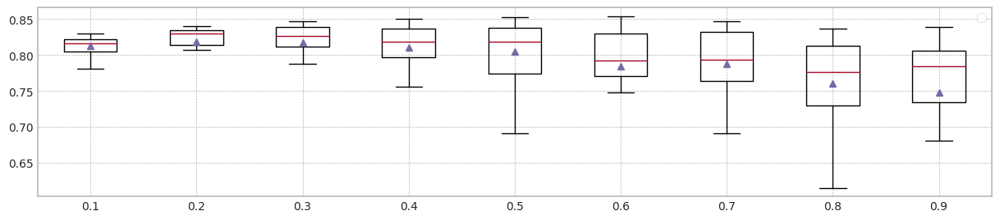

In [ ]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()

trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:09<00:00, 427.77it/s]


Test f1 score: 0.8772742308964605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8011319559035172
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.19it/s]


Test f1 score: 0.8802910052910053
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.333939
x1    0.108211
x2    0.331505
x3    0.233627
z0    0.572301
dtype: float64
Mean F1 for all data: 0.8448128931224981
Normal model median        : 0.8011319559035172
Drift tolerant model median: 0.8448128931224981
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 620.67it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.91it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7946385708307924
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.17it/s]


Test f1 score: 0.8802910052910053
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.096366
x1    0.156104
x2    0.087627
x3    0.100455
z0    0.365925
dtype: float64
Mean F1 for all data: 0.8441202402375252
Normal model median        : 0.7978852633671547
Drift tolerant model median: 0.8444665666800116
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 581.46it/s]


Test f1 score: 0.8774947623773294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.92it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955237873860542
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.07it/s]


Test f1 score: 0.878603777753231
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.767595
x1    0.114645
x2    0.056875
x3    0.204545
z0    0.442118
dtype: float64
Mean F1 for all data: 0.8317170199686731
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8441202402375252
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 627.65it/s]


Test f1 score: 0.8770617989883439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7909336806396657
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 240.36it/s]


Test f1 score: 0.8804600243282097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.041609
x1    0.428982
x2    0.129975
x3    0.135108
z0    0.710398
dtype: float64
Mean F1 for all data: 0.6434096743632028
Normal model median        : 0.7950811791084234
Drift tolerant model median: 0.8379186301030992
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.58it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7988080861868807
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.61it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.95it/s]


mean of drift:
x0    0.031839
x1    0.036301
x2    0.127294
x3    0.074548
z0    0.274140
dtype: float64
Mean F1 for all data: 0.8355709982614694
Normal model median        : 0.7955237873860542
Drift tolerant model median: 0.8355709982614694
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 598.25it/s]


Test f1 score: 0.8776566457438608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.95it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7978655990260356
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.52it/s]


Test f1 score: 0.8781894830264033
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.209498
x1    0.375814
x2    0.340986
x3    0.332606
z0    0.395717
dtype: float64
Mean F1 for all data: 0.7542490403112049
Normal model median        : 0.7966946932060449
Drift tolerant model median: 0.8336440091150712
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 606.96it/s]


Test f1 score: 0.8770654329147389
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.798957201585657
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.36it/s]


Test f1 score: 0.8779095300834432
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.038430
x1    0.070305
x2    0.092832
x3    0.047215
z0    0.226857
dtype: float64
Mean F1 for all data: 0.834411462727759
Normal model median        : 0.7978655990260356
Drift tolerant model median: 0.834411462727759
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.45it/s]


Test f1 score: 0.8780971258671952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001167697928878
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.80it/s]


Test f1 score: 0.8787411971830985
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.120079
x1    0.029197
x2    0.386581
x3    0.086857
z0    0.493645
dtype: float64
Mean F1 for all data: 0.8525686412358147
Normal model median        : 0.7983368426064581
Drift tolerant model median: 0.8349912304946142
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.68it/s]


Test f1 score: 0.8760110803324099
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7983672181293763
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.21it/s]


Test f1 score: 0.8806184428492545
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.479599
x1    0.045090
x2    0.032642
x3    0.044796
z0    0.511233
dtype: float64
Mean F1 for all data: 0.8355757955278887
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8355709982614694
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.25it/s]


Test f1 score: 0.877914650241971
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7993753613877063
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.07it/s]


Test f1 score: 0.8802731578367662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.295419
x1    0.338552
x2    0.207057
x3    0.149774
z0    0.390394
dtype: float64
Mean F1 for all data: 0.8523383026551392
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.835573396894679
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.51it/s]


Test f1 score: 0.8757565753273908
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.17it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918425611677055
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.01it/s]


Test f1 score: 0.8786445153482232
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.353688
x1    0.025125
x2    0.058444
x3    0.116480
z0    0.379810
dtype: float64
Mean F1 for all data: 0.8446431097017039
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.8355757955278887
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.32it/s]


Test f1 score: 0.876984126984127
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7994359088335324
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.8815092674315975
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.078072
x1    0.083222
x2    0.307724
x3    0.076054
z0    0.458659
dtype: float64
Mean F1 for all data: 0.8139705140866219
Normal model median        : 0.7985876521581285
Drift tolerant model median: 0.835573396894679
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.49it/s]


Test f1 score: 0.8781401498457471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7985532596299907
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.04it/s]


Test f1 score: 0.8797615104339186
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.00it/s]


mean of drift:
x0    0.022315
x1    0.035552
x2    0.263319
x3    0.038842
z0    0.512649
dtype: float64
Mean F1 for all data: 0.6230932013677632
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.8355709982614694
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.18it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001387239024096
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.00it/s]


Test f1 score: 0.8803964757709251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.211810
x1    0.071577
x2    0.183867
x3    0.280014
z0    0.513810
dtype: float64
Mean F1 for all data: 0.8134520752683507
Normal model median        : 0.7986806729084357
Drift tolerant model median: 0.8349912304946142
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.55it/s]


Test f1 score: 0.8770808069672582
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7941500124678229
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.91it/s]


Test f1 score: 0.880351262349067
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.205108
x1    0.273695
x2    0.278043
x3    0.294315
z0    0.652857
dtype: float64
Mean F1 for all data: 0.8429894879768193
Normal model median        : 0.7985532596299907
Drift tolerant model median: 0.8355709982614694
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.76it/s]


Test f1 score: 0.8766219485374973
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7981099988745018
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.97it/s]


Test f1 score: 0.8801059836608524
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.17it/s]


mean of drift:
x0    0.018444
x1    0.162670
x2    0.037233
x3    0.075982
z0    0.298502
dtype: float64
Mean F1 for all data: 0.7970976380364254
Normal model median        : 0.7984602388796835
Drift tolerant model median: 0.8349912304946142
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.15it/s]


Test f1 score: 0.8766369538901727
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7921332930601019
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.82it/s]


Test f1 score: 0.8804251550044286
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.147161
x1    0.057505
x2    0.078753
x3    0.275133
z0    0.318717
dtype: float64
Mean F1 for all data: 0.8290003905343406
Normal model median        : 0.7983672181293763
Drift tolerant model median: 0.834411462727759
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.27it/s]


Test f1 score: 0.8776455026455027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7936792593603667
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.76it/s]


Test f1 score: 0.8792665414779631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.267961
x1    0.383581
x2    0.461925
x3    0.422892
z0    0.646771
dtype: float64
Mean F1 for all data: 0.6391825043076068
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8330642413482161
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.03it/s]


Test f1 score: 0.8766791455626515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7916444788632426
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.98it/s]


Test f1 score: 0.8783619258439402
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.179839
x1    0.436172
x2    0.173731
x3    0.184878
z0    0.541824
dtype: float64
Mean F1 for all data: 0.8497861338535297
Normal model median        : 0.7981099988745018
Drift tolerant model median: 0.834411462727759
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.90it/s]


Test f1 score: 0.8766607617360496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7999807883649175
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.70it/s]


Test f1 score: 0.8793122451228921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.124932
x1    0.066735
x2    0.092659
x3    0.066129
z0    0.208516
dtype: float64
Mean F1 for all data: 0.8277300053481543
Normal model median        : 0.7982386085019391
Drift tolerant model median: 0.8330642413482161
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


Early stop at  1993.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8260786510046766
SEA median: 0.8260786510046766
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.95it/s]


Early stop at  1668.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8391707492470255
AUE median: 0.8391707492470255
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.66it/s]


Early stop at  1002.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8440485543302362
DTEL median: 0.8440485543302362
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1135.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8232406794781953
SEA median: 0.824659665241436
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.56it/s]


Early stop at  2318.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8347621648247379
AUE median: 0.8369664570358817
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3298.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8438269074711978
DTEL median: 0.843937730900717
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.39it/s]


Early stop at  2765.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.824987268110807
SEA median: 0.824987268110807
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.44it/s]


Early stop at  953.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8357666900127756
AUE median: 0.8357666900127756
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.70it/s]


Early stop at  818.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8431816216404079
DTEL median: 0.8438269074711978
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1245.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8202410466482923
SEA median: 0.8241139737945011
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.64it/s]


Early stop at  2069.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8330688899393454
AUE median: 0.8352644274187567
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.31it/s]


Early stop at  2089.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8409300720272102
DTEL median: 0.8435042645558029
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1808.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8259847024364488
SEA median: 0.824987268110807
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1889.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8375826399334072
AUE median: 0.8357666900127756
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.41it/s]


Early stop at  1881.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8437622945297024
DTEL median: 0.8437622945297024
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.28it/s]


Early stop at  1117.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8251358935501153
SEA median: 0.8250615808304611
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1784.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8368124911942413
AUE median: 0.8362895906035084
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.59it/s]


Early stop at  932.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8434149464973979
DTEL median: 0.8435886205135501
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


Early stop at  773.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8250151788610034
SEA median: 0.8250151788610034
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8375258449981461
AUE median: 0.8368124911942413
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.46it/s]


Early stop at  1716.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8440571423146961
DTEL median: 0.8437622945297024
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8269158705969774
SEA median: 0.8250755362055593
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.66it/s]


Early stop at  2059.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8391484354840696
AUE median: 0.8371691680961937
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1389.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8435503472610609
DTEL median: 0.8436563208953817
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.92it/s]


Early stop at  1748.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8271791846578019
SEA median: 0.8251358935501153
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.23it/s]


Early stop at  1185.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8377630241403037
AUE median: 0.8375258449981461
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1199.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8436539694073504
DTEL median: 0.8436539694073504
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1578.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8261631491884528
SEA median: 0.8255602979932821
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.43it/s]


Early stop at  918.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8376214273967487
AUE median: 0.8375542424657767
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.23it/s]


Early stop at  2709.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8424421658235858
DTEL median: 0.8436021583342057
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.48it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8203578263711482
SEA median: 0.8251358935501153
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.47it/s]


Early stop at  2311.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8333848507570508
AUE median: 0.8375258449981461
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.35it/s]


Early stop at  2139.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8422577734185545
DTEL median: 0.8435503472610609
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.99it/s]


Early stop at  1517.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8258188353875322
SEA median: 0.8254773644688238
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8383596908684403
AUE median: 0.8375542424657767
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8442317675059836
DTEL median: 0.8436021583342057
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2018.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8248634949101358
SEA median: 0.8251358935501153
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8378163019469091
AUE median: 0.8375826399334072
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.73it/s]


Early stop at  683.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8427566798945757
DTEL median: 0.8435503472610609
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.27it/s]


Early stop at  1153.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8262583072733999
SEA median: 0.8254773644688238
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


Early stop at  785.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8380866563171578
AUE median: 0.837602033665078
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.21it/s]


Early stop at  2722.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8427542262931158
DTEL median: 0.8434826468792294
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.10it/s]


Early stop at  1358.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8218183933233796
SEA median: 0.8251358935501153
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1545.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8334678939670647
AUE median: 0.8375826399334072
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.56it/s]


Early stop at  1421.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8427381800423072
DTEL median: 0.8434149464973979
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1171.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8257758621589262
SEA median: 0.8254558778545207
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8376163968516984
AUE median: 0.8375995183925529
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  3930.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8429112612568938
DTEL median: 0.843298284068903
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1895.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8203879564892717
SEA median: 0.8251358935501153
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  2001.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.832939682616555
AUE median: 0.8375826399334072
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.76it/s]


Early stop at  712.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8421509152691123
DTEL median: 0.8431816216404079
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.36it/s]


Early stop at  1006.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8225773186358328
SEA median: 0.8250755362055593
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.29it/s]


Early stop at  1066.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8356282755245571
AUE median: 0.8375542424657767
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1642.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8427232439440585
DTEL median: 0.8430464414486508
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2414.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8205351095100115
SEA median: 0.8250151788610034
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.07it/s]


Early stop at  3484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.83252581914645
AUE median: 0.8375258449981461
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


Early stop at  894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8425111639202543
DTEL median: 0.8429112612568938
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1512.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8248471601485262
SEA median: 0.8250012234859052
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1826.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8389873158242547
AUE median: 0.8375542424657767
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.68it/s]


Early stop at  936.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8437445737881205
DTEL median: 0.8430464414486508


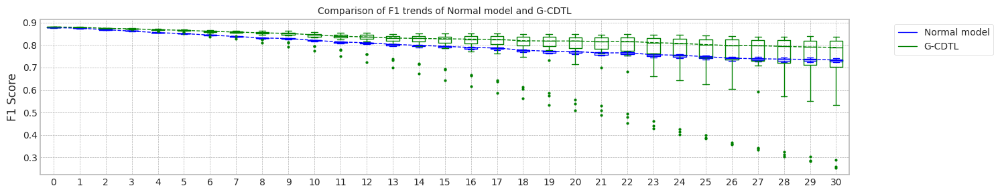

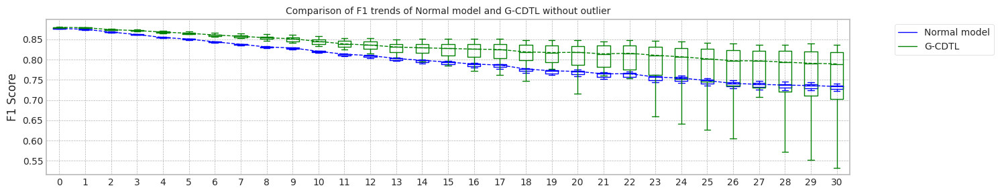

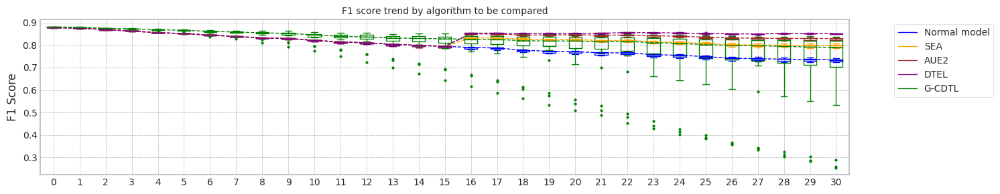

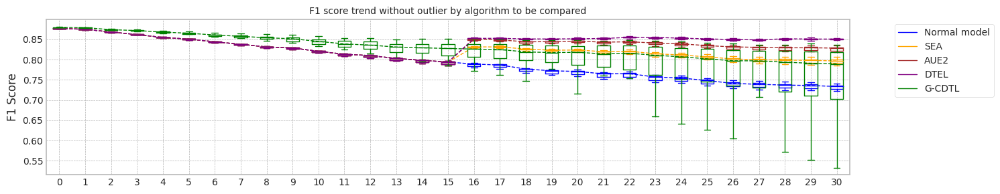

max_mean_trial= 7


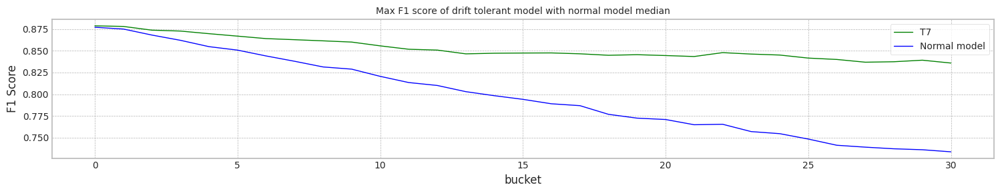

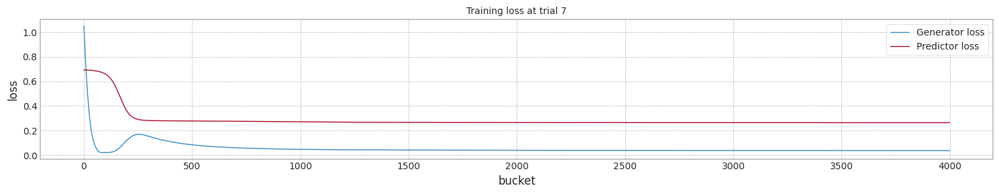

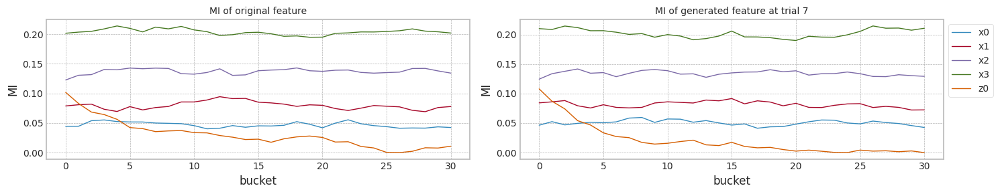

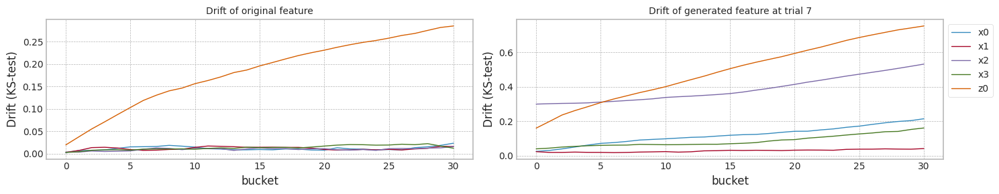

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.877274,0.874931,0.801132,0.741478,6.066793
1,1.0,0.877387,0.875055,0.794639,0.728317,6.336542
2,2.0,0.877495,0.875277,0.795524,0.728160,6.320848
3,3.0,0.877062,0.875083,0.790934,0.722198,6.075146
4,4.0,0.877533,0.875290,0.798808,0.734326,6.028787
5,5.0,0.877657,0.875042,0.797866,0.732107,6.284874
6,6.0,0.877065,0.874751,0.798957,0.734662,6.058801
7,7.0,0.878097,0.875857,0.800117,0.738893,5.889621
8,8.0,0.876011,0.873678,0.798367,0.734024,6.028702
9,9.0,0.877915,0.875925,0.799375,0.734754,5.899769


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.877274,0.874931,0.826079,0.799046,8.183268
1,1.0,0.877387,0.875055,0.823241,0.793069,7.208557
2,2.0,0.877495,0.875277,0.824987,0.794229,9.161784
3,3.0,0.877062,0.875083,0.820241,0.785847,7.706154
4,4.0,0.877533,0.875290,0.825985,0.800632,8.096554
5,5.0,0.877657,0.875042,0.825136,0.796553,7.262702
6,6.0,0.877065,0.874751,0.825015,0.795007,6.848375
7,7.0,0.878097,0.875857,0.826916,0.801361,10.799469
8,8.0,0.876011,0.873678,0.827179,0.806350,7.931516
9,9.0,0.877915,0.875925,0.826163,0.799367,7.766627


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.877274,0.874931,0.839171,0.832900,7.879184
1,1.0,0.877387,0.875055,0.834762,0.822579,8.724133
2,2.0,0.877495,0.875277,0.835767,0.825132,7.002527
3,3.0,0.877062,0.875083,0.833069,0.820039,8.542370
4,4.0,0.877533,0.875290,0.837583,0.828477,8.197393
5,5.0,0.877657,0.875042,0.836812,0.825178,8.106913
6,6.0,0.877065,0.874751,0.837526,0.828492,10.883745
7,7.0,0.878097,0.875857,0.839148,0.833108,8.485238
8,8.0,0.876011,0.873678,0.837763,0.829702,7.356346
9,9.0,0.877915,0.875925,0.837621,0.830267,7.018067


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.877274,0.874931,0.844049,0.851177,11.664481
1,1.0,0.877387,0.875055,0.843827,0.852224,14.601115
2,2.0,0.877495,0.875277,0.843182,0.851485,11.521950
3,3.0,0.877062,0.875083,0.840930,0.849079,13.414304
4,4.0,0.877533,0.875290,0.843762,0.849847,12.891883
5,5.0,0.877657,0.875042,0.843415,0.850188,11.971930
6,6.0,0.877065,0.874751,0.844057,0.852283,12.610693
7,7.0,0.878097,0.875857,0.843550,0.850904,12.298558
8,8.0,0.876011,0.873678,0.843654,0.850435,11.890173
9,9.0,0.877915,0.875925,0.842442,0.847606,13.908884


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.880291,0.879841,0.844813,0.824851,6.111807
1,1.0,0.880291,0.878965,0.844120,0.811287,6.121982
2,2.0,0.878604,0.878335,0.831717,0.794165,6.107989
3,3.0,0.880460,0.879502,0.643410,0.254980,6.090579
4,4.0,0.877774,0.878081,0.835571,0.809367,6.287867
5,5.0,0.878189,0.877810,0.754249,0.533038,6.114856
6,6.0,0.877910,0.878564,0.834411,0.803714,5.988232
7,7.0,0.878741,0.878043,0.852569,0.835875,6.020661
8,8.0,0.880618,0.879610,0.835576,0.784738,5.958695
9,9.0,0.880273,0.879558,0.852338,0.821080,6.028656


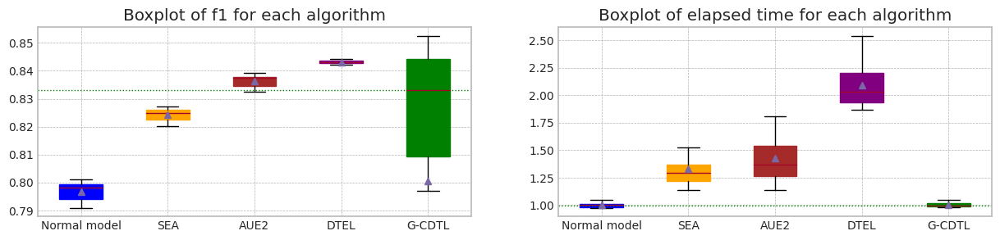

In [29]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.9,trial_count=20,weight_init=True)

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [30]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [31]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [32]:
x1.shape

(40000, 5)

In [33]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [34]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


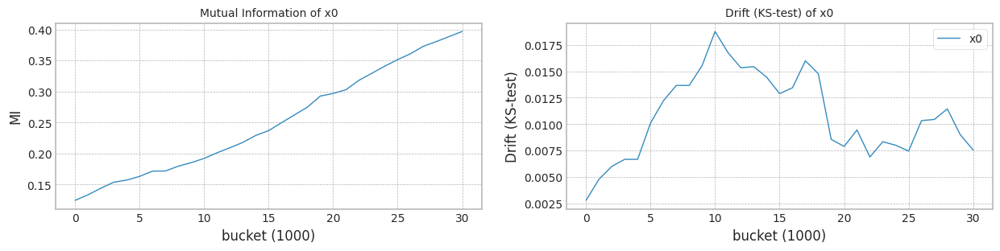

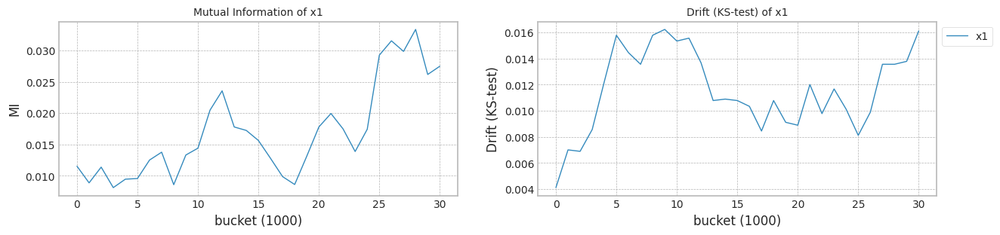

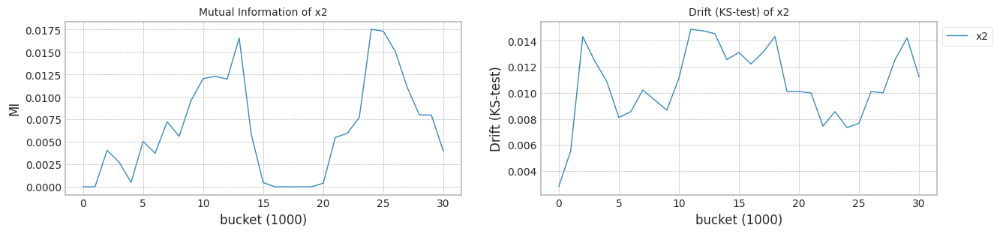

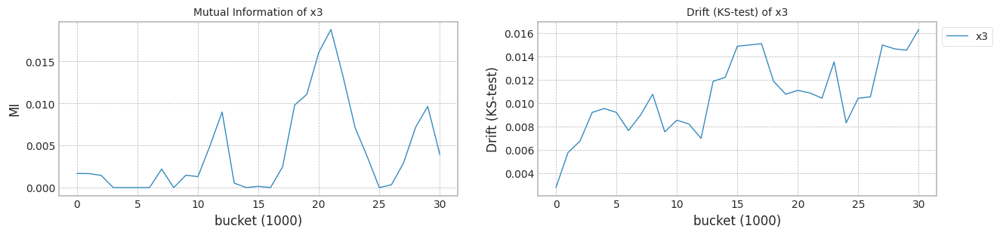

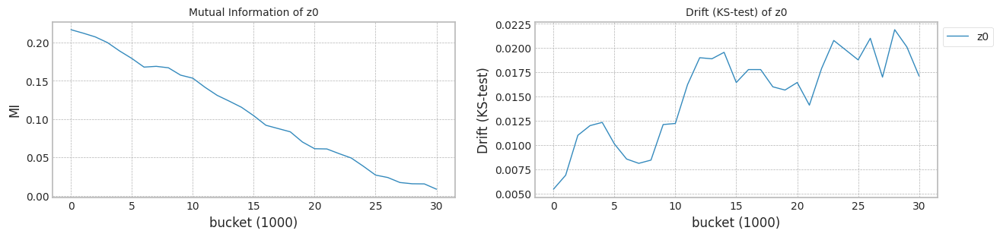

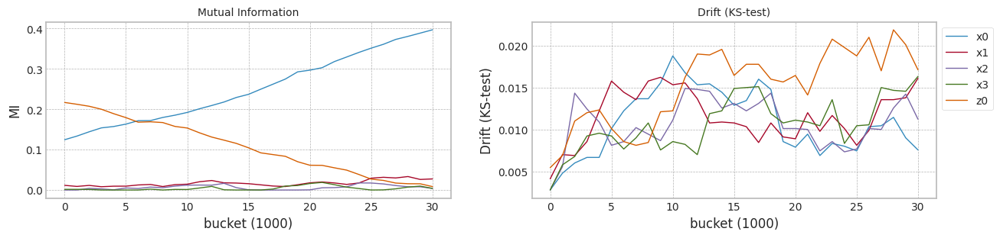

In [35]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [36]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.54it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989694761955246
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.18it/s]


Test f1 score: 0.9981937446525336
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.193918
x1    0.143211
x2    0.185097
x3    0.269581
z0    0.209082
dtype: float64
Mean F1 for all data: 0.9353537519500243
Normal model median        : 0.8989694761955246
Drift tolerant model median: 0.9353537519500243
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.04it/s]


Test f1 score: 0.9908952959028832
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988516748917879
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.25it/s]


Test f1 score: 0.9979071537290716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.192050
x1    0.120391
x2    0.048588
x3    0.440588
z0    0.382473
dtype: float64
Mean F1 for all data: 0.911362159105947
Normal model median        : 0.8989105755436562
Drift tolerant model median: 0.9233579555279856
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.41it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988026201698759
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.29it/s]


Test f1 score: 0.9983838767943721
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.17it/s]


mean of drift:
x0    0.173645
x1    0.071699
x2    0.046423
x3    0.301846
z0    0.343470
dtype: float64
Mean F1 for all data: 0.9345138108257242
Normal model median        : 0.8988516748917879
Drift tolerant model median: 0.9345138108257242
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.28it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898718747043126
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.24it/s]


Test f1 score: 0.9982886480319452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.169000
x1    0.232731
x2    0.040756
x3    0.027867
z0    0.279186
dtype: float64
Mean F1 for all data: 0.9228110595807325
Normal model median        : 0.8988271475308318
Drift tolerant model median: 0.9286624352032283
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.11it/s]


Test f1 score: 0.9910849772382397
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988600370824412
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.74it/s]


Test f1 score: 0.9989536764006468
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.151358
x1    0.082620
x2    0.108713
x3    0.407878
z0    0.377401
dtype: float64
Mean F1 for all data: 0.8965213877217938
Normal model median        : 0.8988516748917879
Drift tolerant model median: 0.9228110595807325
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.97it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989404345280869
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.80it/s]


Test f1 score: 0.9985737377579159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.170179
x1    0.184753
x2    0.049427
x3    0.069796
z0    0.411384
dtype: float64
Mean F1 for all data: 0.8790019367657526
Normal model median        : 0.8988558559871145
Drift tolerant model median: 0.9170866093433397
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.98it/s]


Test f1 score: 0.9912779673871825
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989271725529969
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.76it/s]


Test f1 score: 0.9980028530670471
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.197254
x1    0.075846
x2    0.057036
x3    0.357111
z0    0.301276
dtype: float64
Mean F1 for all data: 0.9373781431733954
Normal model median        : 0.8988600370824412
Drift tolerant model median: 0.9228110595807325
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.12it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988769197885723
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.23it/s]


Test f1 score: 0.9982896237172177
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.156989
x1    0.096900
x2    0.339190
x3    0.030763
z0    0.280283
dtype: float64
Mean F1 for all data: 0.9389933534009636
Normal model median        : 0.8988684784355068
Drift tolerant model median: 0.9286624352032283
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.79it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988081724825099
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.82it/s]


Test f1 score: 0.9983844911147012
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.099878
x1    0.092839
x2    0.029710
x3    0.045477
z0    0.300832
dtype: float64
Mean F1 for all data: 0.9344618137373472
Normal model median        : 0.8988600370824412
Drift tolerant model median: 0.9344618137373472
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.62it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988895462608276
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.67it/s]


Test f1 score: 0.9986697073356138
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.96it/s]


mean of drift:
x0    0.158272
x1    0.080907
x2    0.246423
x3    0.312541
z0    0.159072
dtype: float64
Mean F1 for all data: 0.9386631354416786
Normal model median        : 0.8988684784355068
Drift tolerant model median: 0.9344878122815357
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.75it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989171036382408
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.9981916817359855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.157032
x1    0.078606
x2    0.051867
x3    0.409416
z0    0.269903
dtype: float64
Mean F1 for all data: 0.9279889154733925
Normal model median        : 0.8988769197885723
Drift tolerant model median: 0.9344618137373472
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.11it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8993058454877978
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.75it/s]


Test f1 score: 0.9980984978132725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.179853
x1    0.077584
x2    0.355699
x3    0.086061
z0    0.286233
dtype: float64
Mean F1 for all data: 0.9400595961256147
Normal model median        : 0.8988832330247
Drift tolerant model median: 0.9344878122815357
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.33it/s]


Test f1 score: 0.991088357982556
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987632717723844
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.76it/s]


Test f1 score: 0.9979099372981189
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.167090
x1    0.056566
x2    0.284258
x3    0.250487
z0    0.163022
dtype: float64
Mean F1 for all data: 0.9345271399292342
Normal model median        : 0.8988769197885723
Drift tolerant model median: 0.9345138108257242
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.83it/s]


Test f1 score: 0.9909875723365904
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898975235041698
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.89it/s]


Test f1 score: 0.9974376008351522
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.168201
x1    0.074713
x2    0.228914
x3    0.354624
z0    0.379183
dtype: float64
Mean F1 for all data: 0.8960344762405826
Normal model median        : 0.8988832330247
Drift tolerant model median: 0.9344878122815357
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.99it/s]


Test f1 score: 0.9911823267279796
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988988673116259
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.35it/s]


Test f1 score: 0.9983841840129266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.170796
x1    0.088871
x2    0.062541
x3    0.407061
z0    0.209269
dtype: float64
Mean F1 for all data: 0.9524175589179821
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9345138108257242
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.71it/s]


Test f1 score: 0.9911823267279796
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987703597124719
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.02it/s]


Test f1 score: 0.9983838767943721
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.147964
x1    0.083047
x2    0.276563
x3    0.255717
z0    0.146878
dtype: float64
Mean F1 for all data: 0.9005985267596116
Normal model median        : 0.8988832330247
Drift tolerant model median: 0.9344878122815357
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.33it/s]


Test f1 score: 0.9909021986353299
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987268677149437
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.49it/s]


Test f1 score: 0.9967760288260952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.154409
x1    0.098842
x2    0.171928
x3    0.350398
z0    0.286498
dtype: float64
Mean F1 for all data: 0.924202123591858
Normal model median        : 0.8988769197885723
Drift tolerant model median: 0.9344618137373472
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.45it/s]


Test f1 score: 0.9910866679309691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898898877885459
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.17it/s]


Test f1 score: 0.9984790874524715
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.159115
x1    0.089545
x2    0.047355
x3    0.390330
z0    0.270208
dtype: float64
Mean F1 for all data: 0.9324560370847145
Normal model median        : 0.8988832330247
Drift tolerant model median: 0.9334589254110308
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.96it/s]


Test f1 score: 0.9910917361637605
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8991271023394198
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.41it/s]


Test f1 score: 0.998385104968177
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.156470
x1    0.088473
x2    0.314935
x3    0.027774
z0    0.277072
dtype: float64
Mean F1 for all data: 0.9265745153521624
Normal model median        : 0.8988895462608276
Drift tolerant model median: 0.9324560370847145
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.84it/s]


Test f1 score: 0.990990990990991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8994535984712795
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.04it/s]


Test f1 score: 0.9975238095238095
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.184176
x1    0.119423
x2    0.044226
x3    0.337258
z0    0.439935
dtype: float64
Mean F1 for all data: 0.902266046693735
Normal model median        : 0.8988942067862268
Drift tolerant model median: 0.9302224762790534
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9159249616768138
SEA median: 0.9159249616768138
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.55it/s]


Early stop at  2414.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9408885659154219
AUE median: 0.9408885659154219
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514370158785049
DTEL median: 0.9514370158785049
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9291007898393994
SEA median: 0.9225128757581066
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3368.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9413434007731243
AUE median: 0.941115983344273
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515943978889301
DTEL median: 0.9515157068837174
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9148733752306726
SEA median: 0.9159249616768138
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3440.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9409155426765505
AUE median: 0.9409155426765505
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.07it/s]


Early stop at  3807.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513344434940597
DTEL median: 0.9514370158785049
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.06it/s]


Early stop at  3552.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9283816133073133
SEA median: 0.9221532874920635
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.19it/s]


Early stop at  3015.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9405426785272643
AUE median: 0.9409020542959863
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.08it/s]


Early stop at  3400.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515054986267537
DTEL median: 0.9514712572526294
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9293831793955326
SEA median: 0.9283816133073133
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  3698.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.940887168862507
AUE median: 0.9408885659154219
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.22it/s]


Early stop at  2668.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514429562398962
DTEL median: 0.9514429562398962
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.99it/s]


Early stop at  3770.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9279435284891389
SEA median: 0.9281625708982261
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9412931864719167
AUE median: 0.9409020542959863
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515981783200632
DTEL median: 0.951474227433325
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3455.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9131975284166061
SEA median: 0.9279435284891389
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9411619222600777
AUE median: 0.9409155426765505
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951595133943698
DTEL median: 0.9515054986267537
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9163234322697951
SEA median: 0.922133480379467
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9408465959384393
AUE median: 0.9409020542959863
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951561410711548
DTEL median: 0.9515334546691508
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9331424366410738
SEA median: 0.9279435284891389
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.02it/s]


Early stop at  3434.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9415134028134658
AUE median: 0.9409155426765505
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511992786454815
DTEL median: 0.9515054986267537
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9344961725885051
SEA median: 0.9281625708982261
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  3702.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9408975621517739
AUE median: 0.9409065524141622
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3279.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951516803628743
DTEL median: 0.9515111511277483
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.79it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9278799905615106
SEA median: 0.9279435284891389
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.07it/s]


Early stop at  3479.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9415833477191445
AUE median: 0.9409155426765505
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514667008020643
DTEL median: 0.9515054986267537
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.03it/s]


Early stop at  3796.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.926611359982745
SEA median: 0.9279117595253248
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9410359601710935
AUE median: 0.940975751423822
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514357163433457
DTEL median: 0.951486099714409
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.10it/s]


Early stop at  3424.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9270042359325402
SEA median: 0.9278799905615106
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  3774.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9408086155134641
AUE median: 0.9409155426765505
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511876863559592
DTEL median: 0.9514667008020643
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9278387463027811
SEA median: 0.9278593684321459
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3363.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9415189238688901
AUE median: 0.940975751423822
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515803393230098
DTEL median: 0.951486099714409
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9277759991207103
SEA median: 0.9278387463027811
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.04it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9412709929837361
AUE median: 0.9410359601710935
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514915469960961
DTEL median: 0.9514915469960961
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  3801.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9247042225490201
SEA median: 0.9278073727117457
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.04it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9405252704158387
AUE median: 0.940975751423822
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515272336996317
DTEL median: 0.9514985228114249
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9291686205078464
SEA median: 0.9278387463027811
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.24it/s]


Early stop at  2923.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9403728225639266
AUE median: 0.9409155426765505
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  3809.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512321731745169
DTEL median: 0.9514915469960961
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.80it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9276050423189838
SEA median: 0.9278073727117457
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  3571.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9409407894046307
AUE median: 0.9409281660405906
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  3839.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515527361793651
DTEL median: 0.9514985228114249
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.83it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9268826327668169
SEA median: 0.9277759991207103
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.78it/s]


Early stop at  310.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8974885206230107
AUE median: 0.9409155426765505
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.96it/s]


Early stop at  3855.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951284113095136
DTEL median: 0.9514915469960961
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.81it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9337950332720122
SEA median: 0.9278073727117457
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.27it/s]


Early stop at  2728.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9413236960307899
AUE median: 0.9409281660405906
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.15it/s]


Early stop at  3153.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.951351519581105
DTEL median: 0.9514791238990802


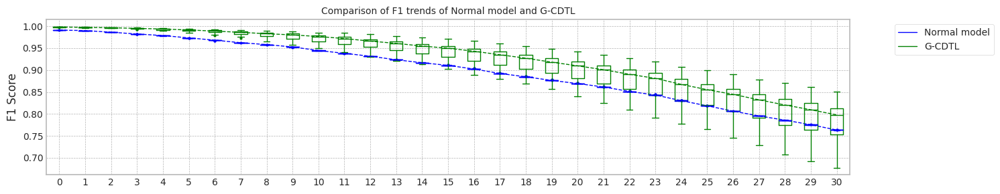

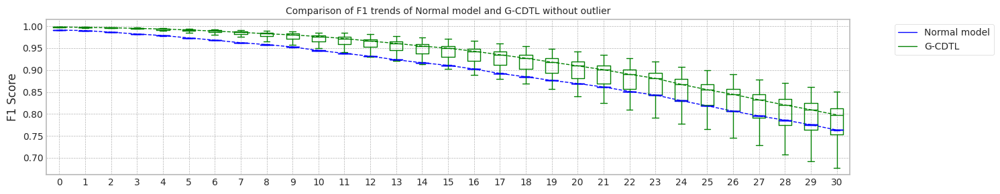

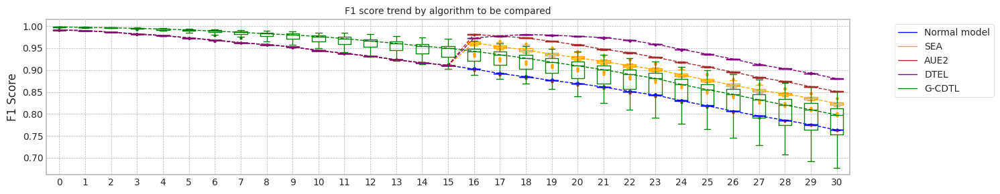

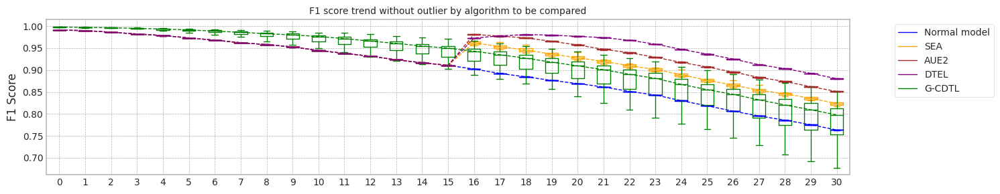

max_mean_trial= 14


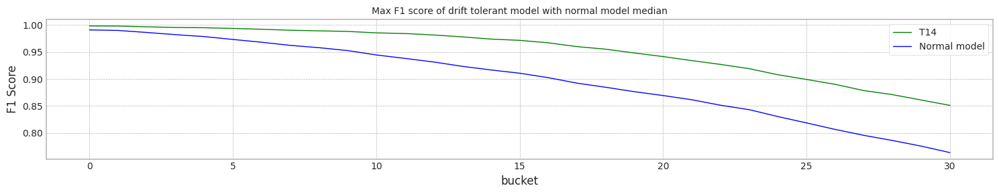

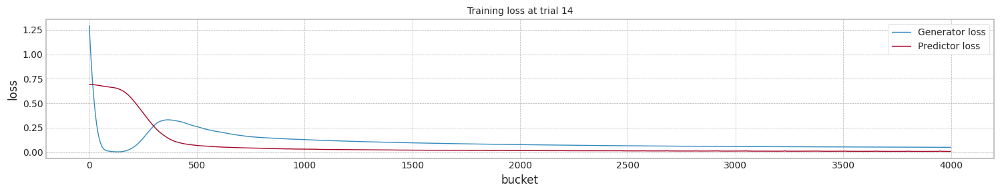

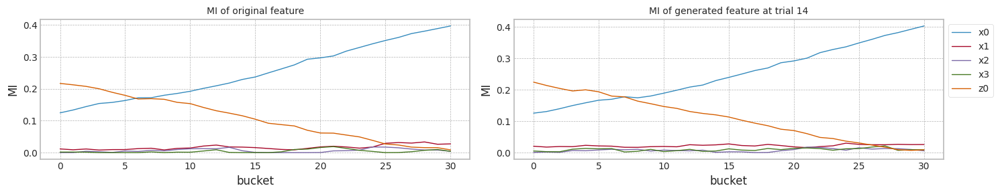

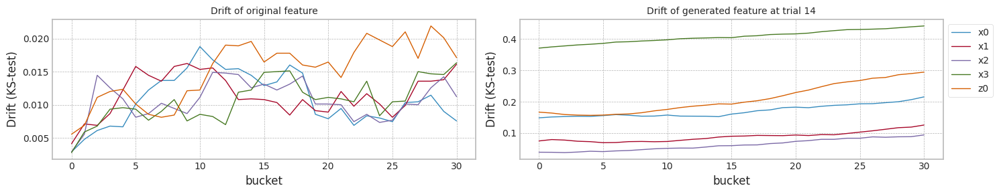

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.898969,0.763477,6.031521
1,1.0,0.990895,0.990073,0.898852,0.763427,5.957264
2,2.0,0.991088,0.990168,0.898803,0.763477,5.984952
3,3.0,0.990991,0.990073,0.898719,0.763238,6.088114
4,4.0,0.991085,0.990260,0.898860,0.763477,6.206693
5,5.0,0.990991,0.989977,0.898940,0.763348,5.917311
6,6.0,0.991278,0.989597,0.898927,0.763975,6.043072
7,7.0,0.991088,0.990168,0.898877,0.763636,5.939111
8,8.0,0.991088,0.990075,0.898808,0.763128,5.955744
9,9.0,0.991087,0.990073,0.898890,0.763427,5.968567


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.915925,0.801715,10.597322
1,1.0,0.990895,0.990073,0.929101,0.826569,9.859905
2,2.0,0.991088,0.990168,0.914873,0.799832,10.731037
3,3.0,0.990991,0.990073,0.928382,0.824342,10.167059
4,4.0,0.991085,0.990260,0.929383,0.825988,10.923483
5,5.0,0.990991,0.989977,0.927944,0.823682,10.414899
6,6.0,0.991278,0.989597,0.913198,0.796238,10.115700
7,7.0,0.991088,0.990168,0.916323,0.802798,10.694445
8,8.0,0.991088,0.990075,0.933142,0.834881,10.829128
9,9.0,0.991087,0.990073,0.934496,0.835987,10.715501


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.940889,0.850907,8.785641
1,1.0,0.990895,0.990073,0.941343,0.852053,10.106431
2,2.0,0.991088,0.990168,0.940916,0.851221,10.102939
3,3.0,0.990991,0.990073,0.940543,0.850976,9.752400
4,4.0,0.991085,0.990260,0.940887,0.851096,10.471606
5,5.0,0.990991,0.989977,0.941293,0.851775,10.726262
6,6.0,0.991278,0.989597,0.941162,0.851804,10.814160
7,7.0,0.991088,0.990168,0.940847,0.850690,10.959216
8,8.0,0.991088,0.990075,0.941513,0.852420,10.298225
9,9.0,0.991087,0.990073,0.940898,0.850852,10.596246


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990993,0.989979,0.951437,0.880097,15.177698
1,1.0,0.990895,0.990073,0.951594,0.881026,15.379438
2,2.0,0.991088,0.990168,0.951334,0.880080,15.052552
3,3.0,0.990991,0.990073,0.951505,0.880637,14.954536
4,4.0,0.991085,0.990260,0.951443,0.880884,13.999738
5,5.0,0.990991,0.989977,0.951598,0.880787,15.367066
6,6.0,0.991278,0.989597,0.951595,0.881431,15.287721
7,7.0,0.991088,0.990168,0.951561,0.880813,15.334856
8,8.0,0.991088,0.990075,0.951199,0.880053,15.502029
9,9.0,0.991087,0.990073,0.951517,0.880442,14.695976


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.998194,0.997150,0.935354,0.803993,6.009246
1,1.0,0.997907,0.996957,0.911362,0.754793,5.976976
2,2.0,0.998384,0.996865,0.934514,0.815100,6.042895
3,3.0,0.998289,0.997246,0.922811,0.785090,6.064680
4,4.0,0.998954,0.997622,0.896521,0.715980,5.970541
5,5.0,0.998574,0.997337,0.879002,0.677664,6.020688
6,6.0,0.998003,0.997244,0.937378,0.820555,6.021629
7,7.0,0.998290,0.997627,0.938993,0.809103,5.962015
8,8.0,0.998384,0.997437,0.934462,0.803060,5.997960
9,9.0,0.998670,0.998196,0.938663,0.824668,6.291544


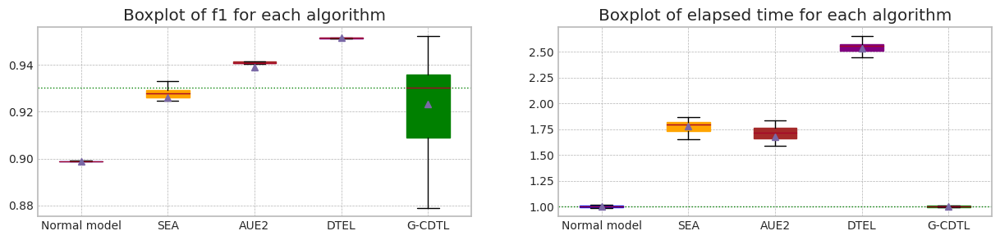

In [37]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.9,trial_count=20,weight_init=True)

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [38]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 1.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [39]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.563076837122426


19931

### 실험

MI Analysis MI Max 0.21053, Min 0.00413, Mean 0.06759, Std 0.07940
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


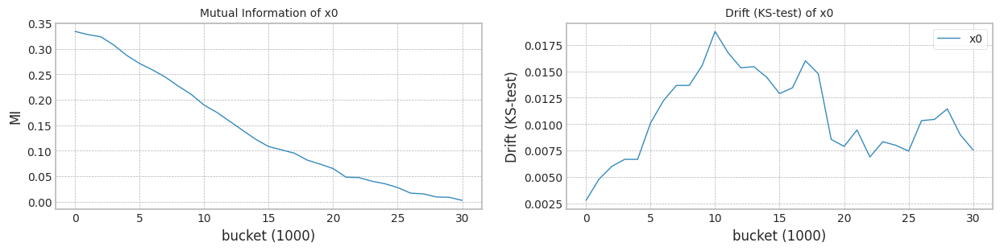

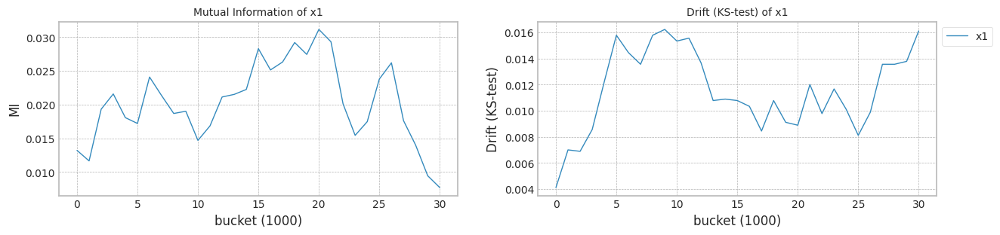

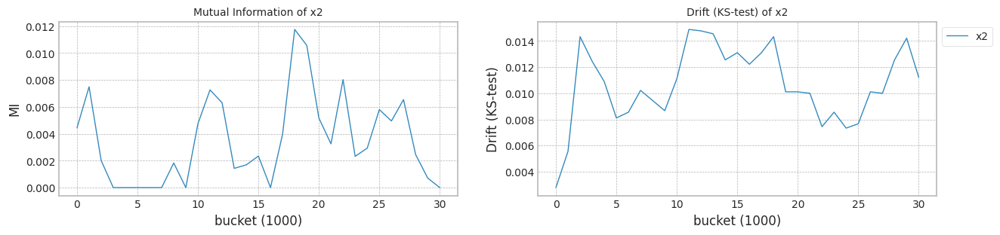

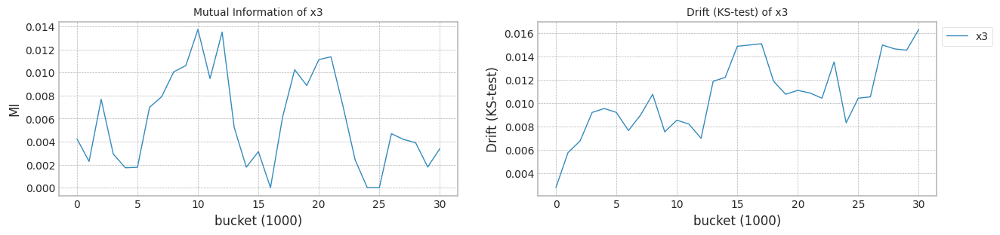

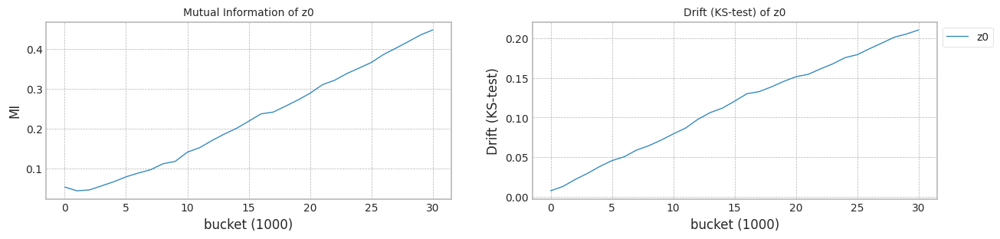

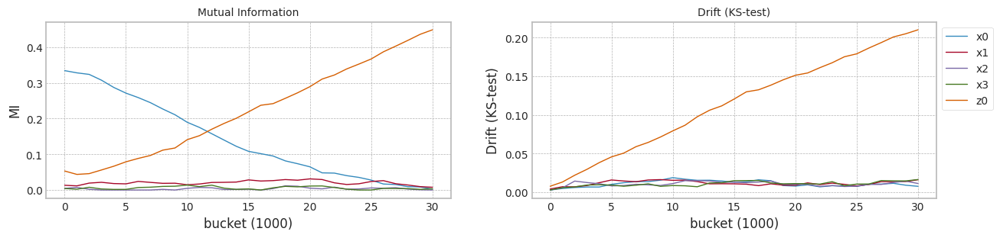

In [40]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [41]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.04it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750341105531221
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.06it/s]


Test f1 score: 0.9537601118545891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.09it/s]


mean of drift:
x0    0.226566
x1    0.121703
x2    0.345968
x3    0.453133
z0    0.107204
dtype: float64
Mean F1 for all data: 0.8989570908928715
Normal model median        : 0.8750341105531221
Drift tolerant model median: 0.8989570908928715
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.50it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750719721833556
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.61it/s]


Test f1 score: 0.9526556594390293
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.119176
x1    0.075118
x2    0.106480
x3    0.401233
z0    0.131950
dtype: float64
Mean F1 for all data: 0.8962056723862865
Normal model median        : 0.8750530413682389
Drift tolerant model median: 0.897581381639579
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.80it/s]


Test f1 score: 0.9518982309679984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748285410043974
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.31it/s]


Test f1 score: 0.9533978644845823
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.052935
x1    0.065333
x2    0.015437
x3    0.434520
z0    0.134932
dtype: float64
Mean F1 for all data: 0.8912525092332929
Normal model median        : 0.8750341105531221
Drift tolerant model median: 0.8962056723862865
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.90it/s]


Test f1 score: 0.952399880751267
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749573813439233
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.79it/s]


Test f1 score: 0.952922401755436
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.095606
x1    0.025290
x2    0.045348
x3    0.369219
z0    0.125097
dtype: float64
Mean F1 for all data: 0.9031911557328399
Normal model median        : 0.8749957459485227
Drift tolerant model median: 0.897581381639579
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.55it/s]


Test f1 score: 0.9520969986086265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8746834544364072
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.07it/s]


Test f1 score: 0.953784860557769
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.159093
x1    0.131839
x2    0.160871
x3    0.170563
z0    0.082670
dtype: float64
Mean F1 for all data: 0.8933952236331095
Normal model median        : 0.8749573813439233
Drift tolerant model median: 0.8962056723862865
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.60it/s]


Test f1 score: 0.9506013318755591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.01it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744363029177237
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.04it/s]


Test f1 score: 0.9531499202551834
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.115817
x1    0.229100
x2    0.038161
x3    0.229115
z0    0.112125
dtype: float64
Mean F1 for all data: 0.8948796900410324
Normal model median        : 0.8748929611741604
Drift tolerant model median: 0.8955426812136594
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.76it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750609239220203
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.27it/s]


Test f1 score: 0.9540790915429824
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.090591
x1    0.026444
x2    0.103341
x3    0.434315
z0    0.154785
dtype: float64
Mean F1 for all data: 0.8942545978499015
Normal model median        : 0.8749573813439233
Drift tolerant model median: 0.8948796900410324
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.40it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750348264488694
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.52it/s]


Test f1 score: 0.9540298507462687
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.170577
x1    0.054753
x2    0.320351
x3    0.169903
z0    0.118108
dtype: float64
Mean F1 for all data: 0.9021732420031098
Normal model median        : 0.8749957459485227
Drift tolerant model median: 0.8955426812136594
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.83it/s]


Test f1 score: 0.9510183805265774
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8746542669743823
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.08it/s]


Test f1 score: 0.9534164588528677
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.114871
x1    0.173122
x2    0.122548
x3    0.145566
z0    0.090695
dtype: float64
Mean F1 for all data: 0.8879137607212698
Normal model median        : 0.8749573813439233
Drift tolerant model median: 0.8948796900410324
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.11it/s]


Test f1 score: 0.951803637086356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.875088523034331
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.40it/s]


Test f1 score: 0.9535696455317024
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.122111
x1    0.098566
x2    0.313369
x3    0.471079
z0    0.114258
dtype: float64
Mean F1 for all data: 0.8962279021394347
Normal model median        : 0.8749957459485227
Drift tolerant model median: 0.8955426812136594
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.81it/s]


Test f1 score: 0.9519928436537123
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8759075797352532
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.96it/s]


Test f1 score: 0.9534513626417345
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.157240
x1    0.025373
x2    0.047738
x3    0.434455
z0    0.127272
dtype: float64
Mean F1 for all data: 0.8999766439222021
Normal model median        : 0.8750341105531221
Drift tolerant model median: 0.8962056723862865
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.21it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750719721833556
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.46it/s]


Test f1 score: 0.9533978644845823
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.115398
x1    0.083677
x2    0.355588
x3    0.164781
z0    0.123545
dtype: float64
Mean F1 for all data: 0.9045122408700094
Normal model median        : 0.8750344685009958
Drift tolerant model median: 0.8962167872628606
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.25it/s]


Test f1 score: 0.9525797793021175
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8752555835258026
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.88it/s]


Test f1 score: 0.9527991218441273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.171416
x1    0.044950
x2    0.350570
x3    0.217412
z0    0.134609
dtype: float64
Mean F1 for all data: 0.8993890479733073
Normal model median        : 0.8750348264488694
Drift tolerant model median: 0.8962279021394347
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.68it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750719721833556
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.94it/s]


Test f1 score: 0.9522388059701493
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.265495
x1    0.197072
x2    0.338036
x3    0.393315
z0    0.174975
dtype: float64
Mean F1 for all data: 0.8865766388231237
Normal model median        : 0.8750478751854449
Drift tolerant model median: 0.8962167872628606
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.71it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750719721833556
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.01it/s]


Test f1 score: 0.9542874215715567
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.074444
x1    0.118871
x2    0.138624
x3    0.470720
z0    0.138599
dtype: float64
Mean F1 for all data: 0.8995382038273284
Normal model median        : 0.8750609239220203
Drift tolerant model median: 0.8962279021394347
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 624.50it/s]


Test f1 score: 0.951926897099722
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749388704699691
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.55it/s]


Test f1 score: 0.9535579031293603
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.162427
x1    0.079057
x2    0.322498
x3    0.239039
z0    0.150821
dtype: float64
Mean F1 for all data: 0.9010479298548312
Normal model median        : 0.8750478751854449
Drift tolerant model median: 0.897592496516153
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.30it/s]


Test f1 score: 0.9515952688599543
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749793983428157
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.89it/s]


Test f1 score: 0.9534398888116747
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.109556
x1    0.043928
x2    0.105803
x3    0.381344
z0    0.129939
dtype: float64
Mean F1 for all data: 0.8993594212105501
Normal model median        : 0.8750348264488694
Drift tolerant model median: 0.8989570908928715
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.78it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.875044532233886
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.23it/s]


Test f1 score: 0.9536410664544368
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.078760
x1    0.139570
x2    0.321362
x3    0.345523
z0    0.137444
dtype: float64
Mean F1 for all data: 0.9003423495586349
Normal model median        : 0.8750396793413777
Drift tolerant model median: 0.8991582560517108
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.00it/s]


Test f1 score: 0.9516048891980523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.95it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8754825394194075
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.78it/s]


Test f1 score: 0.9536159600997507
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.042814
x1    0.080376
x2    0.390907
x3    0.278792
z0    0.131280
dtype: float64
Mean F1 for all data: 0.900756737737268
Normal model median        : 0.875044532233886
Drift tolerant model median: 0.8993594212105501
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.66it/s]


Test f1 score: 0.9519364448857993
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8748498514390991
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.59it/s]


Test f1 score: 0.9548834903321766
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.139276
x1    0.093946
x2    0.034928
x3    0.472624
z0    0.143315
dtype: float64
Mean F1 for all data: 0.8976378696004724
Normal model median        : 0.8750396793413777
Drift tolerant model median: 0.8991582560517108
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8936549309279522
SEA median: 0.8936549309279522
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1696.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067599394142882
AUE median: 0.9067599394142882
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1610.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212316212539753
DTEL median: 0.9212316212539753
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.76it/s]


Early stop at  2020.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.896233813021605
SEA median: 0.8949443719747786
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.51it/s]


Early stop at  2450.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9070049165707396
AUE median: 0.9068824279925138
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212783290603466
DTEL median: 0.9212549751571609
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.80it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8950014371383769
SEA median: 0.8950014371383769
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.95it/s]


Early stop at  1527.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9037818848859628
AUE median: 0.9067599394142882
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  1937.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209046827206925
DTEL median: 0.9212316212539753
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.87it/s]


Early stop at  1691.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963632310959289
SEA median: 0.895617625079991
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.95it/s]


Early stop at  1590.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067706510736648
AUE median: 0.9067652952439765
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210472928102704
DTEL median: 0.9211394570321229
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.16it/s]


Early stop at  1354.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8995702375217121
SEA median: 0.896233813021605
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.40it/s]


Early stop at  2667.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9043018655436427
AUE median: 0.9067599394142882
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


Early stop at  1367.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9200306275936198
DTEL median: 0.9210472928102704
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.61it/s]


Early stop at  2228.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8957108573622252
SEA median: 0.8959723351919151
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1746.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065035354830971
AUE median: 0.9066317374486927
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1102.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209340938350222
DTEL median: 0.9209906933226464
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.43it/s]


Early stop at  2523.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963598967065832
SEA median: 0.896233813021605
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9062495228938926
AUE median: 0.9065035354830971
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.40it/s]


Early stop at  2018.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.920727967264473
DTEL median: 0.9209340938350222
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  1865.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963043711745288
SEA median: 0.8962690920980669
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9064270137640055
AUE median: 0.9064652746235513
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.67it/s]


Early stop at  1039.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213674541035278
DTEL median: 0.9209906933226464
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.64it/s]


Early stop at  2197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8975226765690054
SEA median: 0.8963043711745288
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9062692918288733
AUE median: 0.9064270137640055
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.36it/s]


Early stop at  2160.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9198928026220572
DTEL median: 0.9209340938350222
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.66it/s]


Early stop at  2098.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9015467238014709
SEA median: 0.896332133940556
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2025.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.903854095544113
AUE median: 0.9063481527964394
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9207755396811638
DTEL median: 0.9209193882778574
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8949891426358474
SEA median: 0.8963043711745288
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1856.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.906828160134909
AUE median: 0.9064270137640055
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1511.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212997932074325
DTEL median: 0.9209340938350222
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


Early stop at  1892.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8962747555579037
SEA median: 0.8962895633662162
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.906131503339364
AUE median: 0.9063481527964394
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214372470559518
DTEL median: 0.9209906933226464
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.57it/s]


Early stop at  2220.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8964344683263012
SEA median: 0.8963043711745288
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  2101.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065597094702837
AUE median: 0.9064270137640055
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3293.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9211284700863608
DTEL median: 0.9210472928102704
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1861.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8967882414538014
SEA median: 0.896332133940556
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1776.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.907044978869141
AUE median: 0.9064652746235513
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3322.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212865255626566
DTEL median: 0.9210878814483157
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  1933.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963468556126649
SEA median: 0.8963468556126649
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  1854.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.907172539046814
AUE median: 0.9065035354830971
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212998638907414
DTEL median: 0.9211284700863608
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.55it/s]


Early stop at  2260.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9007078899157912
SEA median: 0.8963533761596241
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.86it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9024671187374464
AUE median: 0.9064652746235513
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.11it/s]


Early stop at  3230.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9203421201896755
DTEL median: 0.9210878814483157
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1474.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965602381272922
SEA median: 0.8963598967065832
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1988.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067438398411608
AUE median: 0.9065035354830971
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1679.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209391159941814
DTEL median: 0.9210472928102704
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.44it/s]


Early stop at  2649.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8962756884477119
SEA median: 0.8963533761596241
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.59it/s]


Early stop at  2257.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9069453195174595
AUE median: 0.9065316224766904
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]


Early stop at  2307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214356799211139
DTEL median: 0.9210878814483157
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.88it/s]


Early stop at  1720.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963658415503921
SEA median: 0.8963598967065832
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


Early stop at  45.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8714216195271919
AUE median: 0.9065035354830971
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2108.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9205630940336321
DTEL median: 0.9210472928102704
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.14it/s]


Early stop at  1384.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8970481990649163
SEA median: 0.8963615639012561
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.65it/s]


Early stop at  2113.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9062470886574492
AUE median: 0.9064652746235513
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.96it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9202696085921699
DTEL median: 0.920993204402226


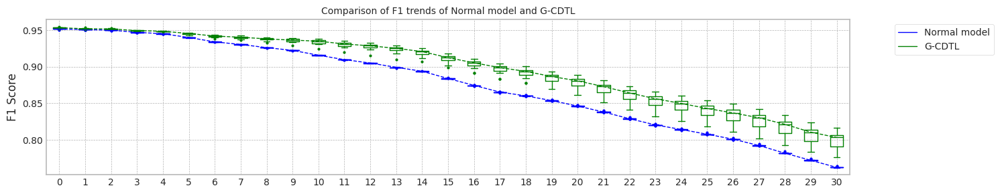

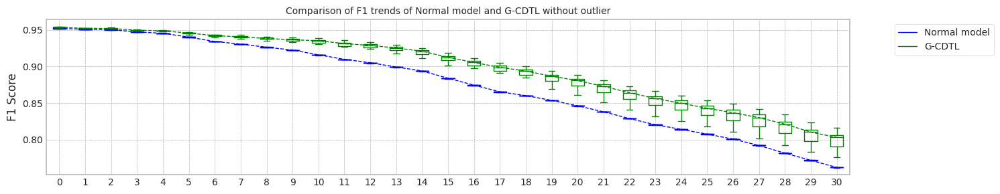

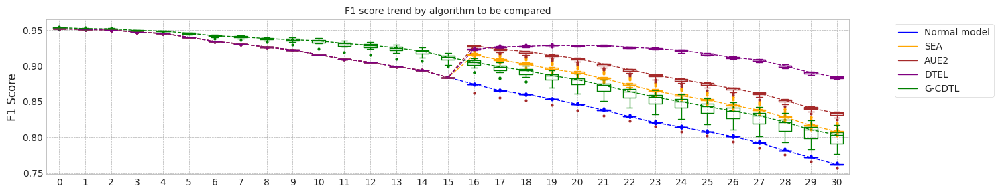

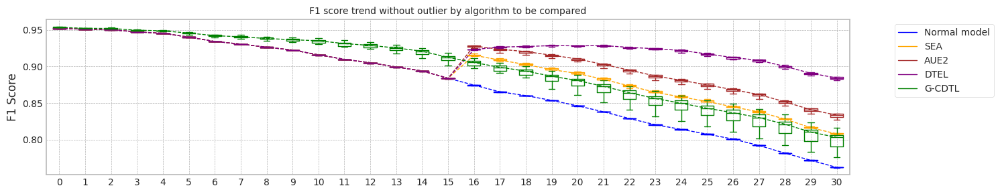

max_mean_trial= 11


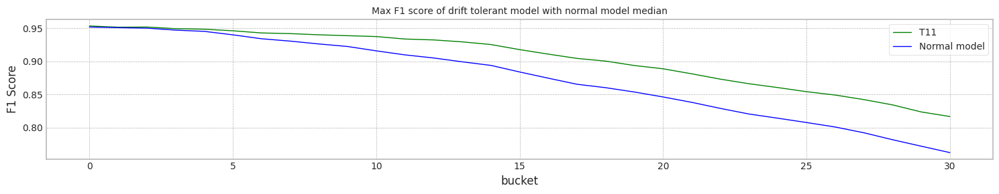

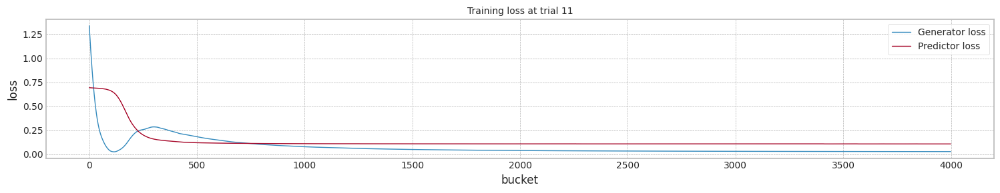

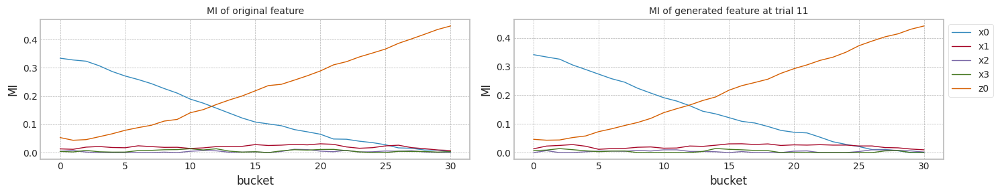

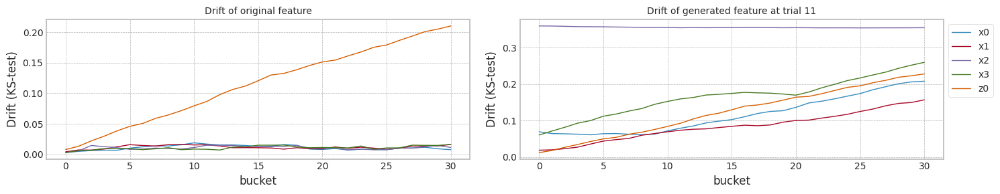

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.875034,0.762416,5.972766
1,1.0,0.951813,0.950859,0.875072,0.762363,6.108072
2,2.0,0.951898,0.950943,0.874829,0.762033,5.991685
3,3.0,0.952400,0.951539,0.874957,0.762310,5.990872
4,4.0,0.952097,0.950963,0.874683,0.762182,5.862277
5,5.0,0.950601,0.949762,0.874436,0.762725,6.239544
6,6.0,0.951813,0.950859,0.875061,0.762363,6.000539
7,7.0,0.951813,0.950859,0.875035,0.762363,6.043067
8,8.0,0.951018,0.950273,0.874654,0.762831,5.949769
9,9.0,0.951804,0.950839,0.875089,0.762683,5.968725


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.893655,0.801914,10.675747
1,1.0,0.951813,0.950859,0.896234,0.807988,8.296791
2,2.0,0.951898,0.950943,0.895001,0.804579,11.119600
3,3.0,0.952400,0.951539,0.896363,0.808359,8.062282
4,4.0,0.952097,0.950963,0.899570,0.816194,7.496932
5,5.0,0.950601,0.949762,0.895711,0.807476,8.647306
6,6.0,0.951813,0.950859,0.896360,0.807988,9.092207
7,7.0,0.951813,0.950859,0.896304,0.807988,8.246737
8,8.0,0.951018,0.950273,0.897523,0.811720,8.570708
9,9.0,0.951804,0.950839,0.901547,0.820082,8.505718


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.906760,0.834736,7.943008
1,1.0,0.951813,0.950859,0.907005,0.835428,8.874334
2,2.0,0.951898,0.950943,0.903782,0.828320,7.882338
3,3.0,0.952400,0.951539,0.906771,0.834947,7.899977
4,4.0,0.952097,0.950963,0.904302,0.829363,9.179436
5,5.0,0.950601,0.949762,0.906504,0.835525,8.145640
6,6.0,0.951813,0.950859,0.906250,0.831856,10.723283
7,7.0,0.951813,0.950859,0.906427,0.832949,10.712627
8,8.0,0.951018,0.950273,0.906269,0.833928,7.728081
9,9.0,0.951804,0.950839,0.903854,0.827665,8.407135


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951813,0.950859,0.921232,0.884977,12.466202
1,1.0,0.951813,0.950859,0.921278,0.885701,15.485787
2,2.0,0.951898,0.950943,0.920905,0.883341,13.016404
3,3.0,0.952400,0.951539,0.921047,0.884838,15.437629
4,4.0,0.952097,0.950963,0.920031,0.881352,12.421368
5,5.0,0.950601,0.949762,0.920934,0.885914,12.109749
6,6.0,0.951813,0.950859,0.920728,0.883020,12.938892
7,7.0,0.951813,0.950859,0.921367,0.885435,11.654703
8,8.0,0.951018,0.950273,0.919893,0.881360,13.169275
9,9.0,0.951804,0.950839,0.920776,0.881844,15.346260


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.953760,0.951981,0.898957,0.802773,6.143730
1,1.0,0.952656,0.951385,0.896206,0.794131,6.075618
2,2.0,0.953398,0.951639,0.891253,0.784689,5.997108
3,3.0,0.952922,0.952172,0.903191,0.809930,5.934294
4,4.0,0.953785,0.951687,0.893395,0.789143,5.982576
5,5.0,0.953150,0.951687,0.894880,0.791434,5.998104
6,6.0,0.954079,0.952723,0.894255,0.789632,6.017175
7,7.0,0.954030,0.952039,0.902173,0.807914,6.066244
8,8.0,0.953416,0.952305,0.887914,0.785477,5.959142
9,9.0,0.953570,0.952210,0.896228,0.800910,5.977894


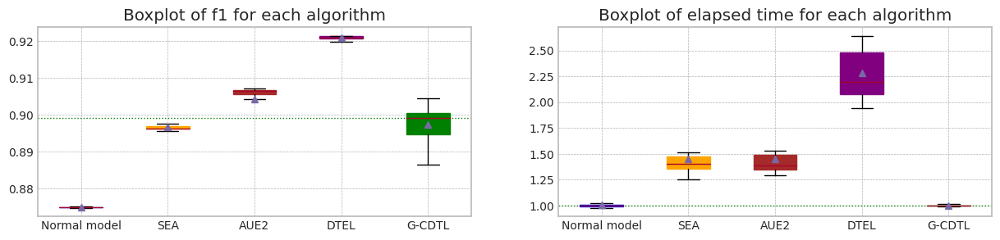

In [42]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.9,trial_count=20,weight_init=True)


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [43]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


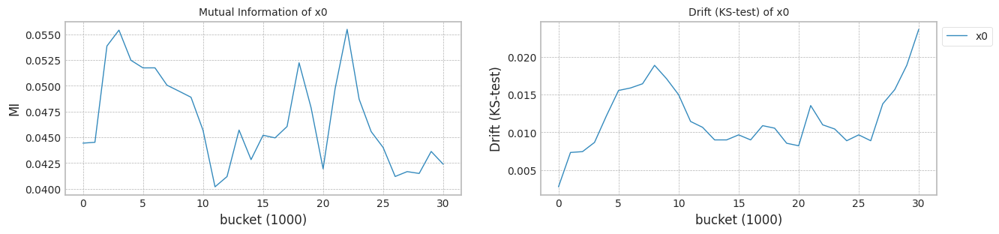

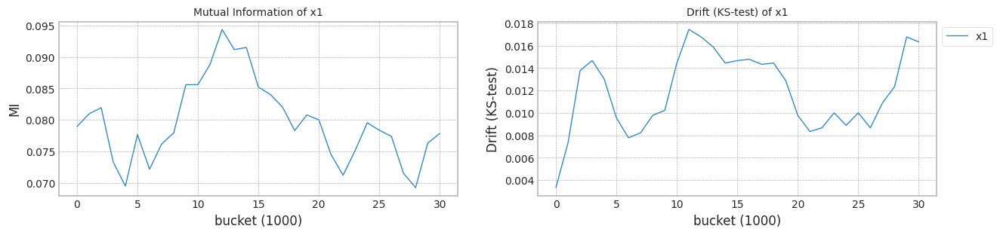

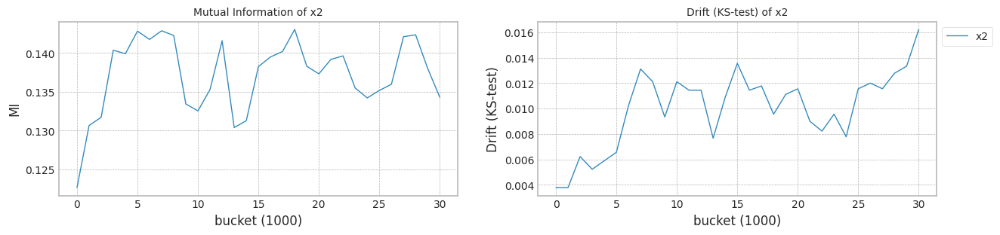

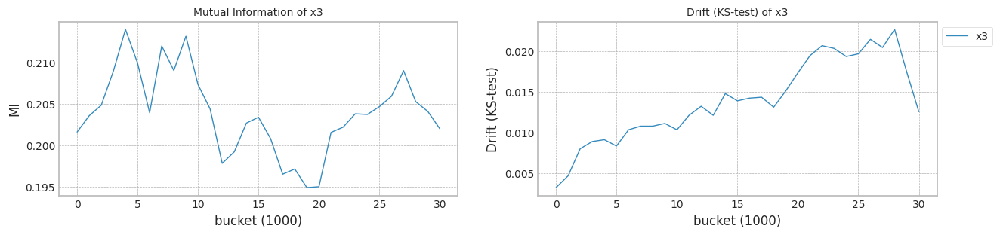

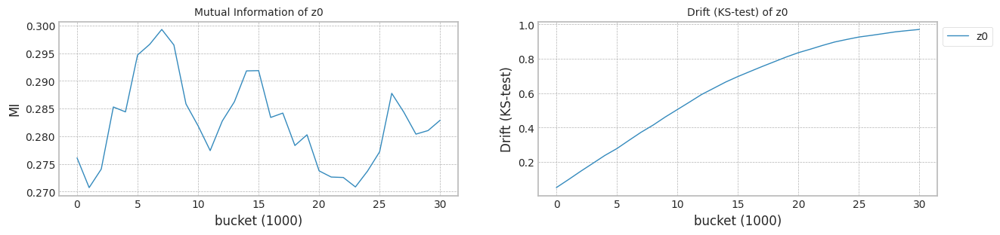

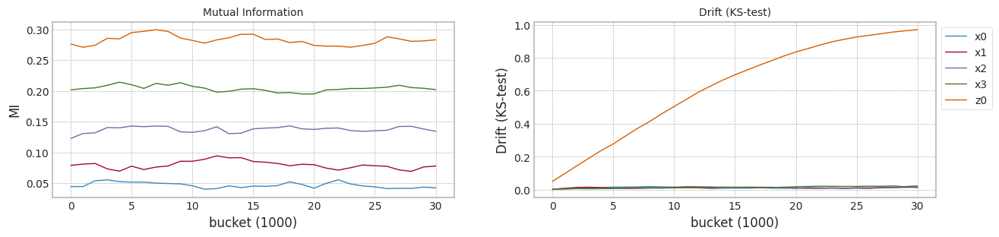

In [44]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [45]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.56it/s]


Test f1 score: 0.9121856027753685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7694158696819199
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.53it/s]


Test f1 score: 0.9210351692103518
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.031165
x1    0.123921
x2    0.522667
x3    0.255075
z0    0.362717
dtype: float64
Mean F1 for all data: 0.8076892547297264
Normal model median        : 0.7694158696819199
Drift tolerant model median: 0.8076892547297264
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.76it/s]


Test f1 score: 0.9116945107398569
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769608074571154
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.88it/s]


Test f1 score: 0.9222958057395144
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.598065
x1    0.101143
x2    0.117892
x3    0.154226
z0    0.473108
dtype: float64
Mean F1 for all data: 0.9240677772197756
Normal model median        : 0.7695119721265369
Drift tolerant model median: 0.8658785159747511
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.50it/s]


Test f1 score: 0.9116147923218739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7696198788978744
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.24it/s]


Test f1 score: 0.9210265447736534
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.108115
x1    0.509685
x2    0.154133
x3    0.167143
z0    0.403552
dtype: float64
Mean F1 for all data: 0.850623813867763
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.850623813867763
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.10it/s]


Test f1 score: 0.9120295042846297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701331589898588
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.72it/s]


Test f1 score: 0.9215535262405105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.186710
x1    0.533366
x2    0.149563
x3    0.019588
z0    0.396520
dtype: float64
Mean F1 for all data: 0.9021228103917335
Normal model median        : 0.7696139767345143
Drift tolerant model median: 0.8763733121297482
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.80it/s]


Test f1 score: 0.9121248239245856
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7680396658020241
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.32it/s]


Test f1 score: 0.9207855251544571
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.099348
x1    0.511584
x2    0.118487
x3    0.173982
z0    0.314810
dtype: float64
Mean F1 for all data: 0.9229992642177484
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9021228103917335
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.63it/s]


Test f1 score: 0.9117710817255583
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7693632703287921
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.13it/s]


Test f1 score: 0.9220249255542075
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.056713
x1    0.476642
x2    0.120018
x3    0.109068
z0    0.382918
dtype: float64
Mean F1 for all data: 0.924367203589692
Normal model median        : 0.7695119721265369
Drift tolerant model median: 0.9125610373047409
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.33it/s]


Test f1 score: 0.9114391143911439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703535889933695
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.12it/s]


Test f1 score: 0.9208347134812853
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.518140
x1    0.350237
x2    0.137244
x3    0.115681
z0    0.353452
dtype: float64
Mean F1 for all data: 0.8286791174256481
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9021228103917335
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.86it/s]


Test f1 score: 0.9118699186991871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703469844036634
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.84it/s]


Test f1 score: 0.9220578494148819
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.126731
x1    0.185670
x2    0.566194
x3    0.072025
z0    0.424634
dtype: float64
Mean F1 for all data: 0.8649248790053861
Normal model median        : 0.7696139767345143
Drift tolerant model median: 0.8835238446985598
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.37it/s]


Test f1 score: 0.9120104155365086
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.770422078902098
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.55it/s]


Test f1 score: 0.922296924942136
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.534706
x1    0.075384
x2    0.181183
x3    0.073799
z0    0.367348
dtype: float64
Mean F1 for all data: 0.9255411482951003
Normal model median        : 0.7696198788978744
Drift tolerant model median: 0.9021228103917335
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.32it/s]


Test f1 score: 0.9117551286225986
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7704194484743775
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.23it/s]


Test f1 score: 0.9204946996466431
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.429663
x1    0.422473
x2    0.126251
x3    0.190090
z0    0.439176
dtype: float64
Mean F1 for all data: 0.8460574998169067
Normal model median        : 0.7698765189438666
Drift tolerant model median: 0.8835238446985598
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.15it/s]


Test f1 score: 0.9114583333333334
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7706472440884747
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.38it/s]


Test f1 score: 0.9222431146997013
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.532369
x1    0.046405
x2    0.142581
x3    0.106853
z0    0.446154
dtype: float64
Mean F1 for all data: 0.9242859990609341
Normal model median        : 0.7701331589898588
Drift tolerant model median: 0.9021228103917335
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.72it/s]


Test f1 score: 0.9115764348486494
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701894042896493
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.30it/s]


Test f1 score: 0.9216356221756861
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.300280
x1    0.106993
x2    0.417814
x3    0.097885
z0    0.362315
dtype: float64
Mean F1 for all data: 0.9068473074966277
Normal model median        : 0.7701612816397541
Drift tolerant model median: 0.9044850589441806
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.23it/s]


Test f1 score: 0.9114363143631437
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7672231880437602
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.73it/s]


Test f1 score: 0.9227722772277229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.111151
x1    0.163032
x2    0.461100
x3    0.282667
z0    0.486875
dtype: float64
Mean F1 for all data: 0.8724116484825073
Normal model median        : 0.7701331589898588
Drift tolerant model median: 0.9021228103917335
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.87it/s]


Test f1 score: 0.911831688537035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7697328924150916
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.99it/s]


Test f1 score: 0.920774647887324
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.285785
x1    0.355118
x2    0.228448
x3    0.186315
z0    0.361487
dtype: float64
Mean F1 for all data: 0.9251964998007891
Normal model median        : 0.7699330257024752
Drift tolerant model median: 0.9044850589441806
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.07it/s]


Test f1 score: 0.9115188361741396
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7708557272582403
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.76it/s]


Test f1 score: 0.9204771371769384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.313581
x1    0.334882
x2    0.127262
x3    0.274634
z0    0.439179
dtype: float64
Mean F1 for all data: 0.9219439835245699
Normal model median        : 0.7701331589898588
Drift tolerant model median: 0.9068473074966277
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.08it/s]


Test f1 score: 0.911987860394537
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769456397408115
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.57it/s]


Test f1 score: 0.9212815149179786
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.511151
x1    0.116753
x2    0.051366
x3    0.141032
z0    0.344312
dtype: float64
Mean F1 for all data: 0.8923206806176656
Normal model median        : 0.7699330257024752
Drift tolerant model median: 0.9044850589441806
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.28it/s]


Test f1 score: 0.911968777103209
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7699749321741081
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.72it/s]


Test f1 score: 0.922195283226802
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.116100
x1    0.513247
x2    0.218498
x3    0.100000
z0    0.476244
dtype: float64
Mean F1 for all data: 0.9228052734957163
Normal model median        : 0.7699749321741081
Drift tolerant model median: 0.9068473074966277
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.99it/s]


Test f1 score: 0.9117934251925789
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769408250181152
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.83it/s]


Test f1 score: 0.9210932334141504
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.169122
x1    0.465728
x2    0.073860
x3    0.099487
z0    0.425731
dtype: float64
Mean F1 for all data: 0.922755301824707
Normal model median        : 0.7698539122945998
Drift tolerant model median: 0.9143956455105988
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.68it/s]


Test f1 score: 0.9118284228769498
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701706214191055
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.02it/s]


Test f1 score: 0.9230262435489184
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.674376
x1    0.283957
x2    0.352025
x3    0.202606
z0    0.481935
dtype: float64
Mean F1 for all data: 0.883586275134954
Normal model median        : 0.7699749321741081
Drift tolerant model median: 0.9068473074966277
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.12it/s]


Test f1 score: 0.9120902973735618
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7708436880317964
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.66it/s]


Test f1 score: 0.922654361678752
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.063638
x1    0.146846
x2    0.071093
x3    0.189778
z0    0.244097
dtype: float64
Mean F1 for all data: 0.9249954732869295
Normal model median        : 0.7700540455819834
Drift tolerant model median: 0.9143956455105988
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1795.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8110577225923175
SEA median: 0.8110577225923175
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1474.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8301270871357116
AUE median: 0.8301270871357116
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


Early stop at  1373.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.857751056911735
DTEL median: 0.857751056911735
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.60it/s]


Early stop at  2216.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8101629116612293
SEA median: 0.8106103171267733
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  1860.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8306014837387211
AUE median: 0.8303642854372164
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3382.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579107945026261
DTEL median: 0.8578309257071806
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.55it/s]


Early stop at  2381.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7980494866174612
SEA median: 0.8101629116612293
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8301347027643184
AUE median: 0.8301347027643184
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1459.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8578724386522052
DTEL median: 0.8578724386522052
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.17it/s]


Early stop at  1319.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8102590858664782
SEA median: 0.8102109987638537
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.99it/s]


Early stop at  1433.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8309070485906679
AUE median: 0.8303680932515198
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.12it/s]


Early stop at  3352.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8585981266324555
DTEL median: 0.8578916165774156
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.23it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.811464815449668
SEA median: 0.8102590858664782
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2007.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8270974209890831
AUE median: 0.8301347027643184
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1692.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8565626640256278
DTEL median: 0.8578724386522052
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1698.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8105113665911613
SEA median: 0.8103852262288198
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8301774274712715
AUE median: 0.830156065117795
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1822.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.857788291176196
DTEL median: 0.8578303649142006
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8117268461297039
SEA median: 0.8105113665911613
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8326064552206336
AUE median: 0.8301774274712715
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.66it/s]


Early stop at  1144.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8587165790204804
DTEL median: 0.8578724386522052
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8098601342943884
SEA median: 0.8103852262288198
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8294522933376111
AUE median: 0.830156065117795
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1417.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8575431452146091
DTEL median: 0.8578303649142006
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.72it/s]


Early stop at  2106.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8115041647217671
SEA median: 0.8105113665911613
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1614.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8309821894691477
AUE median: 0.8301774274712715
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.43it/s]


Early stop at  1996.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8586375807431831
DTEL median: 0.8578724386522052
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  2074.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8122035453545403
SEA median: 0.8107845445917394
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.14it/s]


Early stop at  1357.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8310067582130277
AUE median: 0.8303894556049963
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.16it/s]


Early stop at  3210.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.857011085688923
DTEL median: 0.8578303649142006
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.43it/s]


Early stop at  2577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8000894561603629
SEA median: 0.8105113665911613
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.831521891417493
AUE median: 0.8306014837387211
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.30it/s]


Early stop at  2601.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.858461487510698
DTEL median: 0.8578724386522052
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1739.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8101543741929365
SEA median: 0.8103852262288198
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8310879623558366
AUE median: 0.8307542661646945
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1557.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584965795158378
DTEL median: 0.8578916165774156
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1616.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8091436472149667
SEA median: 0.8102590858664782
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  1806.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8295694514474118
AUE median: 0.8306014837387211
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.33it/s]


Early stop at  2418.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8557033870269207
DTEL median: 0.8578724386522052
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.34it/s]


Early stop at  1056.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8118713377133218
SEA median: 0.8103852262288198
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.00it/s]


Early stop at  1569.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8302165661967565
AUE median: 0.8304090249677388
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.38it/s]


Early stop at  1910.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8581386256029485
DTEL median: 0.8578916165774156
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.59it/s]


Early stop at  2362.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8124370429547049
SEA median: 0.8105113665911613
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.18it/s]


Early stop at  1289.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8316849360604802
AUE median: 0.8306014837387211
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8588988730595107
DTEL median: 0.8579107945026261
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.46it/s]


Early stop at  2486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.810556324377427
SEA median: 0.8105338454842941
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308150549645916
AUE median: 0.8307082693516563
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8585631074214772
DTEL median: 0.8580247100527874
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.80it/s]


Early stop at  1926.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.812673060548029
SEA median: 0.810556324377427
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1120.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8302675346544831
AUE median: 0.8306014837387211
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.58it/s]


Early stop at  1310.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8582008782487622
DTEL median: 0.8581386256029485
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


Early stop at  32.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7692886215776644
SEA median: 0.8105338454842941
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.22it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8304879096610146
AUE median: 0.8305446966998679
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1478.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8577441633948049
DTEL median: 0.8580247100527874
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.10it/s]


Early stop at  1530.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8146295898420898
SEA median: 0.810556324377427
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8292234991301386
AUE median: 0.8304879096610146
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.69it/s]


Early stop at  1009.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8572196483387919
DTEL median: 0.8579107945026261
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1648.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8128505678030794
SEA median: 0.8108070234848722
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1693.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8309287691866244
AUE median: 0.8305446966998679
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1602.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8587961497684804
DTEL median: 0.8580247100527874


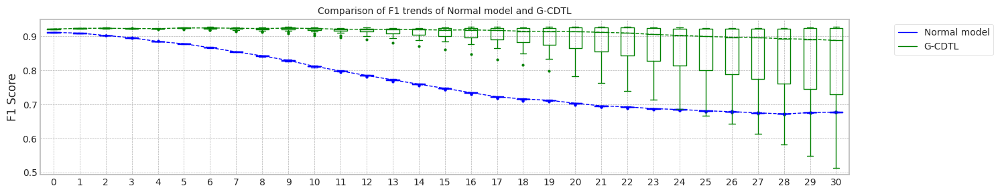

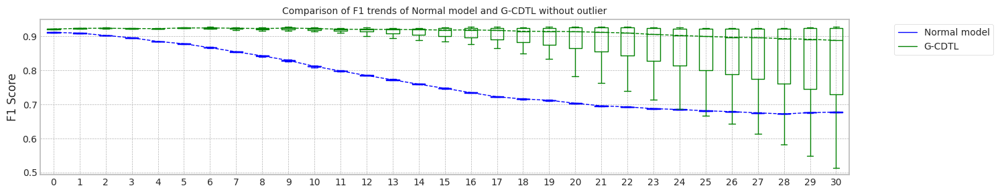

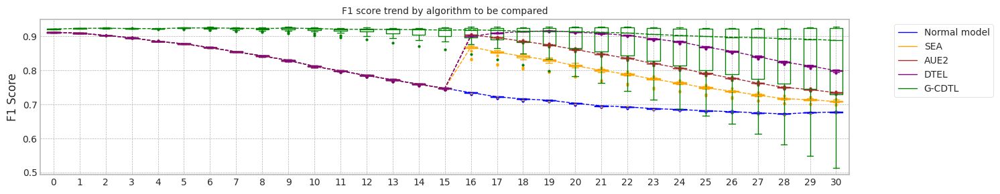

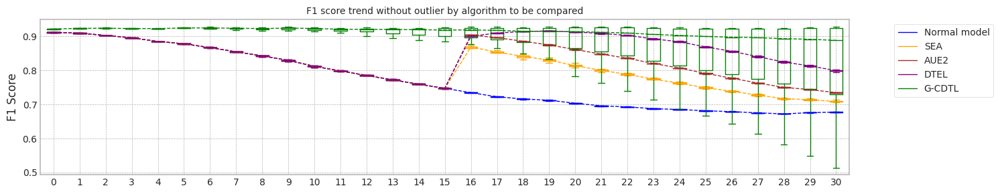

max_mean_trial= 8


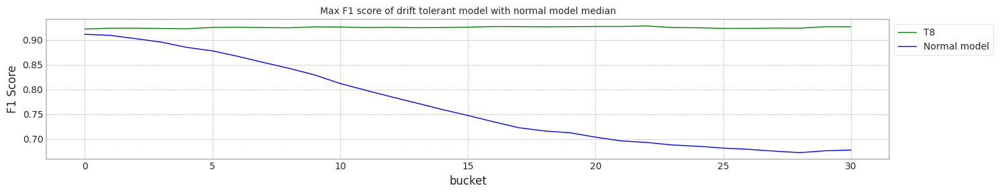

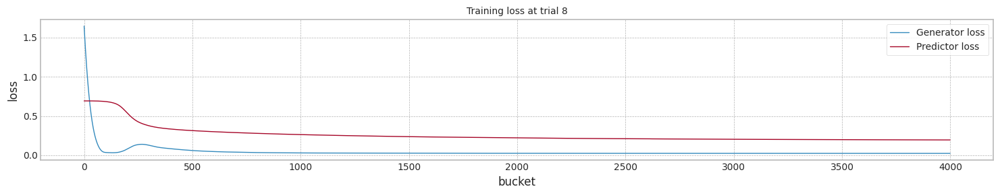

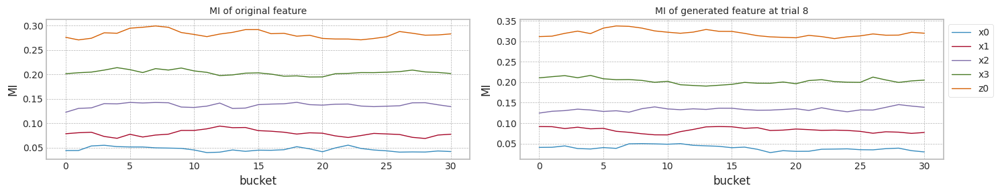

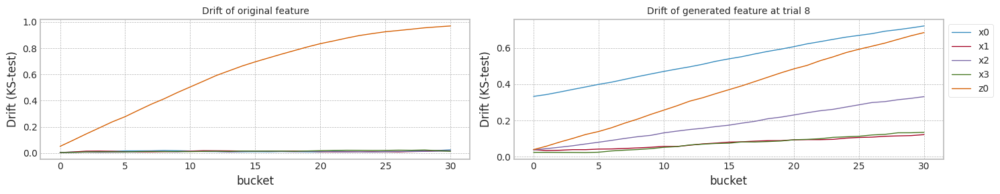

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.769416,0.677622,5.942772
1,1.0,0.911695,0.909460,0.769608,0.677522,5.934372
2,2.0,0.911615,0.909382,0.769620,0.677672,5.904821
3,3.0,0.912030,0.909577,0.770133,0.677773,5.895718
4,4.0,0.912125,0.909945,0.768040,0.676771,6.002373
5,5.0,0.911771,0.909693,0.769363,0.677472,6.037335
6,6.0,0.911439,0.909441,0.770354,0.677672,5.936779
7,7.0,0.911870,0.909518,0.770347,0.678828,5.938976
8,8.0,0.912010,0.909926,0.770422,0.677773,5.944284
9,9.0,0.911755,0.909752,0.770419,0.677823,5.861111


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.811058,0.708569,8.141429
1,1.0,0.911695,0.909460,0.810163,0.706873,8.634263
2,2.0,0.911615,0.909382,0.798049,0.698139,8.760943
3,3.0,0.912030,0.909577,0.810259,0.707583,7.459023
4,4.0,0.912125,0.909945,0.811465,0.708240,7.344744
5,5.0,0.911771,0.909693,0.810511,0.707638,7.831341
6,6.0,0.911439,0.909441,0.811727,0.708843,7.301532
7,7.0,0.911870,0.909518,0.809860,0.713339,10.693957
8,8.0,0.912010,0.909926,0.811504,0.708788,8.355129
9,9.0,0.911755,0.909752,0.812204,0.710218,8.283423


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.830127,0.734527,7.778638
1,1.0,0.911695,0.909460,0.830601,0.735058,8.438200
2,2.0,0.911615,0.909382,0.830135,0.734232,8.800546
3,3.0,0.912030,0.909577,0.830907,0.735176,7.796826
4,4.0,0.912125,0.909945,0.827097,0.730539,8.377665
5,5.0,0.911771,0.909693,0.830177,0.734527,7.617039
6,6.0,0.911439,0.909441,0.832606,0.737147,10.753004
7,7.0,0.911870,0.909518,0.829452,0.732938,10.666202
8,8.0,0.912010,0.909926,0.830982,0.734999,7.739697
9,9.0,0.911755,0.909752,0.831007,0.734779,7.510737


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912186,0.910003,0.857751,0.799685,12.386713
1,1.0,0.911695,0.909460,0.857911,0.797869,14.615785
2,2.0,0.911615,0.909382,0.857872,0.799475,12.346710
3,3.0,0.912030,0.909577,0.858598,0.801334,14.662641
4,4.0,0.912125,0.909945,0.856563,0.796548,12.521129
5,5.0,0.911771,0.909693,0.857788,0.799265,12.504663
6,6.0,0.911439,0.909441,0.858717,0.800315,11.688356
7,7.0,0.911870,0.909518,0.857543,0.798881,12.213582
8,8.0,0.912010,0.909926,0.858638,0.800315,12.762361
9,9.0,0.911755,0.909752,0.857011,0.793229,14.351590


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.921035,0.923334,0.807689,0.514508,5.938620
1,1.0,0.922296,0.924493,0.924068,0.923640,6.010927
2,2.0,0.921027,0.923213,0.850624,0.608972,5.984391
3,3.0,0.921554,0.922720,0.902123,0.845906,6.017678
4,4.0,0.920786,0.922889,0.922999,0.924335,6.094343
5,5.0,0.922025,0.923929,0.924367,0.925573,5.970271
6,6.0,0.920835,0.922974,0.828679,0.537394,5.996682
7,7.0,0.922058,0.924000,0.864925,0.740356,5.968496
8,8.0,0.922297,0.924014,0.925541,0.926921,5.923118
9,9.0,0.920495,0.921882,0.846057,0.611380,5.980159


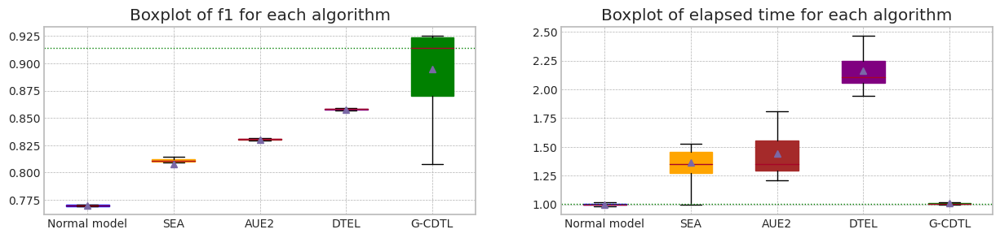

In [46]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.9,trial_count=20,weight_init=True)


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [47]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+5*(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02121, Mean 0.06553, Std 0.04745
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


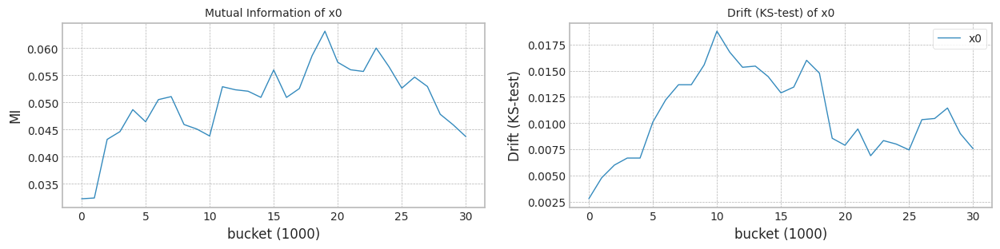

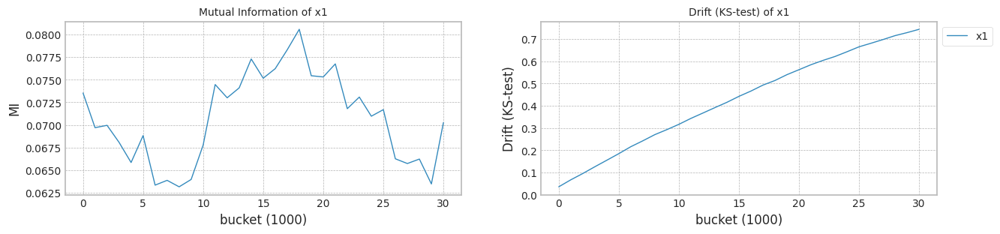

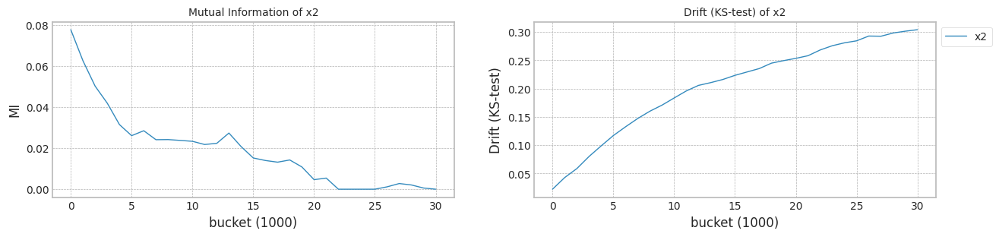

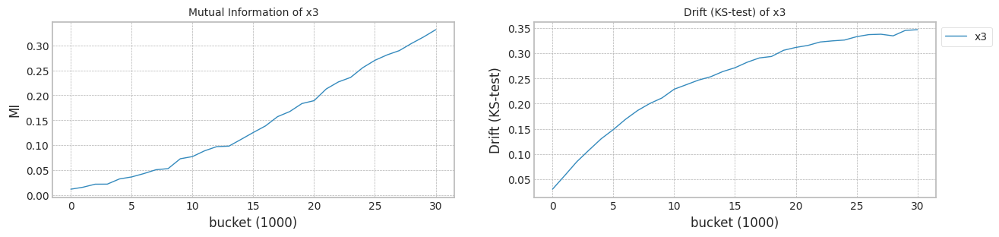

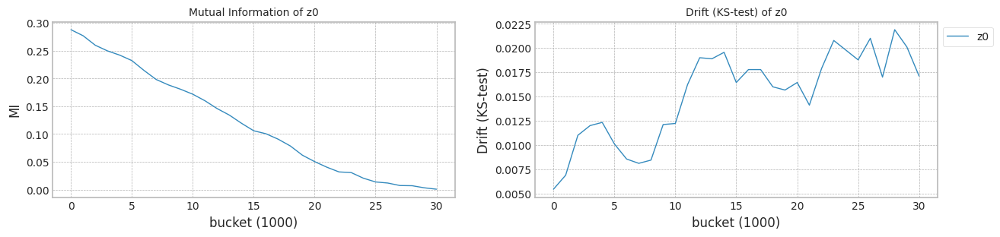

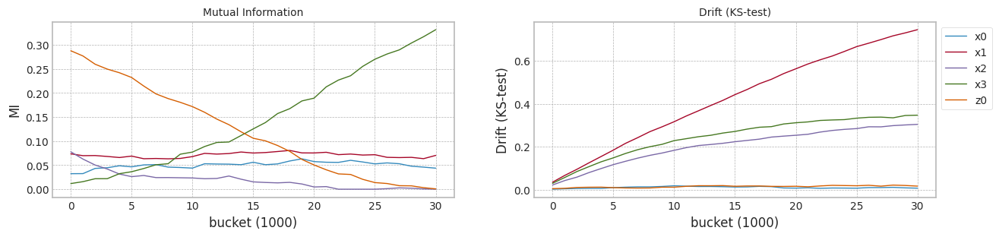

In [48]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [49]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


In [51]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=alpha,trial_count=20,lr_g=0.0001,weight_init=False,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 20
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.67it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.42it/s]


Test f1 score: 0.8887844317006676
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.049387
x1    0.394867
x2    0.245566
x3    0.226932
z0    0.124047
dtype: float64
Mean F1 for all data: 0.6705207257703759
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6705207257703759
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.32it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.55it/s]


Test f1 score: 0.8889878831076266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.051194
x1    0.399143
x2    0.228090
x3    0.244778
z0    0.151832
dtype: float64
Mean F1 for all data: 0.741443317072187
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.7059820214212815
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.14it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.21it/s]


Test f1 score: 0.8938658032020147
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.060556
x1    0.399520
x2    0.183767
x3    0.245867
z0    0.149570
dtype: float64
Mean F1 for all data: 0.7526501662576436
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.741443317072187
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.03it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.63it/s]


Test f1 score: 0.8902656528677367
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.052907
x1    0.394986
x2    0.234484
x3    0.228731
z0    0.142351
dtype: float64
Mean F1 for all data: 0.6703523963567167
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7059820214212815
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.90it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.26it/s]


Test f1 score: 0.8852581458313883
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.048394
x1    0.396133
x2    0.240194
x3    0.228609
z0    0.148950
dtype: float64
Mean F1 for all data: 0.6621039301819412
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6705207257703759
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.89it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.25it/s]


Test f1 score: 0.8868049635313062
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.054473
x1    0.399742
x2    0.223670
x3    0.218491
z0    0.087405
dtype: float64
Mean F1 for all data: 0.6607712819316053
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.6704365610635463
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.97it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.96it/s]


Test f1 score: 0.8786000729128691
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.041108
x1    0.391527
x2    0.234366
x3    0.237487
z0    0.126849
dtype: float64
Mean F1 for all data: 0.6621198403000285
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6703523963567167
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.71it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.31it/s]


Test f1 score: 0.8884744498321522
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.053172
x1    0.394280
x2    0.231448
x3    0.233093
z0    0.144864
dtype: float64
Mean F1 for all data: 0.6664118043854994
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6683821003711081
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.05it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.37it/s]


Test f1 score: 0.8979630687226348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.062577
x1    0.396387
x2    0.243419
x3    0.234186
z0    0.133344
dtype: float64
Mean F1 for all data: 0.6955659750250007
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6703523963567167
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.95it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.96it/s]


Test f1 score: 0.8820190553415771
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.039538
x1    0.421065
x2    0.229265
x3    0.237412
z0    0.074011
dtype: float64
Mean F1 for all data: 0.67428935858418
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6704365610635463
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.56it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.13it/s]


Test f1 score: 0.8990999526290858
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.059254
x1    0.396588
x2    0.233154
x3    0.238846
z0    0.162122
dtype: float64
Mean F1 for all data: 0.70629442635826
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.6705207257703759
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.58it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.19it/s]


Test f1 score: 0.8917149093669926
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.056674
x1    0.403427
x2    0.218237
x3    0.226168
z0    0.142405
dtype: float64
Mean F1 for all data: 0.6736804603888329
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.6721005930796045
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.65it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.60it/s]


Test f1 score: 0.8602933737986849
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.026652
x1    0.415559
x2    0.222502
x3    0.234007
z0    0.065061
dtype: float64
Mean F1 for all data: 0.6159388920901029
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.6705207257703759
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.14it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.01it/s]


Test f1 score: 0.8875128998968009
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.050444
x1    0.396939
x2    0.239000
x3    0.226663
z0    0.140072
dtype: float64
Mean F1 for all data: 0.6608490046329225
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6704365610635463
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.34it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.11it/s]


Test f1 score: 0.8959515701853954
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.051778
x1    0.397140
x2    0.166294
x3    0.238975
z0    0.134290
dtype: float64
Mean F1 for all data: 0.6974908193894367
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6705207257703759
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.83it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.60it/s]


Test f1 score: 0.8937783119164279
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.048251
x1    0.393204
x2    0.200892
x3    0.240434
z0    0.140685
dtype: float64
Mean F1 for all data: 0.701222630320086
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.6721005930796045
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.41it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.67it/s]


Test f1 score: 0.8980559506875296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.056914
x1    0.399129
x2    0.240165
x3    0.234892
z0    0.079774
dtype: float64
Mean F1 for all data: 0.7087144275583671
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.6736804603888329
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.45it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.11it/s]


Test f1 score: 0.8957485086639523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.055692
x1    0.400061
x2    0.232652
x3    0.236545
z0    0.140265
dtype: float64
Mean F1 for all data: 0.6916430348146382
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.6739849094865065
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.40it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.76it/s]


Test f1 score: 0.8902439024390244
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.052000
x1    0.394204
x2    0.234896
x3    0.233487
z0    0.132398
dtype: float64
Mean F1 for all data: 0.6701605733583466
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.6736804603888329
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.76it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.36it/s]


Test f1 score: 0.8993928070994862
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.051305
x1    0.402846
x2    0.235186
x3    0.240491
z0    0.120111
dtype: float64
Mean F1 for all data: 0.7135116620492847
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.6739849094865065


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.995879
1,1,0.881343,0.869811,0.666281,0.477207,5.983824
2,2,0.889227,0.883180,0.729075,0.554807,6.001876
3,3,0.884945,0.878742,0.739687,0.598738,5.945462
4,4,0.887107,0.875389,0.680769,0.497140,5.976854
5,5,0.884788,0.877346,0.715875,0.541218,5.977231
6,6,0.859796,0.847444,0.622608,0.413468,5.956157
7,7,0.890730,0.880267,0.689709,0.514373,5.924351
8,8,0.901424,0.892478,0.724528,0.559178,5.984826
9,9,0.879461,0.867450,0.669079,0.487057,5.964487


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.888784,0.879084,0.670521,0.463852,5.919389
1,1,0.888988,0.881944,0.741443,0.586121,5.926928
2,2,0.893866,0.887352,0.752650,0.609583,6.148121
3,3,0.890266,0.880952,0.670352,0.455117,6.008522
4,4,0.885258,0.874604,0.662104,0.454164,5.954697
5,5,0.886805,0.877565,0.660771,0.441519,6.006006
6,6,0.878600,0.866945,0.662120,0.474320,5.873217
7,7,0.888474,0.878548,0.666412,0.443702,6.028337
8,8,0.897963,0.888994,0.695566,0.485308,5.988869
9,9,0.882019,0.871281,0.674289,0.465688,5.946859


trial_count: 20
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.58it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.72it/s]


Test f1 score: 0.8948669201520912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.077591
x1    0.377240
x2    0.208556
x3    0.187710
z0    0.198125
dtype: float64
Mean F1 for all data: 0.6846114340125677
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6846114340125677
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.38it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.73it/s]


Test f1 score: 0.8996677740863788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.120706
x1    0.386889
x2    0.263609
x3    0.214452
z0    0.191430
dtype: float64
Mean F1 for all data: 0.6856419093640177
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.6851266716882927
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.08it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.77it/s]


Test f1 score: 0.893196847540538
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.088495
x1    0.383168
x2    0.169763
x3    0.239075
z0    0.228692
dtype: float64
Mean F1 for all data: 0.7352674605603522
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6856419093640177
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.87it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.89it/s]


Test f1 score: 0.8942935554083468
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.083297
x1    0.376226
x2    0.248036
x3    0.198430
z0    0.166749
dtype: float64
Mean F1 for all data: 0.6882909470995578
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.6869664282317878
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.75it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.17it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.50it/s]


Test f1 score: 0.8935325264750379
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.076384
x1    0.380900
x2    0.295710
x3    0.199244
z0    0.197075
dtype: float64
Mean F1 for all data: 0.6768302598933784
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6856419093640177
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.89it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.88it/s]


Test f1 score: 0.8987003058103976
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.082573
x1    0.382993
x2    0.199072
x3    0.214627
z0    0.125118
dtype: float64
Mean F1 for all data: 0.716336239151923
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.6869664282317878
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.85it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.17it/s]


Test f1 score: 0.8885801611558767
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.070828
x1    0.367749
x2    0.235756
x3    0.222272
z0    0.194477
dtype: float64
Mean F1 for all data: 0.6779978253031266
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6856419093640177
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.37it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.50it/s]


Test f1 score: 0.8960756501182034
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.083935
x1    0.374165
x2    0.271921
x3    0.199280
z0    0.195466
dtype: float64
Mean F1 for all data: 0.6773040148523715
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6851266716882927
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.39it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.88it/s]


Test f1 score: 0.9001053538933051
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.078043
x1    0.380789
x2    0.201011
x3    0.184527
z0    0.186541
dtype: float64
Mean F1 for all data: 0.6982444338129096
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6856419093640177
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.68it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.67it/s]


Test f1 score: 0.8815471394037067
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.091373
x1    0.424104
x2    0.249466
x3    0.215405
z0    0.095939
dtype: float64
Mean F1 for all data: 0.6663888057397832
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6851266716882927
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.52it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.45it/s]


Test f1 score: 0.8997424401411809
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.087516
x1    0.379925
x2    0.177706
x3    0.198129
z0    0.233509
dtype: float64
Mean F1 for all data: 0.689554303895286
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.6856419093640177
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.06it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.45it/s]


Test f1 score: 0.8987947197245074
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.082971
x1    0.388971
x2    0.257047
x3    0.179165
z0    0.189240
dtype: float64
Mean F1 for all data: 0.6790239909189313
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.6851266716882927
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.02it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.19it/s]


Test f1 score: 0.8690548471969237
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.052412
x1    0.412878
x2    0.186484
x3    0.208760
z0    0.108645
dtype: float64
Mean F1 for all data: 0.6286876520100404
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.6846114340125677
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.71it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.90it/s]


Test f1 score: 0.8946869070208728
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.078272
x1    0.378430
x2    0.209943
x3    0.191935
z0    0.199108
dtype: float64
Mean F1 for all data: 0.6695498369063649
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.6818177124657495
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.34it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.59it/s]


Test f1 score: 0.8960989533777355
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.060025
x1    0.386355
x2    0.183663
x3    0.200627
z0    0.186921
dtype: float64
Mean F1 for all data: 0.6892436800688021
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.6846114340125677
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.86it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.98it/s]


Test f1 score: 0.8966876231584873
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.079631
x1    0.373563
x2    0.146251
x3    0.223993
z0    0.211857
dtype: float64
Mean F1 for all data: 0.6954090962767069
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.6851266716882927
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.78it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.94it/s]


Test f1 score: 0.897533932326515
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.082455
x1    0.388427
x2    0.190771
x3    0.189211
z0    0.086380
dtype: float64
Mean F1 for all data: 0.7069802047827358
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.6856419093640177
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.35it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.67it/s]


Test f1 score: 0.8975777226778562
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.085100
x1    0.388190
x2    0.235000
x3    0.197638
z0    0.163011
dtype: float64
Mean F1 for all data: 0.6810859538353005
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.6851266716882927
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.69it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.76it/s]


Test f1 score: 0.8962443095599392
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.084197
x1    0.373391
x2    0.234161
x3    0.207333
z0    0.162262
dtype: float64
Mean F1 for all data: 0.6826232472607556
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.6846114340125677
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.62it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.15it/s]


Test f1 score: 0.8991153773762469
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.079663
x1    0.400735
x2    0.193305
x3    0.216624
z0    0.173925
dtype: float64
Mean F1 for all data: 0.6996035553041449
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.6851266716882927


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.929198
1,1,0.881343,0.869811,0.666281,0.477207,6.016375
2,2,0.889227,0.883180,0.729075,0.554807,5.881957
3,3,0.884945,0.878742,0.739687,0.598738,5.834922
4,4,0.887107,0.875389,0.680769,0.497140,6.047381
5,5,0.884788,0.877346,0.715875,0.541218,5.872253
6,6,0.859796,0.847444,0.622608,0.413468,5.912817
7,7,0.890730,0.880267,0.689709,0.514373,6.105516
8,8,0.901424,0.892478,0.724528,0.559178,5.780486
9,9,0.879461,0.867450,0.669079,0.487057,5.918432


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894867,0.885427,0.684611,0.465502,5.969521
1,1,0.899668,0.890766,0.685642,0.443125,5.977754
2,2,0.893197,0.886152,0.735267,0.571823,5.865278
3,3,0.894294,0.886133,0.688291,0.482751,5.827859
4,4,0.893533,0.883866,0.676830,0.452985,5.899355
5,5,0.898700,0.890522,0.716336,0.532077,5.928224
6,6,0.888580,0.878410,0.677998,0.473986,5.935444
7,7,0.896076,0.886389,0.677304,0.440330,5.876838
8,8,0.900105,0.890911,0.698244,0.483021,5.944165
9,9,0.881547,0.870650,0.666389,0.445014,5.910504


trial_count: 20
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.20it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.38it/s]


Test f1 score: 0.9029358324567276
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.101566
x1    0.363240
x2    0.207996
x3    0.231792
z0    0.225513
dtype: float64
Mean F1 for all data: 0.7213931852099499
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7213931852099499
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.54it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.91it/s]


Test f1 score: 0.9064143007360672
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.175731
x1    0.382950
x2    0.317814
x3    0.267996
z0    0.203731
dtype: float64
Mean F1 for all data: 0.7009847522723894
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.7111889687411697
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.93it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.88it/s]


Test f1 score: 0.8944907874232285
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.118355
x1    0.364355
x2    0.134280
x3    0.200437
z0    0.278161
dtype: float64
Mean F1 for all data: 0.7120461255325017
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7120461255325017
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.12it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.41it/s]


Test f1 score: 0.9007227082540891
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.107681
x1    0.360925
x2    0.258703
x3    0.234287
z0    0.177240
dtype: float64
Mean F1 for all data: 0.7164842009887096
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7142651632606056
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.33it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.86it/s]


Test f1 score: 0.9014459665144596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.100115
x1    0.372885
x2    0.343122
x3    0.190054
z0    0.229405
dtype: float64
Mean F1 for all data: 0.7009621184171686
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7120461255325017
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.45it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.99it/s]


Test f1 score: 0.907032524225271
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.103244
x1    0.371767
x2    0.243427
x3    0.402373
z0    0.175305
dtype: float64
Mean F1 for all data: 0.7474528373220884
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.7142651632606056
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.07it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.56it/s]


Test f1 score: 0.8544330595308662
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.10it/s]


mean of drift:
x0    0.101341
x1    0.347792
x2    0.258699
x3    0.230552
z0    0.213857
dtype: float64
Mean F1 for all data: 0.6958990613951855
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7120461255325017
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.74it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.31it/s]


Test f1 score: 0.9039763516735004
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.108405
x1    0.361090
x2    0.292939
x3    0.235226
z0    0.232025
dtype: float64
Mean F1 for all data: 0.7118502285611503
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.711948177046826
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 669.88it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.22it/s]


Test f1 score: 0.908670520231214
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.085373
x1    0.372523
x2    0.169229
x3    0.443104
z0    0.140165
dtype: float64
Mean F1 for all data: 0.7540678665086065
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7120461255325017
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.93it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.04it/s]


Test f1 score: 0.8870141608918348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.142348
x1    0.429903
x2    0.208419
x3    0.181437
z0    0.113832
dtype: float64
Mean F1 for all data: 0.684476820787164
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.711948177046826
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.43it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.57it/s]


Test f1 score: 0.9062950504565113
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.101247
x1    0.367204
x2    0.194115
x3    0.461491
z0    0.237767
dtype: float64
Mean F1 for all data: 0.7293067979755229
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7120461255325017
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.73it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.94it/s]


Test f1 score: 0.90840869732538
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.101237
x1    0.380480
x2    0.313749
x3    0.359462
z0    0.208197
dtype: float64
Mean F1 for all data: 0.7004812373508685
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.711948177046826
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.00it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.38it/s]


Test f1 score: 0.8787663589327381
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.083584
x1    0.408427
x2    0.151950
x3    0.180341
z0    0.140685
dtype: float64
Mean F1 for all data: 0.6541355282247943
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7118502285611503
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.94it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.03it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.68it/s]


Test f1 score: 0.9047619047619048
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.100477
x1    0.365183
x2    0.316387
x3    0.280946
z0    0.233860
dtype: float64
Mean F1 for all data: 0.7145171395260224
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.711948177046826
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.33it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.69it/s]


Test f1 score: 0.9075872680065391
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.067204
x1    0.383262
x2    0.200760
x3    0.323229
z0    0.198961
dtype: float64
Mean F1 for all data: 0.7364540589234351
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7120461255325017
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.77it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.57it/s]


Test f1 score: 0.9006635071090048
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.108405
x1    0.356781
x2    0.096699
x3    0.191254
z0    0.261652
dtype: float64
Mean F1 for all data: 0.7024214080986682
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.711948177046826
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.58it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.90it/s]


Test f1 score: 0.9061631362024346
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.17it/s]


mean of drift:
x0    0.097190
x1    0.396305
x2    0.131523
x3    0.476140
z0    0.083283
dtype: float64
Mean F1 for all data: 0.7507893470849679
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7120461255325017
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.98it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.24it/s]


Test f1 score: 0.9055337105591253
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.105652
x1    0.376556
x2    0.270355
x3    0.273771
z0    0.206828
dtype: float64
Mean F1 for all data: 0.701373537280601
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.711948177046826
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.50it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.92it/s]


Test f1 score: 0.9045515652006914
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.110061
x1    0.363842
x2    0.163312
x3    0.193125
z0    0.158265
dtype: float64
Mean F1 for all data: 0.7164394254641246
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7120461255325017
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.09it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.64it/s]


Test f1 score: 0.9027001421127427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.095545
x1    0.400004
x2    0.155946
x3    0.312943
z0    0.198118
dtype: float64
Mean F1 for all data: 0.7206407285508608
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.713281632529262


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.832642
1,1,0.881343,0.869811,0.666281,0.477207,5.856786
2,2,0.889227,0.883180,0.729075,0.554807,5.868719
3,3,0.884945,0.878742,0.739687,0.598738,5.884136
4,4,0.887107,0.875389,0.680769,0.497140,5.898678
5,5,0.884788,0.877346,0.715875,0.541218,5.867929
6,6,0.859796,0.847444,0.622608,0.413468,5.873108
7,7,0.890730,0.880267,0.689709,0.514373,5.901429
8,8,0.901424,0.892478,0.724528,0.559178,5.834127
9,9,0.879461,0.867450,0.669079,0.487057,6.000904


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.902936,0.894455,0.721393,0.520516,5.886063
1,1,0.906414,0.898565,0.700985,0.447994,5.926250
2,2,0.894491,0.886424,0.712046,0.509284,5.978483
3,3,0.900723,0.893540,0.716484,0.527237,6.043183
4,4,0.901446,0.892527,0.700962,0.478897,6.005990
5,5,0.907033,0.899415,0.747453,0.584329,5.853152
6,6,0.854433,0.848480,0.695899,0.527677,6.125378
7,7,0.903976,0.895756,0.711850,0.492300,5.952111
8,8,0.908671,0.901417,0.754068,0.587888,5.980301
9,9,0.887014,0.876591,0.684477,0.466089,5.894065


trial_count: 20
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.35it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.57it/s]


Test f1 score: 0.9094393866794441
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.124910
x1    0.354082
x2    0.256857
x3    0.571043
z0    0.242713
dtype: float64
Mean F1 for all data: 0.7655345573668866
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7655345573668866
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.20it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.71it/s]


Test f1 score: 0.9124724379254148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.204290
x1    0.376233
x2    0.179384
x3    0.599928
z0    0.231301
dtype: float64
Mean F1 for all data: 0.7375629147237364
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.7515487360453115
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.74it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 244.18it/s]


Test f1 score: 0.9031721076482013
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.11it/s]


mean of drift:
x0    0.121681
x1    0.350925
x2    0.302907
x3    0.425860
z0    0.251943
dtype: float64
Mean F1 for all data: 0.7562999521584832
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7562999521584832
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.39it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.04it/s]


Test f1 score: 0.9062261268143621
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.132355
x1    0.348455
x2    0.258254
x3    0.529541
z0    0.196115
dtype: float64
Mean F1 for all data: 0.7478638024110221
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7520818772847526
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.47it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.05it/s]


Test f1 score: 0.9066768554780782
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.123516
x1    0.367659
x2    0.393746
x3    0.527495
z0    0.251659
dtype: float64
Mean F1 for all data: 0.7275729868444941
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7478638024110221
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.09it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.53it/s]


Test f1 score: 0.9124592052217316
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.127763
x1    0.360803
x2    0.327097
x3    0.581509
z0    0.197914
dtype: float64
Mean F1 for all data: 0.7962601746950535
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.7520818772847526
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.10it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.96it/s]


Test f1 score: 0.8648927038626609
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.142276
x1    0.334720
x2    0.278108
x3    0.220778
z0    0.250624
dtype: float64
Mean F1 for all data: 0.7108370018776318
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7478638024110221
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.11it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.97it/s]


Test f1 score: 0.910013402259238
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.123760
x1    0.355455
x2    0.311975
x3    0.589484
z0    0.189534
dtype: float64
Mean F1 for all data: 0.7690375916841103
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7520818772847526
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.28it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.73it/s]


Test f1 score: 0.9138114081652351
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.102688
x1    0.363695
x2    0.250495
x3    0.486545
z0    0.147681
dtype: float64
Mean F1 for all data: 0.7916689314460467
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7562999521584832
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.92it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.69it/s]


Test f1 score: 0.8944673159955819
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.169265
x1    0.423842
x2    0.214803
x3    0.158778
z0    0.125703
dtype: float64
Mean F1 for all data: 0.7155489632861654
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7520818772847526
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.56it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.56it/s]


Test f1 score: 0.9114678458137075
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.114111
x1    0.354115
x2    0.247656
x3    0.616136
z0    0.250814
dtype: float64
Mean F1 for all data: 0.7776091300997118
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7562999521584832
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.08it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.72it/s]


Test f1 score: 0.9130896112665188
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.121437
x1    0.368183
x2    0.371487
x3    0.554072
z0    0.233018
dtype: float64
Mean F1 for all data: 0.7251435036067839
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.7520818772847526
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.38it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.71it/s]


Test f1 score: 0.9063214013709063
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.98it/s]


mean of drift:
x0    0.162814
x1    0.370480
x2    0.323129
x3    0.361749
z0    0.213817
dtype: float64
Mean F1 for all data: 0.722171515456517
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7478638024110221
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.43it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.53it/s]


Test f1 score: 0.909806179236231
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.120892
x1    0.349563
x2    0.399147
x3    0.590982
z0    0.259333
dtype: float64
Mean F1 for all data: 0.7540915309992823
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7509776667051522
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.55it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.63it/s]


Test f1 score: 0.9148033924441018
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.069968
x1    0.386588
x2    0.200294
x3    0.534211
z0    0.198749
dtype: float64
Mean F1 for all data: 0.807320287039897
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7540915309992823
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.34it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.29it/s]


Test f1 score: 0.9057466882683693
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.132878
x1    0.343921
x2    0.152104
x3    0.385667
z0    0.232735
dtype: float64
Mean F1 for all data: 0.7396094946549854
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.7509776667051522
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.32it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.73it/s]


Test f1 score: 0.912176414189837
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.110075
x1    0.377047
x2    0.153305
x3    0.598910
z0    0.090649
dtype: float64
Mean F1 for all data: 0.7854011960327002
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7540915309992823
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.40it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.42it/s]


Test f1 score: 0.9117533718689788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.122437
x1    0.368237
x2    0.323566
x3    0.533699
z0    0.229190
dtype: float64
Mean F1 for all data: 0.7504080506652788
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.7522497908322805
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.37it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.52it/s]


Test f1 score: 0.9102958125240108
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.136229
x1    0.348634
x2    0.174918
x3    0.563720
z0    0.165835
dtype: float64
Mean F1 for all data: 0.7458896524426338
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.7504080506652788
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.25it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.44it/s]


Test f1 score: 0.9101648089930456
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.107061
x1    0.380165
x2    0.114326
x3    0.542430
z0    0.218638
dtype: float64
Mean F1 for all data: 0.7561246316318101
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.7522497908322805


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.953309
1,1,0.881343,0.869811,0.666281,0.477207,6.013213
2,2,0.889227,0.883180,0.729075,0.554807,6.061992
3,3,0.884945,0.878742,0.739687,0.598738,6.025217
4,4,0.887107,0.875389,0.680769,0.497140,5.961938
5,5,0.884788,0.877346,0.715875,0.541218,6.058235
6,6,0.859796,0.847444,0.622608,0.413468,6.012101
7,7,0.890730,0.880267,0.689709,0.514373,5.966500
8,8,0.901424,0.892478,0.724528,0.559178,6.184127
9,9,0.879461,0.867450,0.669079,0.487057,5.947141


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.909439,0.901581,0.765535,0.620057,5.999913
1,1,0.912472,0.906628,0.737563,0.498186,5.988601
2,2,0.903172,0.896335,0.756300,0.595074,6.107787
3,3,0.906226,0.899293,0.747864,0.583644,5.977995
4,4,0.906677,0.898556,0.727573,0.518019,6.047286
5,5,0.912459,0.906995,0.796260,0.674624,6.035587
6,6,0.864893,0.858810,0.710837,0.540349,6.025430
7,7,0.910013,0.902941,0.769038,0.618207,6.018879
8,8,0.913811,0.907930,0.791669,0.653216,6.031026
9,9,0.894467,0.884608,0.715549,0.510609,6.067089


trial_count: 20
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.56it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.98it/s]


Test f1 score: 0.9119677790563867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.154914
x1    0.344387
x2    0.236480
x3    0.389480
z0    0.278122
dtype: float64
Mean F1 for all data: 0.7974627023412202
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7974627023412202
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.99it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.39it/s]


Test f1 score: 0.9151404736791638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.075075
x1    0.368591
x2    0.340498
x3    0.513634
z0    0.240269
dtype: float64
Mean F1 for all data: 0.7738792572954674
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.7856709798183438
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.54it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.52it/s]


Test f1 score: 0.9064148847542348
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.129921
x1    0.352437
x2    0.306036
x3    0.572638
z0    0.231921
dtype: float64
Mean F1 for all data: 0.788319836461418
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.788319836461418
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.10it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.62it/s]


Test f1 score: 0.9094905858740323
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.156556
x1    0.341602
x2    0.292670
x3    0.504154
z0    0.223244
dtype: float64
Mean F1 for all data: 0.7742007348636666
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7812602856625424
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.57it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.94it/s]


Test f1 score: 0.9106080951467486
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.146258
x1    0.365659
x2    0.446480
x3    0.619864
z0    0.269523
dtype: float64
Mean F1 for all data: 0.7559811507412111
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7742007348636666
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.24it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.08it/s]


Test f1 score: 0.9155887707195554
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.148473
x1    0.351627
x2    0.369140
x3    0.265197
z0    0.195867
dtype: float64
Mean F1 for all data: 0.7979207312160911
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.7812602856625424
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.56it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 245.18it/s]


Test f1 score: 0.8707612456747404
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.177624
x1    0.323412
x2    0.292362
x3    0.219907
z0    0.285935
dtype: float64
Mean F1 for all data: 0.733442010292884
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7742007348636666
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.41it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.71it/s]


Test f1 score: 0.9142747432082173
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.147258
x1    0.342892
x2    0.339405
x3    0.331595
z0    0.217935
dtype: float64
Mean F1 for all data: 0.8081006889926299
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7812602856625424
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.09it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.78it/s]


Test f1 score: 0.9179004037685061
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.13it/s]


mean of drift:
x0    0.120459
x1    0.357097
x2    0.296297
x3    0.287513
z0    0.163993
dtype: float64
Mean F1 for all data: 0.8152149867084527
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.788319836461418
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.36it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.60it/s]


Test f1 score: 0.901732946008214
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.189968
x1    0.414065
x2    0.308946
x3    0.351194
z0    0.167172
dtype: float64
Mean F1 for all data: 0.7440586233614567
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7812602856625424
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.95it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.64it/s]


Test f1 score: 0.9163131507905902
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.131491
x1    0.351695
x2    0.281387
x3    0.435882
z0    0.146201
dtype: float64
Mean F1 for all data: 0.8162086749069849
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.788319836461418
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.75it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.35it/s]


Test f1 score: 0.9161924968656573
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.143538
x1    0.356853
x2    0.435964
x3    0.435577
z0    0.253606
dtype: float64
Mean F1 for all data: 0.7500113526365811
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.7812602856625424
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.93it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.12it/s]


Test f1 score: 0.911140836995987
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.199133
x1    0.361810
x2    0.327817
x3    0.604387
z0    0.231520
dtype: float64
Mean F1 for all data: 0.7740291216705003
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7742007348636666
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.56it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.89it/s]


Test f1 score: 0.9143845488613435
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.139889
x1    0.343638
x2    0.459398
x3    0.429814
z0    0.265832
dtype: float64
Mean F1 for all data: 0.789748748774687
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7812602856625424
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.24it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.61it/s]


Test f1 score: 0.918111753371869
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.086014
x1    0.380222
x2    0.238928
x3    0.249183
z0    0.221735
dtype: float64
Mean F1 for all data: 0.8445690369443252
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.788319836461418
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.88it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.37it/s]


Test f1 score: 0.9097500477008205
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.155957
x1    0.334398
x2    0.186756
x3    0.549803
z0    0.257014
dtype: float64
Mean F1 for all data: 0.7706734281491207
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.7812602856625424
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 642.67it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.56it/s]


Test f1 score: 0.9149487007383258
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.130297
x1    0.371588
x2    0.286573
x3    0.406527
z0    0.102695
dtype: float64
Mean F1 for all data: 0.813685043079125
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.788319836461418
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.27it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.26it/s]


Test f1 score: 0.9161041465766636
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.116548
x1    0.360527
x2    0.325269
x3    0.435129
z0    0.248502
dtype: float64
Mean F1 for all data: 0.8009935663913643
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.7890342926180525
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.97it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.64it/s]


Test f1 score: 0.9137582924718777
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.157946
x1    0.334857
x2    0.237194
x3    0.431746
z0    0.220487
dtype: float64
Mean F1 for all data: 0.7688000516452209
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.788319836461418
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.16it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.11it/s]


Test f1 score: 0.9140401146131806
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.101272
x1    0.381136
x2    0.101405
x3    0.516609
z0    0.236627
dtype: float64
Mean F1 for all data: 0.7883408641980514
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.7883303503297348


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,6.007405
1,1,0.881343,0.869811,0.666281,0.477207,5.863384
2,2,0.889227,0.883180,0.729075,0.554807,5.960860
3,3,0.884945,0.878742,0.739687,0.598738,5.970063
4,4,0.887107,0.875389,0.680769,0.497140,6.007726
5,5,0.884788,0.877346,0.715875,0.541218,5.960639
6,6,0.859796,0.847444,0.622608,0.413468,6.052390
7,7,0.890730,0.880267,0.689709,0.514373,5.886171
8,8,0.901424,0.892478,0.724528,0.559178,5.857083
9,9,0.879461,0.867450,0.669079,0.487057,5.930360


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.911968,0.906160,0.797463,0.689920,6.000015
1,1,0.915140,0.910157,0.773879,0.591567,6.024762
2,2,0.906415,0.900435,0.788320,0.653359,5.958954
3,3,0.909491,0.903294,0.774201,0.634584,6.018289
4,4,0.910608,0.903883,0.755981,0.567955,5.983837
5,5,0.915589,0.910591,0.797921,0.662087,6.179664
6,6,0.870761,0.864753,0.733442,0.577676,5.927108
7,7,0.914275,0.908759,0.808101,0.694377,5.916050
8,8,0.917900,0.911892,0.815215,0.702097,6.085400
9,9,0.901733,0.893792,0.744059,0.553593,5.913705


trial_count: 20
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.35it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.59it/s]


Test f1 score: 0.915221764536833
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.199115
x1    0.336484
x2    0.224341
x3    0.289792
z0    0.225935
dtype: float64
Mean F1 for all data: 0.8115897173764492
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8115897173764492
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.64it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.45it/s]


Test f1 score: 0.9188156638013372
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.181731
x1    0.357946
x2    0.422007
x3    0.337953
z0    0.252996
dtype: float64
Mean F1 for all data: 0.7982116806581255
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.8049006990172873
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.47it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.9085857182550708
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.147186
x1    0.336154
x2    0.303491
x3    0.327685
z0    0.243423
dtype: float64
Mean F1 for all data: 0.7985601571109593
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7985601571109593
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.00it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.63it/s]


Test f1 score: 0.9142472601422804
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.181685
x1    0.328186
x2    0.374638
x3    0.273681
z0    0.250993
dtype: float64
Mean F1 for all data: 0.793366593767247
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.7983859188845424
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.50it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.54it/s]


Test f1 score: 0.9139187116564417
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.170398
x1    0.358315
x2    0.477695
x3    0.391982
z0    0.290774
dtype: float64
Mean F1 for all data: 0.7797894375694474
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7982116806581255
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.47it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.76it/s]


Test f1 score: 0.9173800134654226
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.175806
x1    0.328638
x2    0.258466
x3    0.228308
z0    0.208072
dtype: float64
Mean F1 for all data: 0.8044754997191592
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.7983859188845424
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.82it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.45it/s]


Test f1 score: 0.9062939686708563
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.246670
x1    0.323677
x2    0.326957
x3    0.673548
z0    0.311444
dtype: float64
Mean F1 for all data: 0.7738836846975938
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7982116806581255
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.37it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.20it/s]


Test f1 score: 0.9172427035330261
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.169713
x1    0.333409
x2    0.448287
x3    0.243452
z0    0.238082
dtype: float64
Mean F1 for all data: 0.830375039070211
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7983859188845424
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.18it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.51it/s]


Test f1 score: 0.918820251705255
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.144312
x1    0.341943
x2    0.316803
x3    0.241613
z0    0.172624
dtype: float64
Mean F1 for all data: 0.8245384057650792
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.7985601571109593
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.80it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.04it/s]


Test f1 score: 0.9059777711024332
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.214527
x1    0.394742
x2    0.313072
x3    0.396652
z0    0.175129
dtype: float64
Mean F1 for all data: 0.7843398257596665
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.7983859188845424
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.10it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.77it/s]


Test f1 score: 0.9186796265999423
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.147914
x1    0.338129
x2    0.287122
x3    0.263498
z0    0.187222
dtype: float64
Mean F1 for all data: 0.8283137383489954
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7985601571109593
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.71it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.87it/s]


Test f1 score: 0.9178650709390985
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.167548
x1    0.341229
x2    0.503398
x3    0.393663
z0    0.287434
dtype: float64
Mean F1 for all data: 0.7572358239135231
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.7983859188845424
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 666.28it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.09it/s]


Test f1 score: 0.9143239625167335
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.246233
x1    0.354509
x2    0.220706
x3    0.238842
z0    0.264416
dtype: float64
Mean F1 for all data: 0.8217374386731537
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.7985601571109593
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.55it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.73it/s]


Test f1 score: 0.9175139075388452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.138348
x1    0.334050
x2    0.519183
x3    0.217427
z0    0.293283
dtype: float64
Mean F1 for all data: 0.8109008828853711
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8015178284150593
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.55it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.9190232603030595
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.147315
x1    0.371183
x2    0.459753
x3    0.220272
z0    0.229452
dtype: float64
Mean F1 for all data: 0.8354490629161099
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8044754997191592
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.04it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.76it/s]


Test f1 score: 0.9133767727098505
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.158681
x1    0.321602
x2    0.183892
x3    0.470072
z0    0.267753
dtype: float64
Mean F1 for all data: 0.7871276479646466
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.8015178284150593
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.17it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.94it/s]


Test f1 score: 0.9169922805679978
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.150434
x1    0.365254
x2    0.371853
x3    0.277541
z0    0.156821
dtype: float64
Mean F1 for all data: 0.8247922905095125
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8044754997191592
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.75it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.87it/s]


Test f1 score: 0.9184027777777778
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.115401
x1    0.348000
x2    0.271384
x3    0.268889
z0    0.269996
dtype: float64
Mean F1 for all data: 0.8178357733951734
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8076881913022651
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.93it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.06it/s]


Test f1 score: 0.9166827015585914
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.186276
x1    0.319996
x2    0.258072
x3    0.337541
z0    0.227007
dtype: float64
Mean F1 for all data: 0.7885582147814268
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8044754997191592
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.86it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.61it/s]


Test f1 score: 0.9167383615333142
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.221093
x1    0.365219
x2    0.188172
x3    0.286591
z0    0.258462
dtype: float64
Mean F1 for all data: 0.8124518400479712
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8076881913022651


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.840915
1,1,0.881343,0.869811,0.666281,0.477207,5.887041
2,2,0.889227,0.883180,0.729075,0.554807,5.903053
3,3,0.884945,0.878742,0.739687,0.598738,5.855624
4,4,0.887107,0.875389,0.680769,0.497140,5.879152
5,5,0.884788,0.877346,0.715875,0.541218,6.073425
6,6,0.859796,0.847444,0.622608,0.413468,5.929112
7,7,0.890730,0.880267,0.689709,0.514373,5.807587
8,8,0.901424,0.892478,0.724528,0.559178,5.910637
9,9,0.879461,0.867450,0.669079,0.487057,5.874920


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.915222,0.909614,0.811590,0.706945,5.915209
1,1,0.918816,0.913958,0.798212,0.643987,5.881047
2,2,0.908586,0.903447,0.798560,0.671273,5.877406
3,3,0.914247,0.908512,0.793367,0.663347,5.885389
4,4,0.913919,0.907797,0.779789,0.615787,5.873448
5,5,0.917380,0.913014,0.804475,0.667884,5.925670
6,6,0.906294,0.899577,0.773884,0.621536,5.980234
7,7,0.917243,0.911103,0.830375,0.736413,5.982964
8,8,0.918820,0.913951,0.824538,0.725107,6.016320
9,9,0.905978,0.900110,0.784340,0.629635,5.826357


trial_count: 20
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.64it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.55it/s]


Test f1 score: 0.9166506993676949
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.222996
x1    0.330251
x2    0.281527
x3    0.267509
z0    0.250602
dtype: float64
Mean F1 for all data: 0.8179331000054378
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8179331000054378
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.23it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.37it/s]


Test f1 score: 0.9207322917665102
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.229921
x1    0.346645
x2    0.363713
x3    0.292204
z0    0.267889
dtype: float64
Mean F1 for all data: 0.8108161185101116
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.8143746092577747
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.44it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.61it/s]


Test f1 score: 0.9108617011408959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.169265
x1    0.326470
x2    0.287573
x3    0.219692
z0    0.254746
dtype: float64
Mean F1 for all data: 0.807875296217083
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8108161185101116
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.52it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.38it/s]


Test f1 score: 0.9158806544754572
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.203821
x1    0.320713
x2    0.435649
x3    0.249577
z0    0.251272
dtype: float64
Mean F1 for all data: 0.8191369060186988
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.8143746092577747
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.10it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.55it/s]


Test f1 score: 0.908777639513736
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.06it/s]


mean of drift:
x0    0.203986
x1    0.413975
x2    0.549240
x3    0.255133
z0    0.302624
dtype: float64
Mean F1 for all data: 0.7780392376963345
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8108161185101116
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.19it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.29it/s]


Test f1 score: 0.9192941857101533
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.17it/s]


mean of drift:
x0    0.195272
x1    0.314344
x2    0.267308
x3    0.228061
z0    0.309122
dtype: float64
Mean F1 for all data: 0.8187751394218933
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.8143746092577747
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.88it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.00it/s]


Test f1 score: 0.88763350692912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.275631
x1    0.288011
x2    0.321943
x3    0.634609
z0    0.338753
dtype: float64
Mean F1 for all data: 0.7867245160634277
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8108161185101116
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.54it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.91it/s]


Test f1 score: 0.9188149288187765
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.200448
x1    0.320606
x2    0.382158
x3    0.223491
z0    0.273011
dtype: float64
Mean F1 for all data: 0.8394907860443704
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8143746092577747
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 666.79it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.37it/s]


Test f1 score: 0.9206716850028952
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.162824
x1    0.321914
x2    0.339165
x3    0.252939
z0    0.189513
dtype: float64
Mean F1 for all data: 0.8369400596198813
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8179331000054378
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.42it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.46it/s]


Test f1 score: 0.9101449275362319
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.250878
x1    0.376441
x2    0.238971
x3    0.189846
z0    0.222860
dtype: float64
Mean F1 for all data: 0.8033339503334114
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8143746092577747
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.46it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.80it/s]


Test f1 score: 0.9195380173243503
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.183283
x1    0.322290
x2    0.297552
x3    0.280423
z0    0.230165
dtype: float64
Mean F1 for all data: 0.8432733782897054
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8179331000054378
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 668.83it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.71it/s]


Test f1 score: 0.919442292796282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.189552
x1    0.336624
x2    0.567043
x3    0.430222
z0    0.308685
dtype: float64
Mean F1 for all data: 0.7284615749068478
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.8143746092577747
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.99it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.27it/s]


Test f1 score: 0.9135331170070623
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.238814
x1    0.356846
x2    0.233111
x3    0.310197
z0    0.305462
dtype: float64
Mean F1 for all data: 0.8198991335373186
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8179331000054378
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.03it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.02it/s]


Test f1 score: 0.9192006950477847
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.179147
x1    0.322681
x2    0.536814
x3    0.199964
z0    0.301394
dtype: float64
Mean F1 for all data: 0.8287154581574419
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8183541197136656
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.30it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.80it/s]


Test f1 score: 0.9202359083438074
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.165903
x1    0.362072
x2    0.464057
x3    0.229993
z0    0.253398
dtype: float64
Mean F1 for all data: 0.8588316877760483
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8187751394218933
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 667.10it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.08it/s]


Test f1 score: 0.9163308386106314
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.191853
x1    0.308939
x2    0.158269
x3    0.263459
z0    0.280369
dtype: float64
Mean F1 for all data: 0.8042975497418777
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.8183541197136656
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.36it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.87it/s]


Test f1 score: 0.9188929463770902
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.176036
x1    0.356079
x2    0.293018
x3    0.275061
z0    0.171616
dtype: float64
Mean F1 for all data: 0.8423841775198816
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8187751394218933
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.24it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.44it/s]


Test f1 score: 0.920127179882455
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.126480
x1    0.336294
x2    0.383086
x3    0.226312
z0    0.192007
dtype: float64
Mean F1 for all data: 0.8276075418039118
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8189560227202961
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.45it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.05it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.39it/s]


Test f1 score: 0.9201308698999229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.227409
x1    0.309434
x2    0.247143
x3    0.314050
z0    0.231276
dtype: float64
Mean F1 for all data: 0.8006661013326304
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8187751394218933
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.29it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9203846153846154
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.216803
x1    0.361527
x2    0.209025
x3    0.249323
z0    0.264362
dtype: float64
Mean F1 for all data: 0.8281659691810936
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8189560227202961


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.904923
1,1,0.881343,0.869811,0.666281,0.477207,5.975272
2,2,0.889227,0.883180,0.729075,0.554807,5.959457
3,3,0.884945,0.878742,0.739687,0.598738,5.976208
4,4,0.887107,0.875389,0.680769,0.497140,5.914506
5,5,0.884788,0.877346,0.715875,0.541218,5.976532
6,6,0.859796,0.847444,0.622608,0.413468,5.895307
7,7,0.890730,0.880267,0.689709,0.514373,5.840302
8,8,0.901424,0.892478,0.724528,0.559178,5.887829
9,9,0.879461,0.867450,0.669079,0.487057,5.885571


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.916651,0.911531,0.817933,0.710617,5.960873
1,1,0.920732,0.915683,0.810816,0.674459,5.880556
2,2,0.910862,0.906627,0.807875,0.685797,5.983180
3,3,0.915881,0.909934,0.819137,0.719395,6.040859
4,4,0.908778,0.902650,0.778039,0.602990,6.180574
5,5,0.919294,0.914081,0.818775,0.686603,6.033407
6,6,0.887634,0.881984,0.786725,0.668698,5.893638
7,7,0.918815,0.912754,0.839491,0.752635,5.905485
8,8,0.920672,0.915081,0.836940,0.747466,5.914734
9,9,0.910145,0.904170,0.803334,0.660092,5.993069


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.11it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.49it/s]


Test f1 score: 0.9187788018433181
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.237674
x1    0.339649
x2    0.241871
x3    0.312606
z0    0.330258
dtype: float64
Mean F1 for all data: 0.8345978095455249
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8345978095455249
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 662.59it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.12it/s]


Test f1 score: 0.9209132068201521
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.281817
x1    0.326939
x2    0.363885
x3    0.295677
z0    0.304222
dtype: float64
Mean F1 for all data: 0.829021982642965
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.8318098960942449
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.96it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.41it/s]


Test f1 score: 0.9143976128310333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.214222
x1    0.295272
x2    0.318427
x3    0.252025
z0    0.281254
dtype: float64
Mean F1 for all data: 0.8133268734451071
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.829021982642965
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 665.06it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.24it/s]


Test f1 score: 0.9201234806096855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.256466
x1    0.288573
x2    0.492237
x3    0.285097
z0    0.332344
dtype: float64
Mean F1 for all data: 0.8238771440275046
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.8264495633352348
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.61it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.74it/s]


Test f1 score: 0.9163509180996795
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.176315
x1    0.448631
x2    0.345692
x3    0.222839
z0    0.223634
dtype: float64
Mean F1 for all data: 0.7845252375220232
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8238771440275046
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.49it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.00it/s]


Test f1 score: 0.919007626218747
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.246061
x1    0.315864
x2    0.342129
x3    0.274487
z0    0.387022
dtype: float64
Mean F1 for all data: 0.8151117434001531
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.8194944437138288
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.36it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.86it/s]


Test f1 score: 0.9178003448936578
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.355735
x1    0.292190
x2    0.319649
x3    0.299215
z0    0.320043
dtype: float64
Mean F1 for all data: 0.8325943490988642
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8238771440275046
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.47it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.66it/s]


Test f1 score: 0.9194167306216424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.251778
x1    0.298348
x2    0.395548
x3    0.304627
z0    0.302233
dtype: float64
Mean F1 for all data: 0.8418988371137557
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8264495633352348
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.71it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.89it/s]


Test f1 score: 0.919802650672342
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.195333
x1    0.296423
x2    0.437975
x3    0.289964
z0    0.209824
dtype: float64
Mean F1 for all data: 0.834895619937776
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.829021982642965
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.38it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.13it/s]


Test f1 score: 0.9117383065722549
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.269054
x1    0.339333
x2    0.196763
x3    0.203918
z0    0.224817
dtype: float64
Mean F1 for all data: 0.8350064534302959
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8308081658709146
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.16it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.27it/s]


Test f1 score: 0.9218417488875991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.218427
x1    0.286613
x2    0.306989
x3    0.287964
z0    0.258703
dtype: float64
Mean F1 for all data: 0.8373690092821694
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8325943490988642
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.91it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.19it/s]


Test f1 score: 0.9172393766334335
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.137344
x1    0.474789
x2    0.459656
x3    0.320806
z0    0.252889
dtype: float64
Mean F1 for all data: 0.7234031196125994
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.8308081658709146
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.81it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.32it/s]


Test f1 score: 0.9179226264759528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.338391
x1    0.329097
x2    0.235889
x3    0.370785
z0    0.345935
dtype: float64
Mean F1 for all data: 0.8487172109928853
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8325943490988642
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.62it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.84it/s]


Test f1 score: 0.919629057187017
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.220308
x1    0.305957
x2    0.412602
x3    0.311731
z0    0.306348
dtype: float64
Mean F1 for all data: 0.8550211982071175
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8335960793221946
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.97it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.84it/s]


Test f1 score: 0.9206963249516442
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.196484
x1    0.347903
x2    0.421746
x3    0.253839
z0    0.283921
dtype: float64
Mean F1 for all data: 0.847948678704814
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8345978095455249
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.08it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.38it/s]


Test f1 score: 0.9191374663072776
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.295140
x1    0.292889
x2    0.220466
x3    0.267409
z0    0.297638
dtype: float64
Mean F1 for all data: 0.8255555030396864
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.8335960793221946
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:05<00:00, 670.39it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.08it/s]


Test f1 score: 0.9189085318985395
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.200864
x1    0.402505
x2    0.293000
x3    0.317746
z0    0.380201
dtype: float64
Mean F1 for all data: 0.8471470591760778
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8345978095455249
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.38it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.22it/s]


Test f1 score: 0.9179725285355
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.128599
x1    0.309566
x2    0.257373
x3    0.218050
z0    0.201599
dtype: float64
Mean F1 for all data: 0.8032735706731392
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8335960793221946
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.13it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.9198304104837155
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.290462
x1    0.295853
x2    0.265530
x3    0.293516
z0    0.274556
dtype: float64
Mean F1 for all data: 0.829688869216554
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8325943490988642
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.97it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.83it/s]


Test f1 score: 0.9137141254557353
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.164498
x1    0.338545
x2    0.211272
x3    0.229656
z0    0.349369
dtype: float64
Mean F1 for all data: 0.8358803227946453
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8335960793221946


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.980778
1,1,0.881343,0.869811,0.666281,0.477207,5.890563
2,2,0.889227,0.883180,0.729075,0.554807,5.846716
3,3,0.884945,0.878742,0.739687,0.598738,5.944244
4,4,0.887107,0.875389,0.680769,0.497140,5.896972
5,5,0.884788,0.877346,0.715875,0.541218,5.971568
6,6,0.859796,0.847444,0.622608,0.413468,5.879795
7,7,0.890730,0.880267,0.689709,0.514373,6.083702
8,8,0.901424,0.892478,0.724528,0.559178,5.865238
9,9,0.879461,0.867450,0.669079,0.487057,5.906748


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.918779,0.914005,0.834598,0.733768,5.926160
1,1,0.920913,0.915509,0.829022,0.723761,5.949176
2,2,0.914398,0.910431,0.813327,0.693695,5.927704
3,3,0.920123,0.913887,0.823877,0.719665,6.004263
4,4,0.916351,0.910510,0.784525,0.594069,5.885092
5,5,0.919008,0.914258,0.815112,0.678199,5.994904
6,6,0.917800,0.913369,0.832594,0.735189,5.933932
7,7,0.919417,0.913511,0.841899,0.760074,5.858657
8,8,0.919803,0.914502,0.834896,0.740285,5.886211
9,9,0.911738,0.905324,0.835006,0.736909,5.891409


trial_count: 20
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.60it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.00it/s]


Test f1 score: 0.9201043377451454
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.15it/s]


mean of drift:
x0    0.298717
x1    0.465247
x2    0.280294
x3    0.392986
z0    0.336208
dtype: float64
Mean F1 for all data: 0.8408028685338292
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8408028685338292
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.36it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.63it/s]


Test f1 score: 0.9207299411026358
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.21it/s]


mean of drift:
x0    0.386269
x1    0.514398
x2    0.297581
x3    0.330405
z0    0.237584
dtype: float64
Mean F1 for all data: 0.8237224444170367
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.832262656475433
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.58it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.33it/s]


Test f1 score: 0.9162912912912912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.262351
x1    0.263376
x2    0.288943
x3    0.320104
z0    0.356828
dtype: float64
Mean F1 for all data: 0.8067731978505507
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8237224444170367
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.80it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.42it/s]


Test f1 score: 0.9199036144578313
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.182620
x1    0.246910
x2    0.474477
x3    0.331692
z0    0.348996
dtype: float64
Mean F1 for all data: 0.8453256296650916
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.832262656475433
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 654.53it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.20it/s]


Test f1 score: 0.9198801585000483
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.277161
x1    0.423581
x2    0.380036
x3    0.318355
z0    0.276817
dtype: float64
Mean F1 for all data: 0.8284169667846486
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8284169667846486
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.72it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.05it/s]


Test f1 score: 0.9198410390617427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.240545
x1    0.447577
x2    0.505201
x3    0.316875
z0    0.212104
dtype: float64
Mean F1 for all data: 0.8064663939295998
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.8260697056008426
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.77it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.77it/s]


Test f1 score: 0.9199922510654786
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.475427
x1    0.251595
x2    0.290971
x3    0.270545
z0    0.330362
dtype: float64
Mean F1 for all data: 0.8205395140230616
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8237224444170367
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.39it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.78it/s]


Test f1 score: 0.9205737941657841
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.264090
x1    0.244312
x2    0.335147
x3    0.348541
z0    0.332767
dtype: float64
Mean F1 for all data: 0.7920489434374416
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8221309792200491
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 664.31it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.12it/s]


Test f1 score: 0.9206809827819694
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.270161
x1    0.468538
x2    0.298437
x3    0.286197
z0    0.271018
dtype: float64
Mean F1 for all data: 0.823470612138289
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.823470612138289
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.91it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.86it/s]


Test f1 score: 0.9146886483265467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.288667
x1    0.279158
x2    0.229810
x3    0.318746
z0    0.226204
dtype: float64
Mean F1 for all data: 0.7956072364401755
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8220050630806752
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.66it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.07it/s]


Test f1 score: 0.9216518718641452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.258781
x1    0.218835
x2    0.365283
x3    0.333763
z0    0.299262
dtype: float64
Mean F1 for all data: 0.8215374067056441
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8215374067056441
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.33it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.09it/s]


Test f1 score: 0.9203951191167927
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.167090
x1    0.486240
x2    0.484695
x3    0.322659
z0    0.292197
dtype: float64
Mean F1 for all data: 0.7500826601406562
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.8210384603643528
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 659.70it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.23it/s]


Test f1 score: 0.9172772849980717
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.396416
x1    0.350247
x2    0.367738
x3    0.512495
z0    0.393534
dtype: float64
Mean F1 for all data: 0.8395925051227587
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8215374067056441
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.84it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.06it/s]


Test f1 score: 0.9212308883297852
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.223667
x1    0.191466
x2    0.447602
x3    0.352516
z0    0.396240
dtype: float64
Mean F1 for all data: 0.814655319782968
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.8210384603643528
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.50it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.29it/s]


Test f1 score: 0.9186787714892796
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.261728
x1    0.255717
x2    0.261964
x3    0.244760
z0    0.287961
dtype: float64
Mean F1 for all data: 0.8454202987374536
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8215374067056441
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 656.98it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.20it/s]


Test f1 score: 0.9200734512419059
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.287606
x1    0.232444
x2    0.298341
x3    0.334043
z0    0.374588
dtype: float64
Mean F1 for all data: 0.8398357943117678
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.8225040094219666
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.18it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.18it/s]


Test f1 score: 0.9179068650984157
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.312341
x1    0.340892
x2    0.407229
x3    0.424315
z0    0.469498
dtype: float64
Mean F1 for all data: 0.8434062175799881
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.823470612138289
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.92it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9208646979347617
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.293050
x1    0.299849
x2    0.362427
x3    0.357147
z0    0.310832
dtype: float64
Mean F1 for all data: 0.8067930043352055
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8225040094219666
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 661.95it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.20it/s]


Test f1 score: 0.9204205652551365
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.289380
x1    0.277366
x2    0.245326
x3    0.382907
z0    0.285642
dtype: float64
Mean F1 for all data: 0.8208468405953281
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8215374067056441
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.49it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.25it/s]


Test f1 score: 0.9196798765789221
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.166588
x1    0.344939
x2    0.119796
x3    0.426659
z0    0.396495
dtype: float64
Mean F1 for all data: 0.8437248937913172
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8225040094219666


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.983604
1,1,0.881343,0.869811,0.666281,0.477207,6.060264
2,2,0.889227,0.883180,0.729075,0.554807,6.081789
3,3,0.884945,0.878742,0.739687,0.598738,5.940172
4,4,0.887107,0.875389,0.680769,0.497140,5.880350
5,5,0.884788,0.877346,0.715875,0.541218,5.869946
6,6,0.859796,0.847444,0.622608,0.413468,5.986268
7,7,0.890730,0.880267,0.689709,0.514373,5.946106
8,8,0.901424,0.892478,0.724528,0.559178,5.900668
9,9,0.879461,0.867450,0.669079,0.487057,5.871980


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.920104,0.914900,0.840803,0.763683,6.064295
1,1,0.920730,0.915611,0.823722,0.699382,6.005968
2,2,0.916291,0.912390,0.806773,0.655003,5.973977
3,3,0.919904,0.914297,0.845326,0.781672,5.884683
4,4,0.919880,0.913870,0.828417,0.724562,5.881140
5,5,0.919841,0.915050,0.806466,0.669159,5.871661
6,6,0.919992,0.913758,0.820540,0.719682,5.873811
7,7,0.920574,0.915598,0.792049,0.646008,6.104999
8,8,0.920681,0.915632,0.823471,0.713942,5.932449
9,9,0.914689,0.908456,0.795607,0.647821,5.991264


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.98it/s]


Test f1 score: 0.8948604716715213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6958917654688134
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.27it/s]


Test f1 score: 0.920733482099544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    1.000000
x1    1.000000
x2    1.000000
x3    0.999054
z0    0.910950
dtype: float64
Mean F1 for all data: 0.8464575198709373
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8464575198709373
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.56it/s]


Test f1 score: 0.8813434890336791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6662806807451164
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.53it/s]


Test f1 score: 0.9183475562451513
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    1.000000
x1    0.999921
x2    0.998287
x3    0.998950
z0    0.720384
dtype: float64
Mean F1 for all data: 0.8429129759224986
Normal model median        : 0.6810862231069649
Drift tolerant model median: 0.844685247896718
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.52it/s]


Test f1 score: 0.8892273327241343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7290748811339902
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.46it/s]


Test f1 score: 0.9182856584984868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.995796
x1    0.653487
x2    0.816348
x3    0.999932
z0    0.784369
dtype: float64
Mean F1 for all data: 0.8280418105022422
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8429129759224986
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.99it/s]


Test f1 score: 0.8849449204406364
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.739687385041685
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.92it/s]


Test f1 score: 0.920422603470001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    1.000000
x1    1.000000
x2    1.000000
x3    0.904222
z0    1.000000
dtype: float64
Mean F1 for all data: 0.8566044954478497
Normal model median        : 0.7124833233014018
Drift tolerant model median: 0.844685247896718
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.93it/s]


Test f1 score: 0.8871071790618376
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6807693856295407
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.90it/s]


Test f1 score: 0.9192438196800776
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.999348
x1    0.998158
x2    1.000000
x3    0.999312
z0    0.861022
dtype: float64
Mean F1 for all data: 0.8485541382427139
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8464575198709373
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.01it/s]


Test f1 score: 0.8847879282218596
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7158746519304311
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.22it/s]


Test f1 score: 0.9198721054161418
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.692771
x1    1.000000
x2    0.997323
x3    0.983330
z0    0.999602
dtype: float64
Mean F1 for all data: 0.8491900273754337
Normal model median        : 0.7058832086996223
Drift tolerant model median: 0.8475058290568256
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 653.03it/s]


Test f1 score: 0.8597961037650146
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6226082995071437
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.54it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.981090
x1    0.998935
x2    0.941430
x3    0.386122
z0    1.000000
dtype: float64
Mean F1 for all data: 0.6746771622573732
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8464575198709373
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.76it/s]


Test f1 score: 0.890729709605361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6897091451735295
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.33it/s]


Test f1 score: 0.9201550387596901
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.719226
x1    1.000000
x2    1.000000
x3    0.999742
z0    0.998387
dtype: float64
Mean F1 for all data: 0.8279537557874602
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.844685247896718
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 663.24it/s]


Test f1 score: 0.9014243939251014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7245279859149888
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.31it/s]


Test f1 score: 0.7279151943462897
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.08it/s]


mean of drift:
x0    0.967789
x1    1.000000
x2    1.000000
x3    0.997111
z0    0.942398
dtype: float64
Mean F1 for all data: 0.6746771622573732
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8429129759224986
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.95it/s]


Test f1 score: 0.8794610342316097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6690793015250777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.66it/s]


Test f1 score: 0.9195223764683039
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.961373
x1    1.000000
x2    0.976237
x3    0.998885
z0    0.885366
dtype: float64
Mean F1 for all data: 0.864549103122566
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.844685247896718
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.70it/s]


Test f1 score: 0.8707839768514333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6514872611104539
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.73it/s]


Test f1 score: 0.9198099486085523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    1.000000
x1    0.999957
x2    1.000000
x3    0.992652
z0    0.939810
dtype: float64
Mean F1 for all data: 0.8454445454063387
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8454445454063387
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.15it/s]


Test f1 score: 0.8886626561776956
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6837585090804575
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.9213048107637208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    1.000000
x1    1.000000
x2    0.991369
x3    0.950075
z0    0.918993
dtype: float64
Mean F1 for all data: 0.8553417487240932
Normal model median        : 0.6867338271269936
Drift tolerant model median: 0.845951032638638
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.55it/s]


Test f1 score: 0.8951760635049868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7725863680429726
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.75it/s]


Test f1 score: 0.9184424641611778
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    1.000000
x1    1.000000
x2    1.000000
x3    0.972548
z0    0.974935
dtype: float64
Mean F1 for all data: 0.8501426809546652
Normal model median        : 0.6897091451735295
Drift tolerant model median: 0.8464575198709373
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 660.60it/s]


Test f1 score: 0.8985206821822294
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7101282901215146
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.99it/s]


Test f1 score: 0.9182170542635659
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.999989
x1    0.652480
x2    0.983237
x3    1.000000
z0    0.768090
dtype: float64
Mean F1 for all data: 0.8405423522195438
Normal model median        : 0.6928004553211715
Drift tolerant model median: 0.845951032638638
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 657.99it/s]


Test f1 score: 0.8955223880597014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7080777514469699
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.25it/s]


Test f1 score: 0.9197363319115937
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    1.000000
x1    0.999699
x2    0.652581
x3    0.999710
z0    0.996573
dtype: float64
Mean F1 for all data: 0.8486846859386167
Normal model median        : 0.6958917654688134
Drift tolerant model median: 0.8464575198709373
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 650.08it/s]


Test f1 score: 0.9006560449859419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7223925780472199
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 249.53it/s]


Test f1 score: 0.9187772925764193
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.02it/s]


mean of drift:
x0    0.984588
x1    1.000000
x2    0.984384
x3    0.998419
z0    0.992050
dtype: float64
Mean F1 for all data: 0.8288919271702985
Normal model median        : 0.7019847584578917
Drift tolerant model median: 0.845951032638638
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.44it/s]


Test f1 score: 0.900196060125105
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.71993521509321
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.66it/s]


Test f1 score: 0.9182012017832915
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.902147
x1    0.993842
x2    0.928778
x3    1.000000
z0    0.980194
dtype: float64
Mean F1 for all data: 0.8470933052993345
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.8464575198709373
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.62it/s]


Test f1 score: 0.9029409001221459
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7301103185087935
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.82it/s]


Test f1 score: 0.9200387221684415
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.999832
x1    0.726183
x2    1.000000
x3    1.000000
z0    0.597806
dtype: float64
Mean F1 for all data: 0.845448789685687
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8459531547783121
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 658.52it/s]


Test f1 score: 0.8969708302169035
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7055537636148667
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.97it/s]


Test f1 score: 0.9189660180075516
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.999771
x1    0.977405
x2    0.999710
x3    1.000000
z0    0.785373
dtype: float64
Mean F1 for all data: 0.8372125915758764
Normal model median        : 0.7080777514469699
Drift tolerant model median: 0.845448789685687
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 655.54it/s]


Test f1 score: 0.9021708486044544
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7299764330545594
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.23it/s]


Test f1 score: 0.9184640680916917
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    1.000000
x1    0.999907
x2    0.947219
x3    1.000000
z0    0.675978
dtype: float64
Mean F1 for all data: 0.8443549729876462
Normal model median        : 0.7091030207842423
Drift tolerant model median: 0.8454466675460128


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.894860,0.884669,0.695892,0.512540,5.826742
1,1,0.881343,0.869811,0.666281,0.477207,5.947028
2,2,0.889227,0.883180,0.729075,0.554807,5.932419
3,3,0.884945,0.878742,0.739687,0.598738,5.885232
4,4,0.887107,0.875389,0.680769,0.497140,5.975585
5,5,0.884788,0.877346,0.715875,0.541218,5.921534
6,6,0.859796,0.847444,0.622608,0.413468,5.905940
7,7,0.890730,0.880267,0.689709,0.514373,5.898866
8,8,0.901424,0.892478,0.724528,0.559178,5.906088
9,9,0.879461,0.867450,0.669079,0.487057,5.920693


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.920733,0.913785,0.846458,0.764893,5.898244
1,1,0.918348,0.911776,0.842913,0.765125,5.890461
2,2,0.918286,0.912167,0.828042,0.738386,5.922278
3,3,0.920423,0.913780,0.856604,0.794284,5.902014
4,4,0.919244,0.914075,0.848554,0.764617,5.961171
5,5,0.919872,0.914236,0.849190,0.773363,5.914986
6,6,0.727915,0.726475,0.674677,0.617405,5.839314
7,7,0.920155,0.914836,0.827954,0.711775,5.943508
8,8,0.727915,0.726475,0.674677,0.617405,6.146373
9,9,0.919522,0.913496,0.864549,0.813575,5.844760


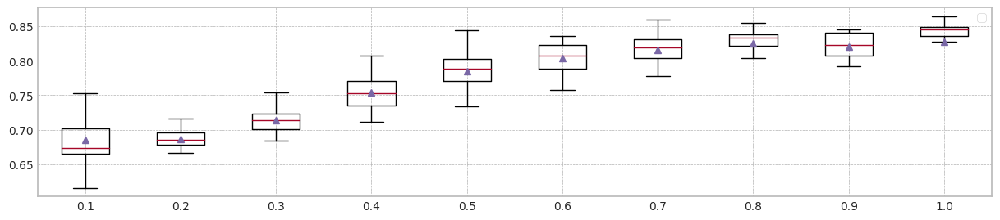

In [52]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()

In [ ]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.8,trial_count=20,lr_g=0.0001, weight_init=False)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [ ]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [ ]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

#### 실험

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



#### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


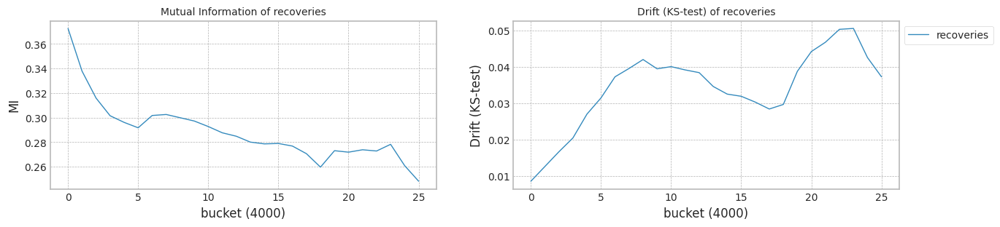

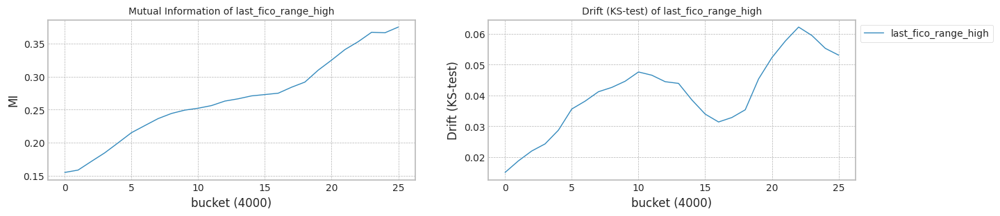

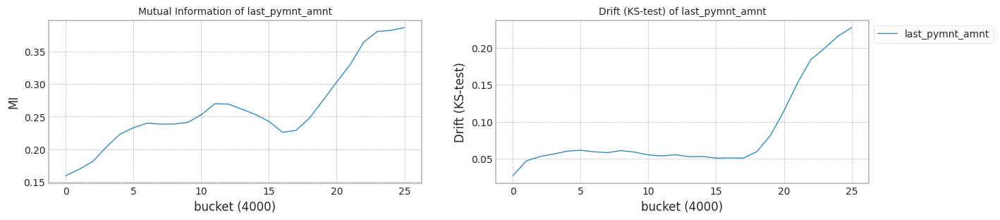

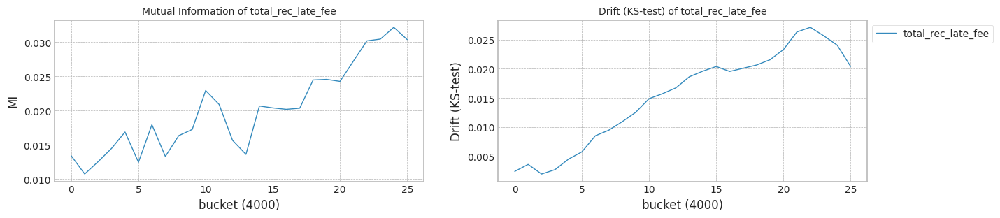

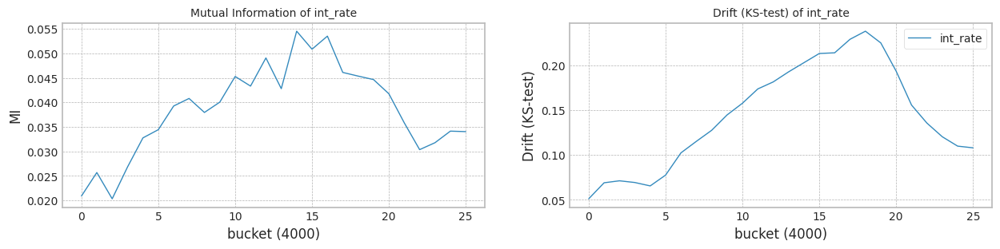

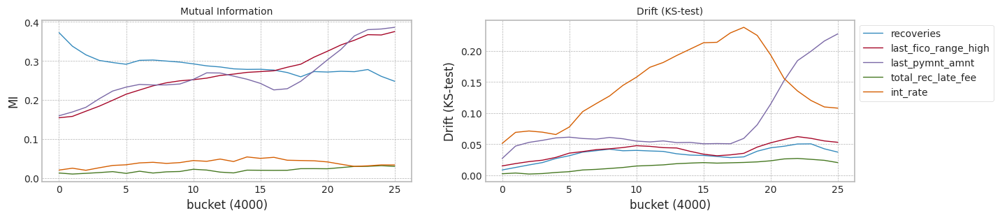

trial_count: 5
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.77it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 242.04it/s]


Test f1 score: 0.9727635459434453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.890110
last_fico_range_high    0.376694
last_pymnt_amnt         0.520060
total_rec_late_fee      0.933006
int_rate                0.148283
dtype: float64
Mean F1 for all data: 0.9444664129734469
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.9444664129734469
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.02it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 241.75it/s]


Test f1 score: 0.9734436473038649
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.909417
last_fico_range_high    0.260727
last_pymnt_amnt         0.524919
total_rec_late_fee      0.966113
int_rate                0.168433
dtype: float64
Mean F1 for all data: 0.935213595214157
Normal model median        : 0.9004895296926421
Drift tolerant model median: 0.939840004093802
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.05it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 239.06it/s]


Test f1 score: 0.9731355368554986
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.861119
last_fico_range_high    0.041975
last_pymnt_amnt         0.321646
total_rec_late_fee      0.921542
int_rate                0.146537
dtype: float64
Mean F1 for all data: 0.9609951125700883
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.9444664129734469
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 630.90it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 243.89it/s]


Test f1 score: 0.9715044605479689
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.857288
last_fico_range_high    0.652192
last_pymnt_amnt         0.520754
total_rec_late_fee      0.984831
int_rate                0.161071
dtype: float64
Mean F1 for all data: 0.9119265115565989
Normal model median        : 0.9105347252716585
Drift tolerant model median: 0.939840004093802
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.39it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.36it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 237.87it/s]


Test f1 score: 0.9731308749096168
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.909710
last_fico_range_high    0.273225
last_pymnt_amnt         0.515773
total_rec_late_fee      0.914465
int_rate                0.185346
dtype: float64
Mean F1 for all data: 0.9185152901359536
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.935213595214157
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9424533304537714
SEA median: 0.9424533304537714
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408399629739275
AUE median: 0.9408399629739275
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.945727965475685
DTEL median: 0.945727965475685
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9303219529601837
SEA median: 0.9363876417069776
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9313086849382545
AUE median: 0.9360743239560909
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9349205337745367
DTEL median: 0.9403242496251109
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  3813.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9563131547935987
SEA median: 0.9424533304537714
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  3759.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9540475893557896
AUE median: 0.9408399629739275
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9589411585287255
DTEL median: 0.945727965475685
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408632770268676
SEA median: 0.9416583037403194
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408216482608576
AUE median: 0.9408308056173925
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448269728185472
DTEL median: 0.9452774691471162
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9529526623355888
SEA median: 0.9424533304537714
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.70it/s]


Early stop at  3445.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.951492515887728
AUE median: 0.9408399629739275
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9556369813932666
DTEL median: 0.945727965475685


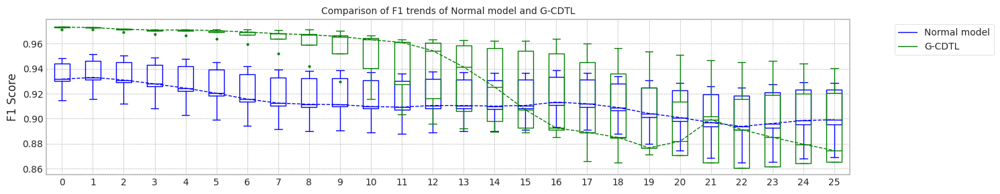

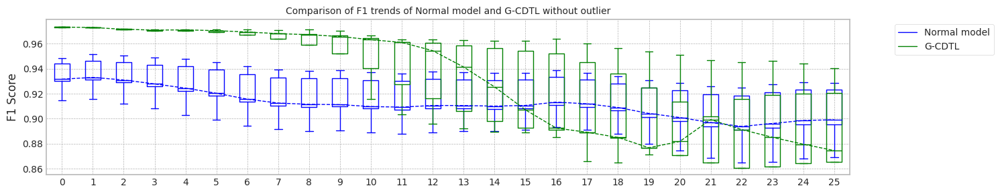

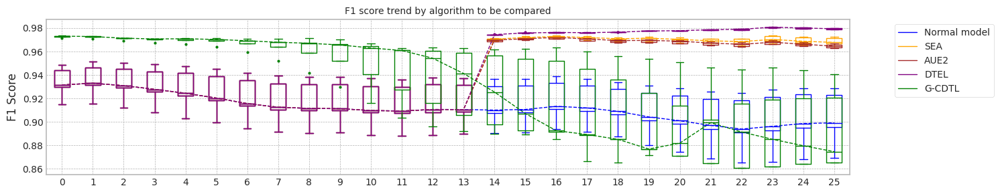

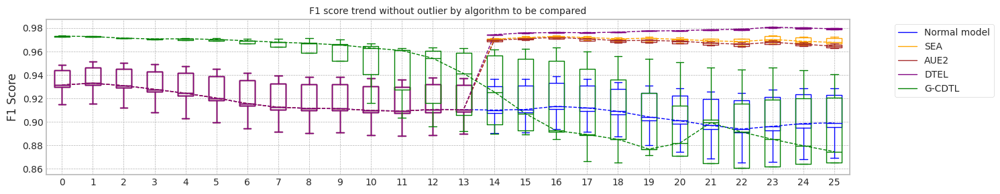

max_mean_trial= 2


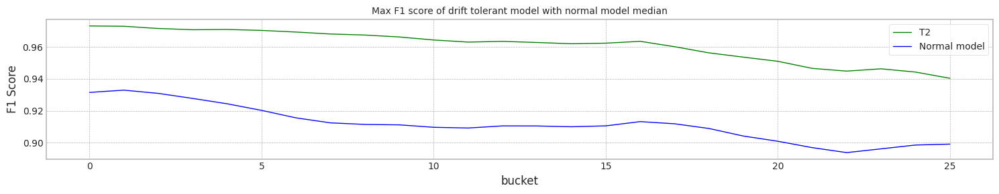

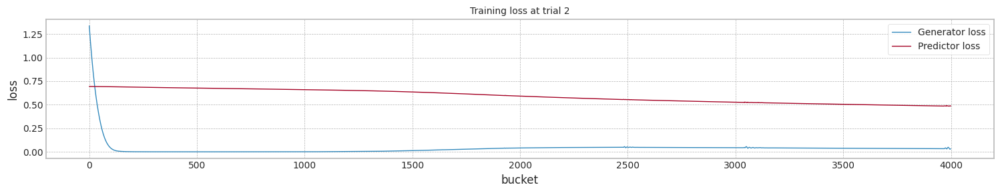

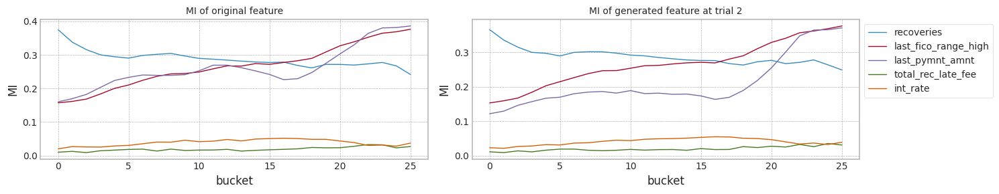

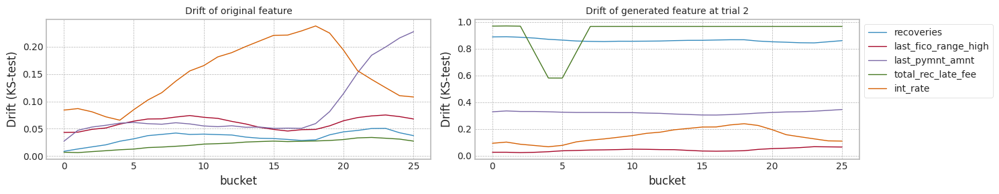

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.911685,0.899187,11.174685
1,1.0,0.914936,0.915483,0.889294,0.869137,11.354770
2,2.0,0.948400,0.951299,0.937524,0.928591,11.181534
3,3.0,0.929945,0.931279,0.909384,0.895627,11.281425
4,4.0,0.943863,0.946336,0.931602,0.923030,11.071465
5,median,0.931536,0.932966,0.911685,0.899187,11.181534
6,std,0.013136,0.014071,0.019250,0.023831,0.108709


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.942453,0.967760,16.083705
1,1.0,0.914936,0.915483,0.930322,0.963535,16.036186
2,2.0,0.948400,0.951299,0.956313,0.971213,15.790520
3,3.0,0.929945,0.931279,0.940863,0.966595,15.971495
4,4.0,0.943863,0.946336,0.952953,0.972386,15.943434
5,median,0.931536,0.932966,0.942453,0.967760,15.971495
6,std,0.013136,0.014071,0.010361,0.003574,0.111925


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.940840,0.962989,15.949869
1,1.0,0.914936,0.915483,0.931309,0.967048,16.032032
2,2.0,0.948400,0.951299,0.954048,0.963171,15.868611
3,3.0,0.929945,0.931279,0.940822,0.965607,16.062974
4,4.0,0.943863,0.946336,0.951493,0.964522,15.297306
5,median,0.931536,0.932966,0.940840,0.964522,15.949869
6,std,0.013136,0.014071,0.009190,0.001705,0.313838


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.945728,0.978888,20.571880
1,1.0,0.914936,0.915483,0.934921,0.979842,20.572137
2,2.0,0.948400,0.951299,0.958941,0.979858,20.595141
3,3.0,0.929945,0.931279,0.944827,0.979434,20.833261
4,4.0,0.943863,0.946336,0.955637,0.978699,20.764348
5,median,0.931536,0.932966,0.945728,0.979434,20.595141
6,std,0.013136,0.014071,0.009544,0.000535,0.122810


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.972764,0.972619,0.944466,0.874609,11.097843
1,1.0,0.973444,0.973071,0.935214,0.920478,10.931492
2,2.0,0.973136,0.972934,0.960995,0.940375,10.987746
3,3.0,0.971504,0.971081,0.911927,0.865538,10.857122
4,4.0,0.973131,0.972759,0.918515,0.865538,10.898088
5,median,0.973131,0.972759,0.935214,0.874609,10.931492
6,std,0.000761,0.000808,0.019790,0.034805,0.093336


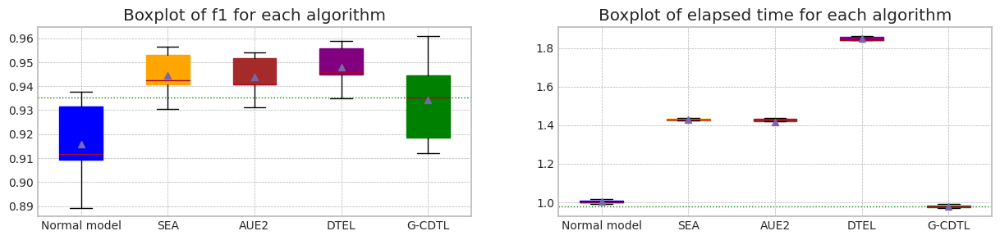

In [ ]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,lambda_f2=0.8,trial_count=5,lr_g=0.0001,weight_init= True)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [ ]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [ ]:
b_cnt = X2.groupby(['b'])['b'].count()

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [ ]:
b_cnt2 = X3.groupby(['b'])['b'].count()

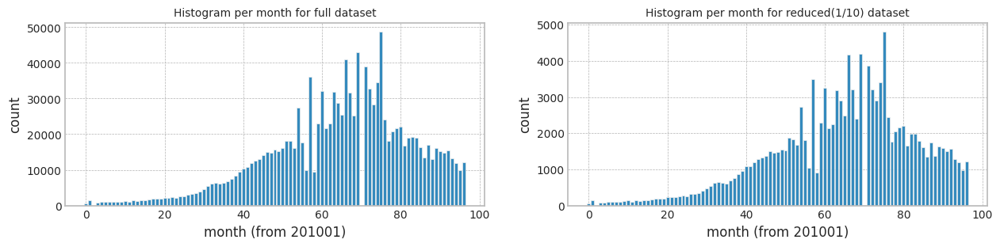

In [ ]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [ ]:
X3.drop(columns=['issue_d'],inplace=True)

In [ ]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

In [ ]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [ ]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 21.40it/s]


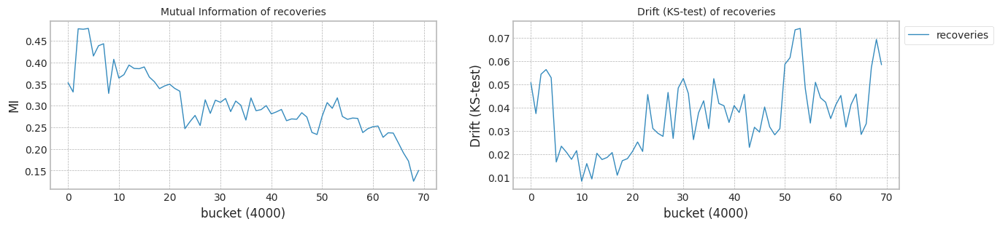

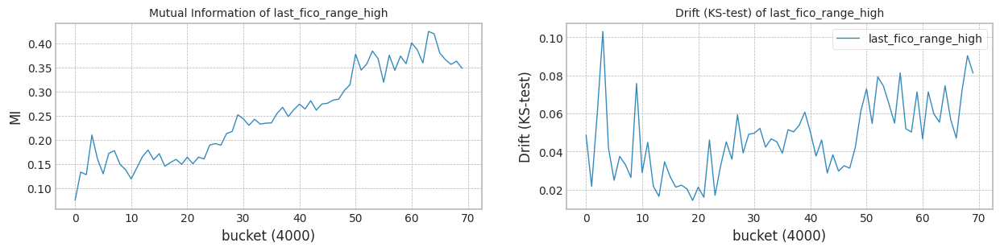

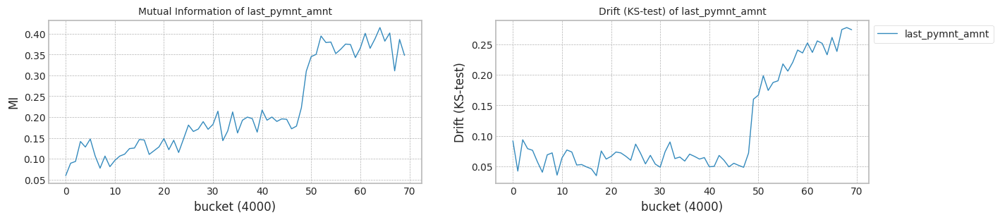

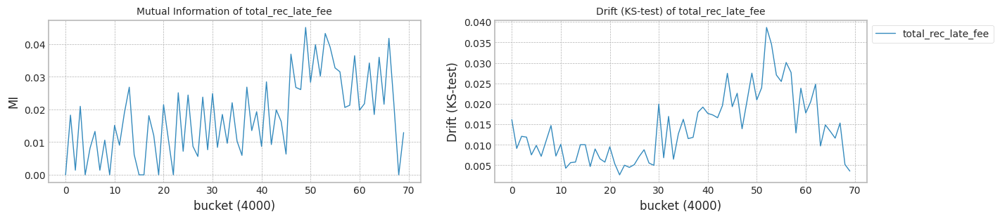

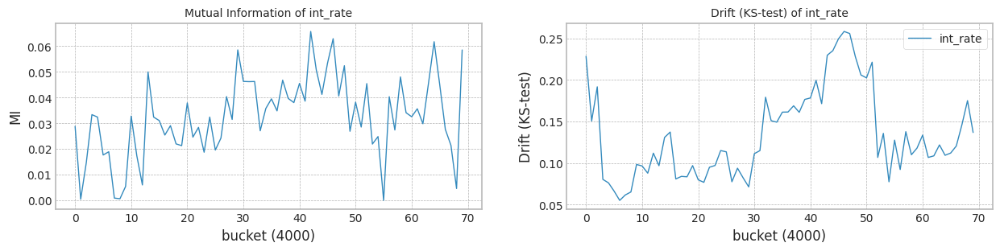

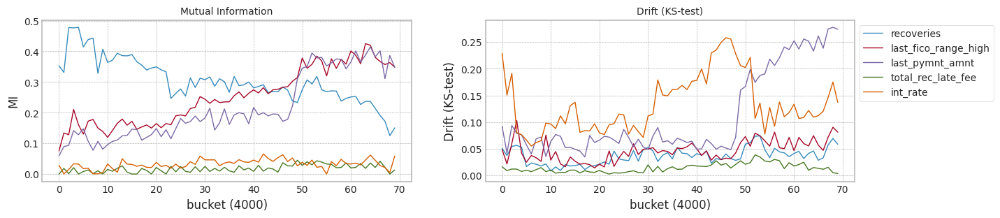

In [ ]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.76it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.839190
last_fico_range_high    0.118193
last_pymnt_amnt         0.456381
total_rec_late_fee      0.923097
int_rate                0.150386
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.05it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.16it/s]


Test f1 score: 0.9734703632887189
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.860508
last_fico_range_high    0.211504
last_pymnt_amnt         0.443587
total_rec_late_fee      0.966117
int_rate                0.145680
dtype: float64
Mean F1 for all data: 0.9604134556403301
Normal model median        : 0.9000762145213159
Drift tolerant model median: 0.9233827116788869
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.66it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.9735576204846276
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.861336
last_fico_range_high    0.061978
last_pymnt_amnt         0.090937
total_rec_late_fee      0.912908
int_rate                0.145516
dtype: float64
Mean F1 for all data: 0.9603925493741498
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9603925493741498
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.57it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860355
last_fico_range_high    0.226174
last_pymnt_amnt         0.448863
total_rec_late_fee      0.910412
int_rate                0.145422
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9103743100077333
Drift tolerant model median: 0.9233722585457966
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.34it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.60it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.884093
last_fico_range_high    0.117435
last_pymnt_amnt         0.447276
total_rec_late_fee      0.966117
int_rate                0.148990
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.61it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.31it/s]


Test f1 score: 0.9727712426106168
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860938
last_fico_range_high    0.234798
last_pymnt_amnt         0.447830
total_rec_late_fee      0.965842
int_rate                0.148211
dtype: float64
Mean F1 for all data: 0.9598060923729962
Normal model median        : 0.9157032188024651
Drift tolerant model median: 0.9230790300452199
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.36it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.32it/s]


Test f1 score: 0.9729439168607776
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.837472
last_fico_range_high    0.156647
last_pymnt_amnt         0.445722
total_rec_late_fee      0.966117
int_rate                0.144360
dtype: float64
Mean F1 for all data: 0.9602900009592165
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9598060923729962
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.56it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.9735756561248281
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860550
last_fico_range_high    0.129273
last_pymnt_amnt         0.448609
total_rec_late_fee      0.913465
int_rate                0.138646
dtype: float64
Mean F1 for all data: 0.9604171040568438
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9600480466661063
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.77it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.96it/s]


Test f1 score: 0.973677134064358
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.831440
last_fico_range_high    0.060544
last_pymnt_amnt         0.107828
total_rec_late_fee      0.966091
int_rate                0.146404
dtype: float64
Mean F1 for all data: 0.9624386393298676
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.76it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.51it/s]


Test f1 score: 0.9733524526498177
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860564
last_fico_range_high    0.121152
last_pymnt_amnt         0.443411
total_rec_late_fee      0.966117
int_rate                0.148492
dtype: float64
Mean F1 for all data: 0.9602839030315502
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.96it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.37it/s]


Test f1 score: 0.9736983681032937
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860521
last_fico_range_high    0.122137
last_pymnt_amnt         0.436490
total_rec_late_fee      0.911517
int_rate                0.149409
dtype: float64
Mean F1 for all data: 0.9606837719568625
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.28it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.69it/s]


Test f1 score: 0.9731732090577763
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.166165
last_pymnt_amnt         0.444770
total_rec_late_fee      0.918991
int_rate                0.149887
dtype: float64
Mean F1 for all data: 0.9602263361246611
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.36it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.13it/s]


Test f1 score: 0.9730924294460205
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.860906
last_fico_range_high    0.195657
last_pymnt_amnt         0.449644
total_rec_late_fee      0.911523
int_rate                0.153141
dtype: float64
Mean F1 for all data: 0.9602412325308487
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.55it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.19it/s]


Test f1 score: 0.9731796188997073
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.860740
last_fico_range_high    0.125030
last_pymnt_amnt         0.442625
total_rec_late_fee      0.966117
int_rate                0.145898
dtype: float64
Mean F1 for all data: 0.9602908523073636
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.14it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860814
last_fico_range_high    0.135563
last_pymnt_amnt         0.459195
total_rec_late_fee      0.910511
int_rate                0.143804
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602839030315502
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.78it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.27it/s]


Test f1 score: 0.9732409509019233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.834002
last_fico_range_high    0.084274
last_pymnt_amnt         0.445078
total_rec_late_fee      0.966117
int_rate                0.148018
dtype: float64
Mean F1 for all data: 0.9603434862606328
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.80it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9732668239792107
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.830893
last_fico_range_high    0.135467
last_pymnt_amnt         0.451978
total_rec_late_fee      0.909254
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.960804547658361
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602900009592165
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.93it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.29it/s]


Test f1 score: 0.9667675508871877
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.829677
last_fico_range_high    0.117879
last_pymnt_amnt         0.436873
total_rec_late_fee      0.912552
int_rate                0.150631
dtype: float64
Mean F1 for all data: 0.9447252871807236
Normal model median        : 0.9138404194354384
Drift tolerant model median: 0.9602869519953834
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.16it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.03it/s]


Test f1 score: 0.9730020308206905
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.152537
last_pymnt_amnt         0.450206
total_rec_late_fee      0.966117
int_rate                0.148483
dtype: float64
Mean F1 for all data: 0.9601253802381764
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.30it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.9730843913368187
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860782
last_fico_range_high    0.134715
last_pymnt_amnt         0.447058
total_rec_late_fee      0.966117
int_rate                0.147071
dtype: float64
Mean F1 for all data: 0.9640498487249046
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9434372175874329
SEA median: 0.9434372175874329
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9427118678737009
AUE median: 0.9427118678737009
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9469126677472031
DTEL median: 0.9469126677472031
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315806279513832
SEA median: 0.937508922769408
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9324359392321002
AUE median: 0.9375739035529005
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.936420709499617
DTEL median: 0.94166668862341
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9569764865466575
SEA median: 0.9434372175874329
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3946.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9550165232138966
AUE median: 0.9427118678737009
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  3690.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9594066711429882
DTEL median: 0.9469126677472031
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9421074854913221
SEA median: 0.9427723515393776
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:14<00:00,  1.81it/s]


Early stop at  3269.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9420176664530663
AUE median: 0.9423647671633836
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461391703462567
DTEL median: 0.9465259190467299
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9538313866175009
SEA median: 0.9434372175874329
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3650.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.952187059519167
AUE median: 0.9427118678737009
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9564025409267808
DTEL median: 0.9469126677472031
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3528.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475162616355332
SEA median: 0.945476739611483
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.946717421467241
AUE median: 0.944714644670471
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.38it/s]


Early stop at  3433.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9510743267390125
DTEL median: 0.9489934972431078
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.76it/s]


Early stop at  3619.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9305260838952056
SEA median: 0.9434372175874329
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306094657016183
AUE median: 0.9427118678737009
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:18<00:00,  1.45it/s]


Early stop at  2639.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.935475450892014
DTEL median: 0.9469126677472031
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.942008107484213
SEA median: 0.9427723515393776
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9406764532397117
AUE median: 0.9423647671633836
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461982978843603
DTEL median: 0.9465554828157816
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317845526448318
SEA median: 0.9421074854913221
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9308501150464421
AUE median: 0.9420176664530663
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9359139187835843
DTEL median: 0.9461982978843603
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457952957868749
SEA median: 0.9427723515393776
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3475.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9448210070744087
AUE median: 0.9423647671633836
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.94917462558209
DTEL median: 0.9465554828157816
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306513084101695
SEA median: 0.9421074854913221
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315662820151738
AUE median: 0.9420176664530663
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9355115015239918
DTEL median: 0.9461982978843603
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3652.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9496001424725632
SEA median: 0.9427723515393776
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9463950642864886
AUE median: 0.9423647671633836
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9525449576021937
DTEL median: 0.9465554828157816
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.78it/s]


Early stop at  3378.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9499718199737395
SEA median: 0.9434372175874329
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  3875.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9485428821951696
AUE median: 0.9427118678737009
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.39it/s]


Early stop at  3226.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527050009564293
DTEL median: 0.9469126677472031
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3916.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9343424077103123
SEA median: 0.9427723515393776
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9333091907547976
AUE median: 0.9423647671633836
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9385764663011004
DTEL median: 0.9465554828157816
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338212786420397
SEA median: 0.9421074854913221
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338030503980634
AUE median: 0.9420176664530663
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9384694052188743
DTEL median: 0.9461982978843603
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527689810184283
SEA median: 0.9427723515393776
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9500320997895386
AUE median: 0.9423647671633836
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.955808106952902
DTEL median: 0.9465554828157816
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.948969997656747
SEA median: 0.9434372175874329
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475597986263469
AUE median: 0.9427118678737009
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9519216633367501
DTEL median: 0.9469126677472031
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461353536503341
SEA median: 0.9446162566871539
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457556529523904
AUE median: 0.9437664374740549
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9498098434309357
DTEL median: 0.9480436466646465
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9366234069379338
SEA median: 0.9434372175874329
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9367770884818413
AUE median: 0.9427118678737009
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.36it/s]


Early stop at  3454.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9409907863747304
DTEL median: 0.9469126677472031
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  3956.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9310201869915851
SEA median: 0.9427723515393776
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317932869869191
AUE median: 0.9423647671633836
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9356282927391766
DTEL median: 0.9465554828157816


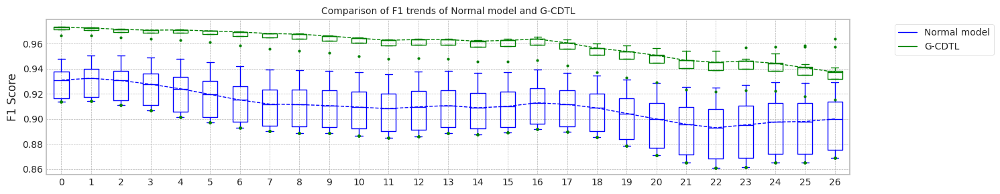

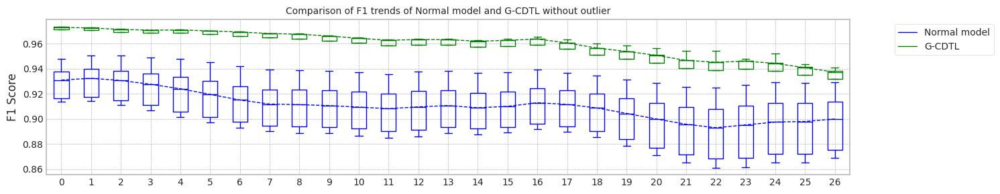

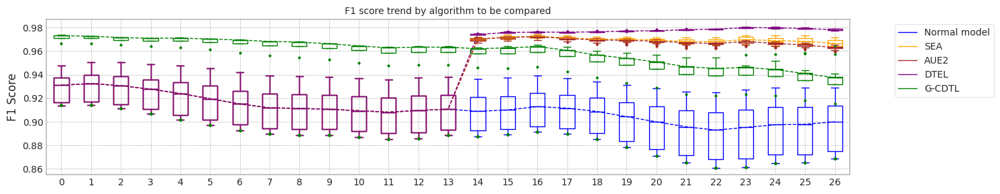

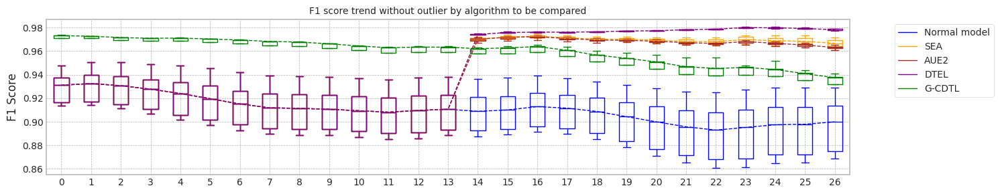

max_mean_trial= 19


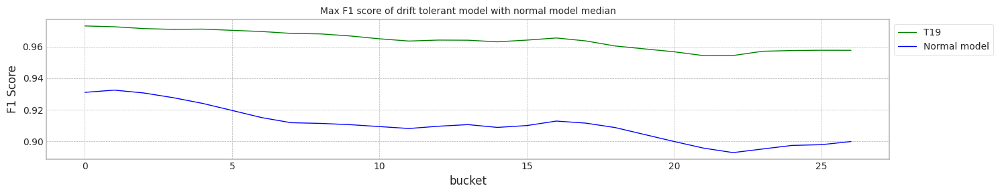

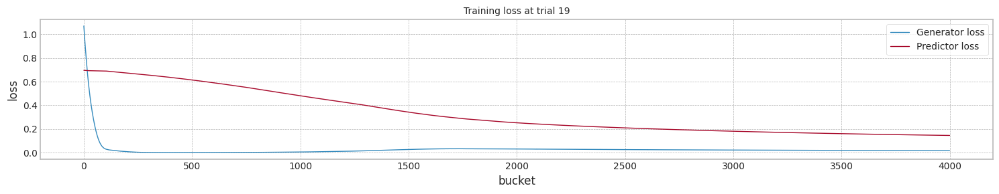

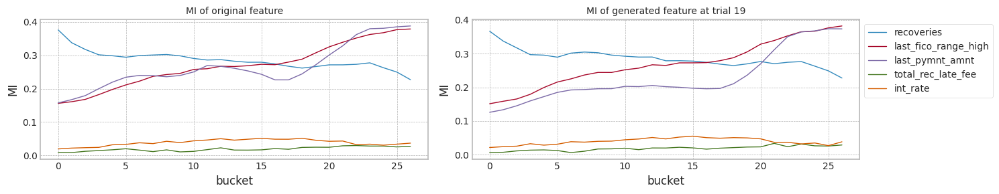

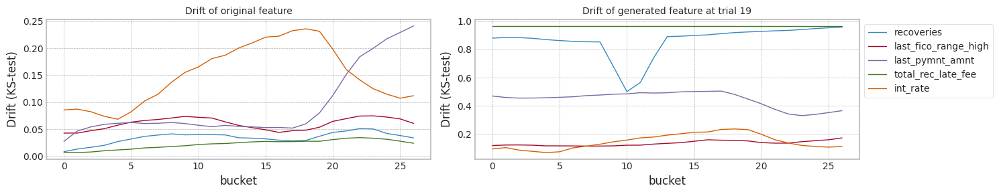

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.911534,0.901259,11.379239
1,1.0,0.914917,0.915411,0.888618,0.871554,11.276924
2,2.0,0.947967,0.950835,0.937302,0.929225,11.182854
3,3.0,0.929941,0.931322,0.909215,0.897891,11.221706
4,4.0,0.943655,0.946107,0.931548,0.924324,11.228681
5,5.0,0.936542,0.938706,0.919872,0.910125,11.439250
6,6.0,0.913920,0.914225,0.886404,0.869075,11.079628
7,7.0,0.930526,0.931928,0.909768,0.898559,11.368684
8,8.0,0.913981,0.914286,0.886352,0.868803,11.125999
9,9.0,0.934189,0.936073,0.916147,0.906747,11.135548


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.943437,0.965954,15.998663
1,1.0,0.914917,0.915411,0.931581,0.962783,15.982797
2,2.0,0.947967,0.950835,0.956976,0.971848,15.749534
3,3.0,0.929941,0.931322,0.942107,0.965733,15.936639
4,4.0,0.943655,0.946107,0.953831,0.969756,16.015630
5,5.0,0.936542,0.938706,0.947516,0.967866,15.249601
6,6.0,0.913920,0.914225,0.930526,0.960847,15.366096
7,7.0,0.930526,0.931928,0.942008,0.967109,15.960129
8,8.0,0.913981,0.914286,0.931785,0.966218,15.760332
9,9.0,0.934189,0.936073,0.945795,0.968102,15.885425


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.942712,0.963624,16.006109
1,1.0,0.914917,0.915411,0.932436,0.964399,16.079503
2,2.0,0.947967,0.950835,0.955017,0.962696,15.924646
3,3.0,0.929941,0.931322,0.942018,0.963589,14.945316
4,4.0,0.943655,0.946107,0.952187,0.964002,15.436364
5,5.0,0.936542,0.938706,0.946717,0.962677,15.864585
6,6.0,0.913920,0.914225,0.930609,0.962097,15.896803
7,7.0,0.930526,0.931928,0.940676,0.960976,15.894116
8,8.0,0.913981,0.914286,0.930850,0.962658,15.799155
9,9.0,0.934189,0.936073,0.944821,0.963314,15.286578


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.946913,0.978014,20.634893
1,1.0,0.914917,0.915411,0.936421,0.979074,20.720251
2,2.0,0.947967,0.950835,0.959407,0.977594,20.119611
3,3.0,0.929941,0.931322,0.946139,0.979047,20.406431
4,4.0,0.943655,0.946107,0.956403,0.977791,20.461607
5,5.0,0.936542,0.938706,0.951074,0.978112,19.575822
6,6.0,0.913920,0.914225,0.935475,0.978087,18.689498
7,7.0,0.930526,0.931928,0.946198,0.977757,20.480794
8,8.0,0.913981,0.914286,0.935914,0.979131,20.451813
9,9.0,0.934189,0.936073,0.949175,0.977773,20.507424


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.913981,0.914286,0.886352,0.868803,11.034705
1,1.0,0.973470,0.972963,0.960413,0.937697,11.098545
2,2.0,0.973558,0.972963,0.960393,0.937372,11.050986
3,3.0,0.913981,0.914286,0.886352,0.868803,11.005542
4,4.0,0.913981,0.914286,0.886352,0.868803,11.009916
5,5.0,0.972771,0.972267,0.959806,0.937461,11.029070
6,6.0,0.972944,0.972438,0.960290,0.939589,10.915220
7,7.0,0.973576,0.972955,0.960417,0.938137,11.038248
8,8.0,0.973677,0.973025,0.962439,0.964127,11.097866
9,9.0,0.973352,0.972875,0.960284,0.937250,11.059224


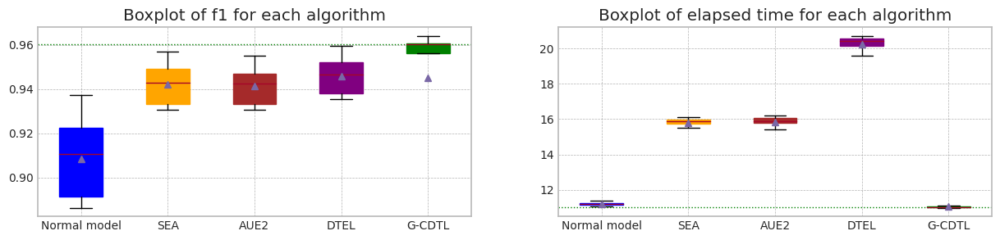

In [ ]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init=True)